<h1 style="font-family:Corbel Light; color:#00ced1">Projet 5 : Segmentez des clients d'un site e-commerce </h1>

<h2 style="font-family:Corbel Light; color:#737373"><span style="color:#00ced1">Étape 2</span> : Modélisation </h2>

<h3 style="font-family:Corbel Light; color:#737373">Requirements</h3>

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib
from matplotlib import pyplot as plt
import toolbox

import scipy
from scipy.cluster.hierarchy import dendrogram, linkage

import sklearn
from sklearn.cluster import AgglomerativeClustering, KMeans, DBSCAN
from sklearn.neighbors import NearestNeighbors
from sklearn.decomposition import PCA, KernelPCA
from sklearn.preprocessing import StandardScaler, FunctionTransformer, Binarizer
from sklearn import manifold, metrics
from sklearn.utils import resample
from sklearn.pipeline import Pipeline, make_pipeline


import yellowbrick
from yellowbrick.cluster import KElbowVisualizer, SilhouetteVisualizer, silhouette_visualizer
from yellowbrick.cluster.elbow import kelbow_visualizer

%matplotlib inline
pd.options.display.float_format = '{:_.2f}'.format

In [2]:
python_version = !python -V
print('python version :', python_version, '\n')

print('pandas version : ', pd.__version__, '\n')
print('numpy version : ', np.__version__, '\n')
print('matplotlib version : ', matplotlib.__version__, '\n')
print('seaborn version : ', sns.__version__, '\n')
print('scipy version : ', scipy.__version__, '\n')
print('scikit-learn version : ', sklearn.__version__, '\n')
print('yellowbrick version : ', yellowbrick.__version__, '\n')

python version : ['Python 3.9.12'] 

pandas version :  1.4.2 

numpy version :  1.21.5 

matplotlib version :  3.5.1 

seaborn version :  0.12.1 

scipy version :  1.9.1 

scikit-learn version :  1.2.1 

yellowbrick version :  1.5 



**Versions utilisées :**

- python : Python 3.9.12 
- seaborn    :  0.12.1
- matplotlib :  3.5.1 
- numpy  :  1.21.5 
- pandas :  1.4.2
- scipy :  1.9.1 
- scikit-learn  :  1.2.1
- yellowbrick  :  1.5  

<h3 style="font-family:Corbel Light; color:#737373">Inspection des données</h3>

In [3]:
customer_data = pd.read_pickle('customer_behavior_data.pkl')
customer_data.set_index('customer_unique_id', inplace=True)

In [4]:
customer_data.head()

,days_since_last_purchase,order_n,payment_value_total,review_score_mean,products_mean
customer_unique_id,,,,,
0000366f3b9a7992bf8c76cfdf3221e2,160,1,141.90,5.00,1.00
0000b849f77a49e4a4ce2b2a4ca5be3f,163,1,27.19,4.00,1.00
0000f46a3911fa3c0805444483337064,585,1,86.22,3.00,1.00
0000f6ccb0745a6a4b88665a16c9f078,369,1,43.62,4.00,1.00
0004aac84e0df4da2b147fca70cf8255,336,1,196.89,5.00,1.00


---

---

<h3 style="font-family:Corbel Light; color:#737373">Modifications apportées sous 48H suite à la soutenance : </h3>

Dans cette modification, demandée par l'examinateur lors de la soutenance, nous allons reprendre toute la méthodologie et : 
- appliquer des transformations aux variables (autres que le StandardScaler)
- comparer les résultats obtenus avec les algorithmes Classification ascendante hiérarchique (CAH), KMeans et DBSCAN pour les 4 variables suivantes :
    - nombre de jours depuis la dernière commande
    - nombre de commandes passées
    - montant total dépensé
    - note moyenne par commande

Pour aller plus vite, nous allons travailler uniquement sur l'échantillon de 3% de clients ayant passé plusieurs commandes. 

<h4 style="font-family:Corbel Light; color:#737373">Préparation des données</h4>

In [5]:
X = customer_data.loc[customer_data['order_n'] > 1].copy()
X.drop(columns='products_mean', inplace=True)
X.shape

(2997, 4)

Appliquons une transformation logarithmique à la variable 'payment_value_total' qui présente une asymétrie positive.

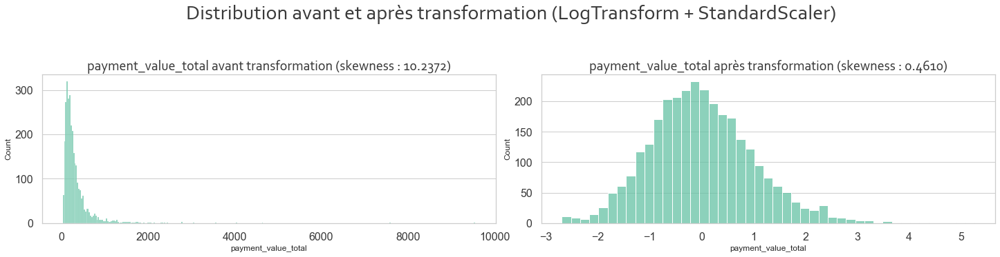

In [6]:
toolbox.test_transformer(X, ['payment_value_total'],
                         [FunctionTransformer(np.log1p), StandardScaler()],
                         'LogTransform + StandardScaler', (20, 5), top=0.7
                         )

In [7]:
X['order_n'].value_counts(normalize=True)

2    0.92
3    0.07
4    0.01
5    0.00
6    0.00
7    0.00
9    0.00
17   0.00
Name: order_n, dtype: float64

Transformons la variable 'order_n' en une variable binaire

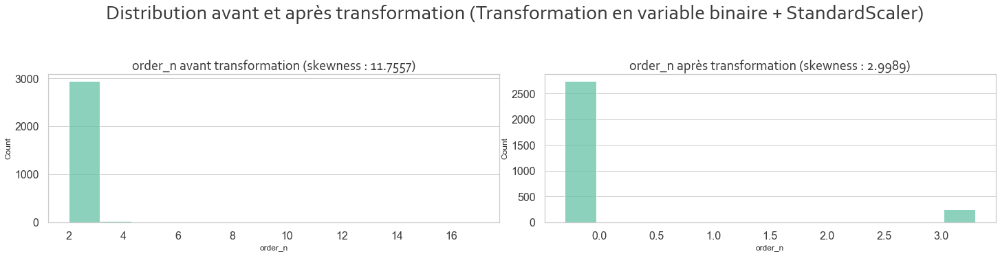

In [8]:
toolbox.test_transformer(X, ['order_n'],
                         [Binarizer(threshold=2), StandardScaler()],
                         'Transformation en variable binaire + StandardScaler', (20, 5), top=0.7
                         )

Appliquons uniquement un StandardScaler aux deux autres variables.

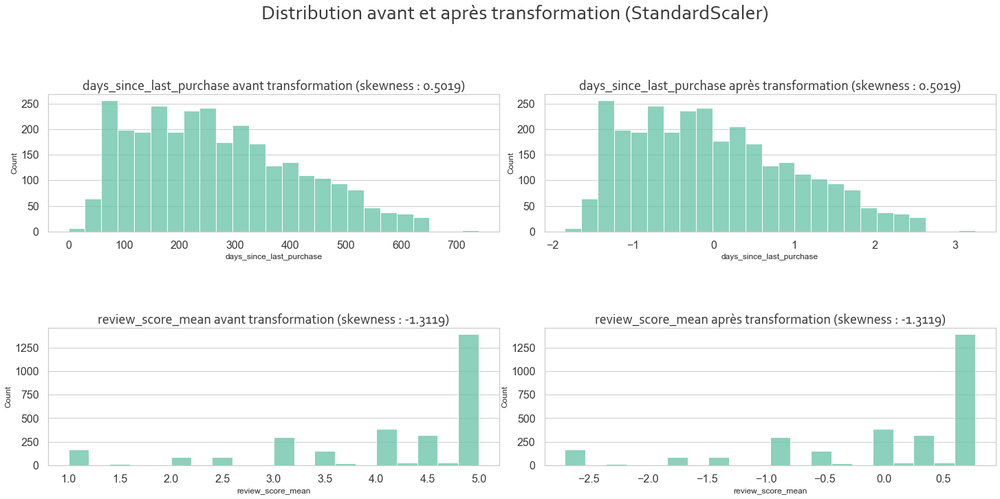

In [9]:
toolbox.test_transformer(X, ['days_since_last_purchase', 'review_score_mean'],
                         [StandardScaler()], 'StandardScaler', (20, 10), top=0.8
                         )

In [10]:
transformers = [{'feature': ['payment_value_total'],
                 'estimator': [FunctionTransformer(np.log1p, feature_names_out='one-to-one'), StandardScaler()]},
                {'feature': ['days_since_last_purchase', 'review_score_mean'],
                 'estimator': [StandardScaler()]},
                {'feature': ['order_n'],
                 'estimator': [Binarizer(threshold=2), StandardScaler()]}
                ]

preprocessor = toolbox.make_preprocessor(transformers)

In [11]:
preprocessor

ColumnTransformer(transformers=[('pipeline-1',
                                 Pipeline(steps=[('functiontransformer',
                                                  FunctionTransformer(feature_names_out='one-to-one',
                                                                      func=<ufunc 'log1p'>)),
                                                 ('standardscaler',
                                                  StandardScaler())]),
                                 ['payment_value_total']),
                                ('pipeline-2',
                                 Pipeline(steps=[('standardscaler',
                                                  StandardScaler())]),
                                 ['days_since_last_purchase',
                                  'review_score_mean']),
                                ('pipeline-3',
                                 Pipeline(steps=[('binarizer',
                                                  Binarizer(threshold=2)),
                                                 ('standardscaler',
                                                  StandardScaler())]),
                                 ['order_n'])])

In [12]:
X_transformed = preprocessor.fit_transform(X)
X_transformed.shape

(2997, 4)

<h4 style="font-family:Corbel Light; color:#737373">Clustering Hiérarchique (méthode ascendante)</h4>

Choix du nombre de clusters: 

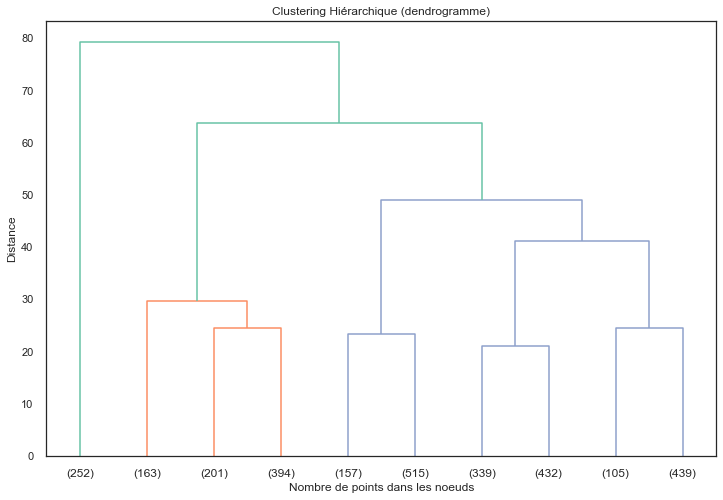

In [13]:
toolbox.display_dendrogram(X_transformed, 10)

Essayons pour 5 clusters

In [26]:
cah_5 = AgglomerativeClustering(n_clusters=5, linkage="ward")
cah_5.fit(X_transformed)

AgglomerativeClustering(n_clusters=5)

Visualisation des données : 

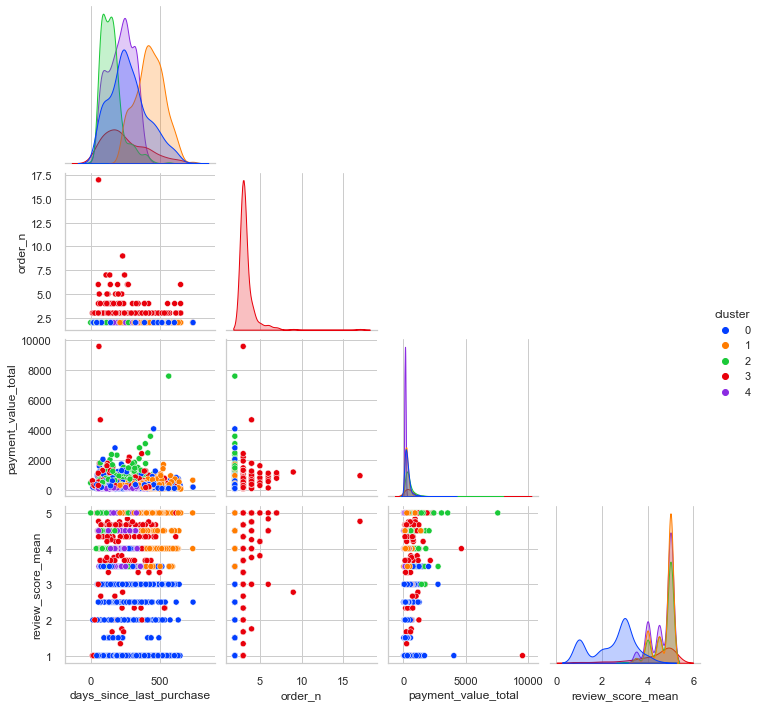

In [27]:
toolbox.pairplot_clusters(X, cah_5.labels_, palette='bright')

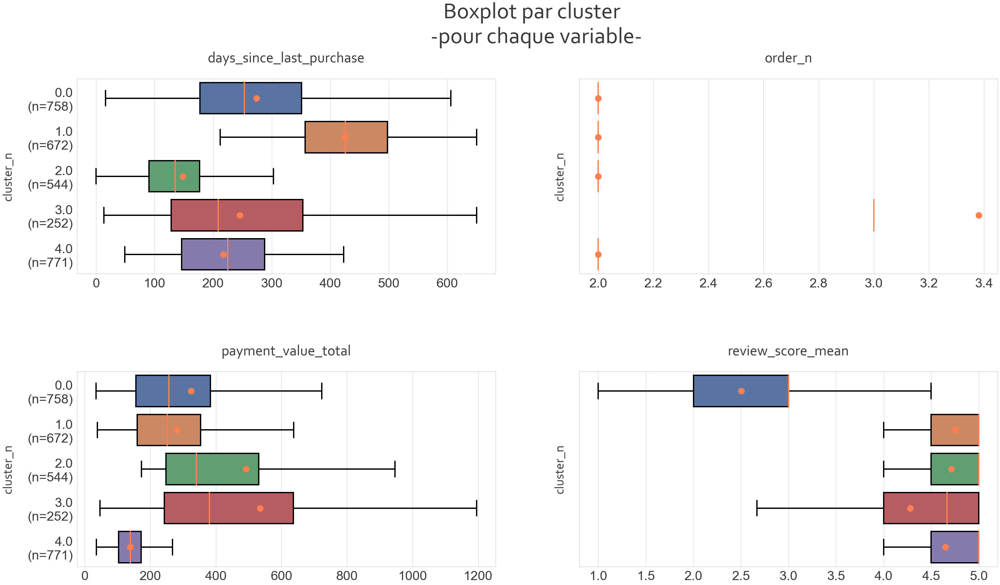

In [28]:
X_boxplot_cah_5 = toolbox.reshape_data_for_boxplot(X,
                                                   'cluster',
                                                   cah_5.labels_
                                                   )

toolbox.plot_boxplot_by_dimension(X_boxplot_cah_5, X.columns.values, 2,
                                  'par cluster \n -pour chaque variable-',
                                  (40, 25), 'cluster_n', True,
                                  top=0.85, hspace=0.5
                                  )

On peut distinguer : 

- Les clients ayant commandé 2 fois :
    - Les clients peu satisfaits :
        - cluster bleu (0) : ces clients dépensent moyennement.
    - Les clients très satisfaits :
        - cluster orange (1) : ces clients ont passé leur dernière commande il y a plutôt longtemps. Ils dépensent moyennement.
        - cluster vert (2) : ces clients ont commandé récemment et dépensent plus que les clients oranges et bleus
        - cluster violet (4) : ces clients dépensent le moins


- Les clients ayant commandé plus de 2 fois :
    - cluster rouge (3) : ces clients sont plutôt satisfaits. On trouve dans ce groupe les clients qui ont le plus dépensé au total (peut-être car ils commandent plus que les autres).

Evaluation :

Regardons si la partition obtenue est équilibrée

In [29]:
cluster_name_cah_5 = {0: "dissatisfied customers",
                      1: "sleeping customers",
                      2: "new customers",
                      3: "loyal customers",
                      4: "frugalists"}

X_boxplot_cah_5['cluster'] = X_boxplot_cah_5['cluster'].apply(lambda row:
                                                              cluster_name_cah_5[row]
                                                              )

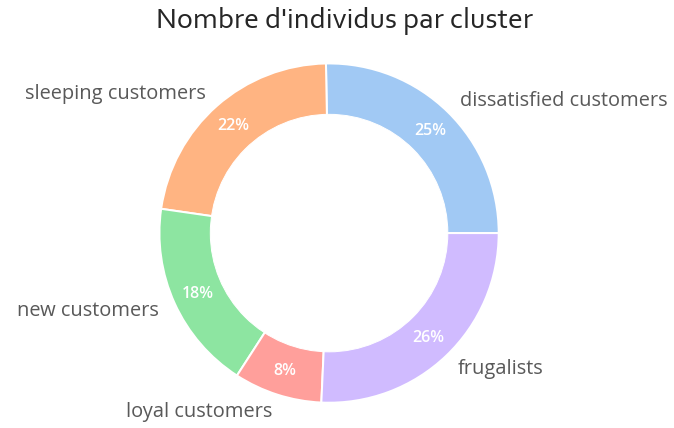

In [30]:
toolbox.plot_donut(X_boxplot_cah_5, 'cluster', 'Nombre d\'individus par cluster',
                   (10, 6), colors={'outside': sns.color_palette('pastel')}
                   )

Calculons le coefficient de silhouette moyen de ce clustering : Il est assez faible

Rappel: Le coefficient de silhouette mesure à quel point chaque observation appartient au "bon" cluster selon les critères d'homogénéité et de séparation. Plus il est proche de 1, meilleur est le clustering.

In [31]:
silhouette_cah_5 = metrics.silhouette_score(X_transformed,
                                            cah_5.labels_
                                            )
print("Coefficient de silhouette pour 5 clusters: %0.3f" % silhouette_cah_5)

Coefficient de silhouette pour 5 clusters: 0.242


Regardons pour 4 clusters : 

Le coefficient de silhouette est plus élevé, mais on obtient une partition moins équilibrée et moins facile à interpréter.

In [32]:
cah_4 = AgglomerativeClustering(n_clusters=4, linkage="ward")
cah_4.fit(X_transformed)

silhouette_cah_4 = metrics.silhouette_score(X_transformed,
                                            cah_4.labels_
                                            )
print("Coefficient de silhouette pour 4 clusters: %0.3f" % silhouette_cah_4)

Coefficient de silhouette pour 4 clusters: 0.261


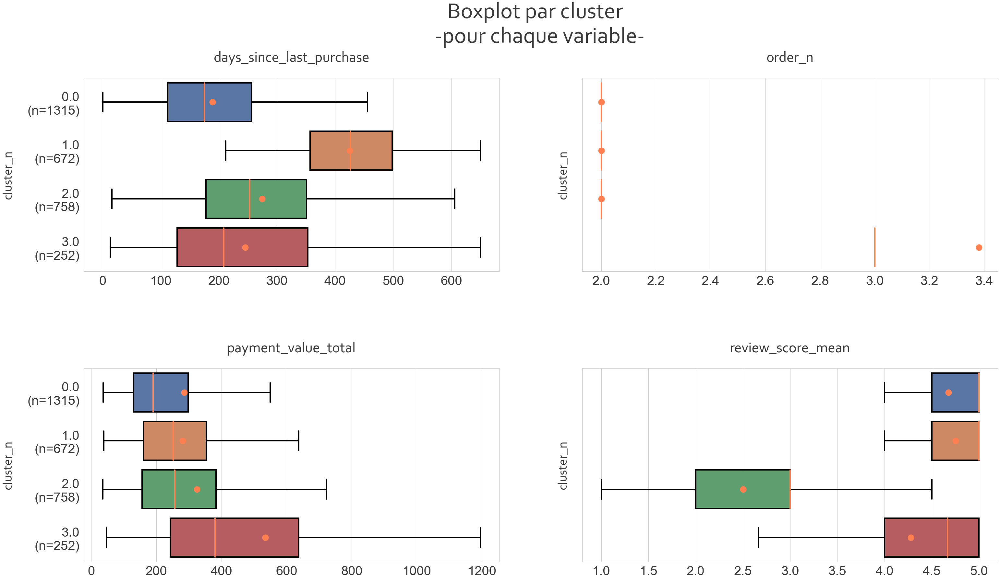

In [33]:
X_boxplot_cah_4 = toolbox.reshape_data_for_boxplot(X,
                                                   'cluster',
                                                   cah_4.labels_
                                                   )

toolbox.plot_boxplot_by_dimension(X_boxplot_cah_4, X.columns.values, 2,
                                  'par cluster \n -pour chaque variable-',
                                  (40, 25), 'cluster_n', True,
                                  top=0.85, hspace=0.5
                                  )

Les clusters "new spendthrifts" et "frugalists" de la partition précédente, on été regroupés en un cluster. Les autres clusters restent les mêmes. On a regroupé les clients qui dépensent le plus avec ceux qui dépensent le moins, car le critère du nombre de jours depuis la dernière commande semble primer.
- les clients ayant passé deux commandes : 
    - cluster vert (2) : clients les moins satisfaits
    - les clients très contents :
        - cluster bleu (0) : dernière commande assez récente, dépensent peu -> on a regroupé les clusters "frugalists" et "new spendthrifts"
        - cluster orange (1) : dernière commande assez ancienne, dépensent moyennement
 
- les clients ayant passé plus de deux commandes :
    - cluster rouge (3) : assez satisfaits, dépensent le plus (peut-être car commandent le plus)

In [34]:
cluster_name_cah_4 = {0: "new customers",
                      1: "sleeping average spenders",
                      2: "dissatisfied customers",
                      3: "loyal customers"}

X_boxplot_cah_4['cluster'] = X_boxplot_cah_4['cluster'].apply(lambda row:
                                                              cluster_name_cah_4[row]
                                                              )

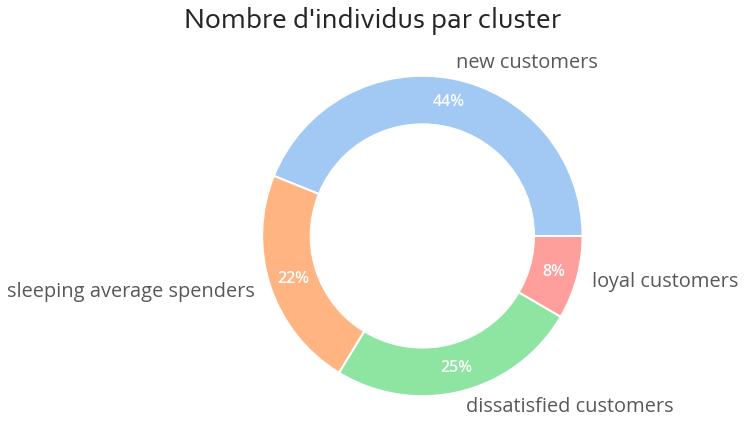

In [35]:
toolbox.plot_donut(X_boxplot_cah_4, 'cluster', 'Nombre d\'individus par cluster',
                   (10, 6), colors={'outside': sns.color_palette('pastel')}
                   )

<h4 style="font-family:Corbel Light; color:#737373">KMeans</h4>

Choix du nombre de clusters

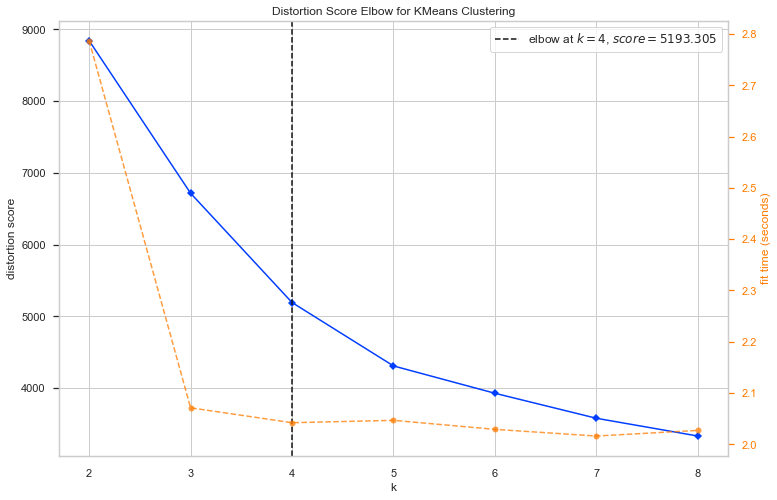

In [36]:
sns.set_theme(style='whitegrid', palette='bright')
plt.figure(figsize=(12, 8))
kelbow_visualizer(KMeans(random_state=8, n_init=10), X_transformed, k=(2, 9))
plt.show()

Essayons pour 4 clusters

In [37]:
kmeans_4 = KMeans(n_clusters=4, n_init=10, random_state=8)
kmeans_4.fit(X_transformed)

KMeans(n_clusters=4, n_init=10, random_state=8)

Visualisation des données

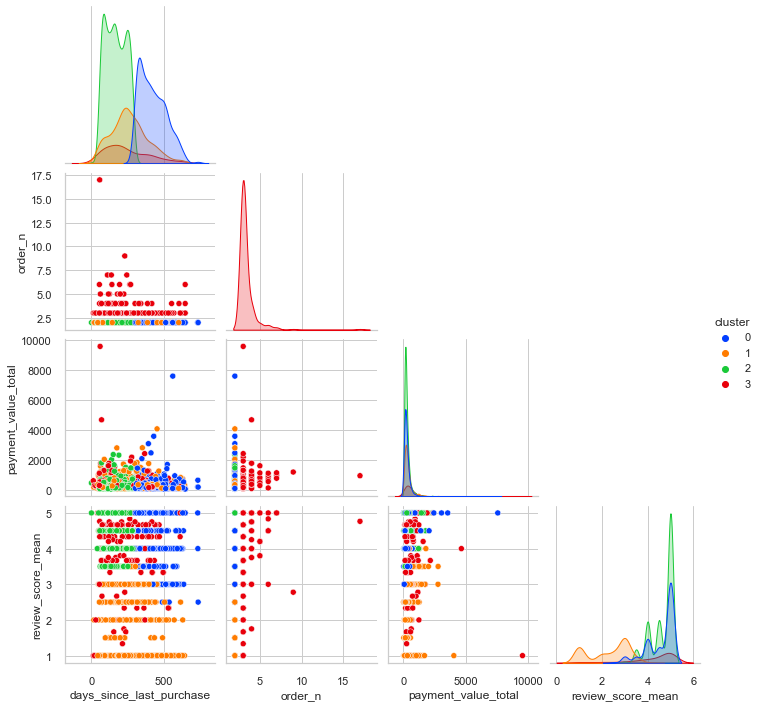

In [38]:
toolbox.pairplot_clusters(X, kmeans_4.labels_, palette='bright')

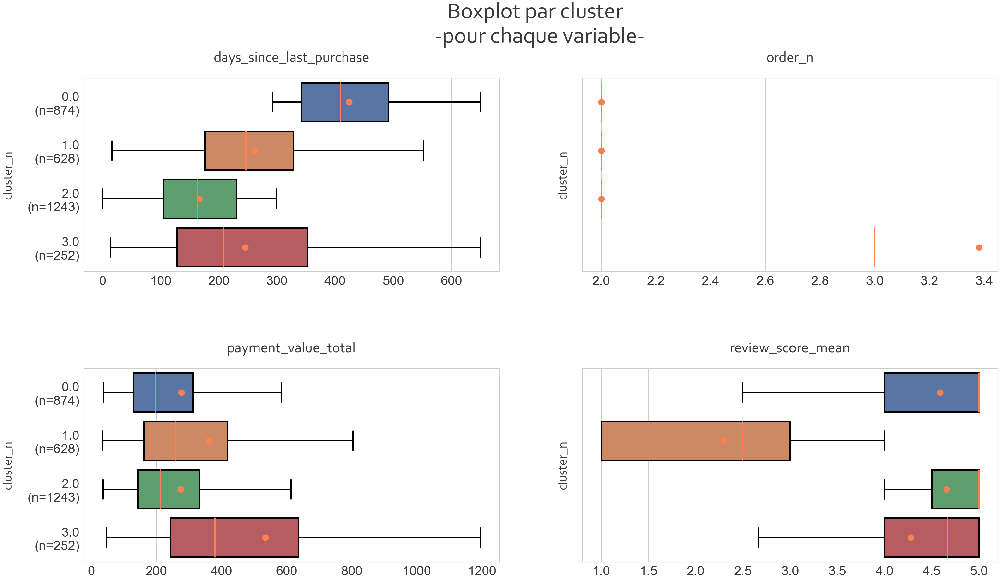

In [39]:
X_boxplot_kmeans_4 = toolbox.reshape_data_for_boxplot(X,
                                                      'cluster',
                                                      kmeans_4.labels_
                                                      )

toolbox.plot_boxplot_by_dimension(X_boxplot_kmeans_4, X.columns.values, 2,
                                  'par cluster \n -pour chaque variable-',
                                  (40, 25), 'cluster_n', True,
                                  top=0.85, hspace=0.5
                                  )

Tout comme avec l'algorithme de clustering agglomératif, on peut distinguer : 

- Les clients n'ayant passé que 2 commandes : 
    - clients les moins satisfaits :
        - cluster orange (1) : ces clients dépensent moyennement
    - clients plutôt satisfaits :
        - cluster bleu (0) : ces clients ont passé leur dernière commande il y a plutôt longtemps. Ils dépensent peu et sont plutôt satisfaits
        - cluster vert (2) : ces clients ont passé leur dernière commande assez récemment, ils dépensent peu et sont très contents 


- Les clients ayant passé plus de 2 commandes :
    - cluster rouge (3) : ces clients sont plutôt satisfaits et dépensent plus que les autres types de clients (peut-être car ils passent plus de commandes).

Evaluation : 

Regardons si la partition obtenue est équilibrée.

In [40]:
cluster_name_kmeans_4 = {0: "sleeping customers",
                         1: "dissatisfied customers",
                         2: "new customers",
                         3: "loyal customers"}

X_boxplot_kmeans_4['cluster'] = X_boxplot_kmeans_4['cluster'].apply(lambda row:
                                                                    cluster_name_kmeans_4[row]
                                                                    )

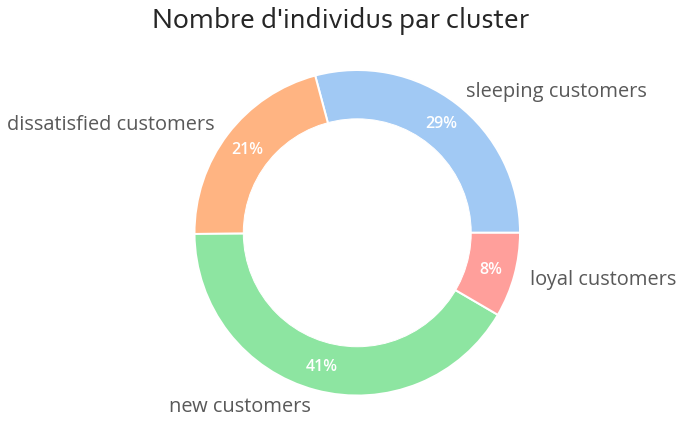

In [41]:
toolbox.plot_donut(X_boxplot_kmeans_4, 'cluster', 'Nombre d\'individus par cluster',
                   (10, 6), colors={'outside': sns.color_palette('pastel')}
                   )

Calculons le coefficient de silhouette moyen de ce clustering : il est plutôt faible.

In [42]:
silhouette_kmeans_4 = metrics.silhouette_score(X_transformed, kmeans_4.labels_)
print("Coefficient de silhouette moyen pour 4 clusters: %0.3f" %
      silhouette_kmeans_4)

Coefficient de silhouette moyen pour 4 clusters: 0.309


Regardons le coefficient de silhouette moyen de chaque cluster : 

- Peu de points ont un coefficient de silhouette en dessous de 0 (i.e. assignés au mauvais cluster). Ces point mal assignés se trouvent dans les clusters "dissatified customers" et "sleeping customers".

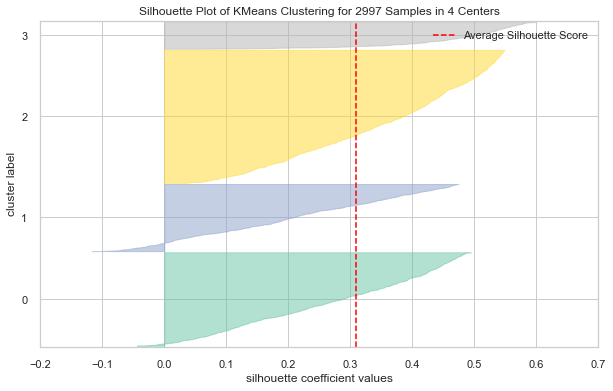

In [45]:
plt.figure(figsize=(10, 6))
silhouette_visualizer(kmeans_4, X_transformed,
                      colors='Set2', is_fitted=True
                      )
plt.show()

Essayons pour 5 clusters : le coefficient de silhouette moyen est légèrement inférieur.

In [46]:
kmeans_5 = KMeans(n_clusters=5, n_init=10, random_state=8)
kmeans_5.fit(X_transformed)

silhouette_kmeans_5 = metrics.silhouette_score(X_transformed, kmeans_5.labels_)
print("Coefficient de silhouette moyen pour 5 clusters: %0.3f" %
      silhouette_kmeans_5)

Coefficient de silhouette moyen pour 5 clusters: 0.297


Visualisation des données :

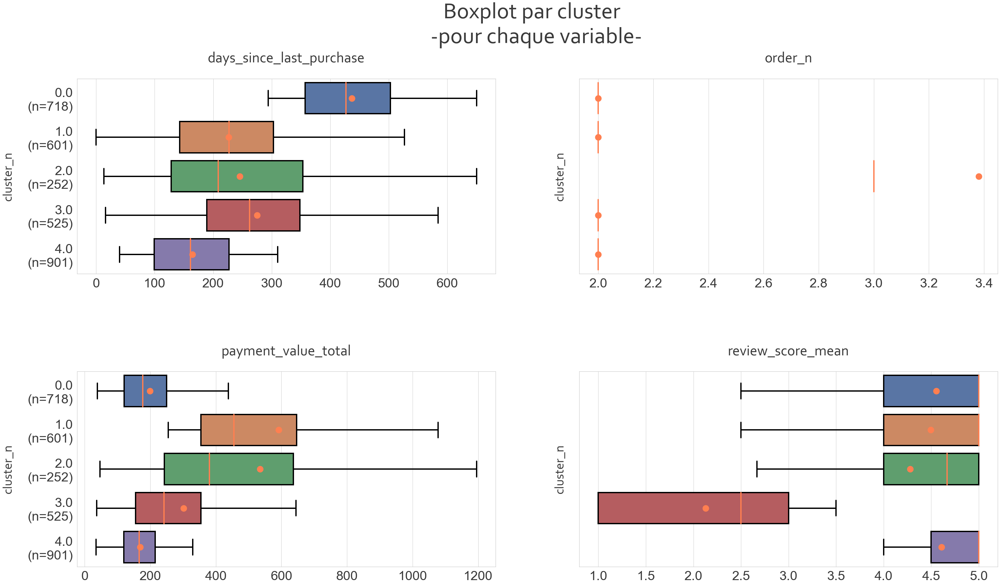

In [48]:
X_boxplot_kmeans_5 = toolbox.reshape_data_for_boxplot(X,
                                                      'cluster',
                                                      kmeans_5.labels_
                                                      )

toolbox.plot_boxplot_by_dimension(X_boxplot_kmeans_5, X.columns.values, 2,
                                  'par cluster \n -pour chaque variable-',
                                  (40, 25), 'cluster_n', True,
                                  top=0.85, hspace=0.5
                                  )

Regardons si ces clusters sont comparables à ceux obtenus avec l'algorithme de classification ascendante hiérarchique (CAH) à 5 clusters.

Comme avec le CAH on distingue 4 groupes de clients ayant commandé 2 fois et un groupe de clients ayant commandé plus de deux fois. Parmi les clients ayant commandé deux fois, on distingue également les clients mécontents des clients plutôt satisfaits.

- Clients ayant commandé deux fois :
    - clients mécontents :
        - cluster rouge (3) : ces clients dépensent "moyennement peu". Le cluster des clients mécontents semble mieux formé ici (moins d'individus - 525 - et une note médiane à 2.5) comparé au cluster des clients mécontents formé par l'algorithme de clustering agglomératif (758 individus et note médiane à 3.0).
        
    - clients satisfaits :
        - cluster orange (1) : clients qui dépensent le plus en moyenne et en médiane. Ce cluster contient plus d'individus (601) que le cluster des clients dépensiers formé par le CAH (544). Il semble aussi mieux formé.
        
        - cluster bleu (0) : ces clients dépensent peu, sont plutôt satisfaits et ont passé leur dernière commande il y a plutôt longtemps. Ce cluster contient plus d'individus (718) que le cluster des clients "dormants" formé par le CAH (672 individus).
        
        - cluster violet (4) : ces clients sont très satisfaits, dépensent peu et ont passé leur dernière commande plutôt récemment.


- Clients ayant commandé plus de deux fois :
    - cluster vert (2) : ces clients sont plutôt satisfaits (il semblerait que ce cluster soit le même dans CAH à 5 clusters)

In [49]:
cluster_name_kmeans_5 = {0: "sleeping customers",
                         1: "spendthrifts",
                         2: "loyal customers",
                         3: "dissatisfied customers",
                         4: "new customers"}

X_boxplot_kmeans_5['cluster'] = X_boxplot_kmeans_5['cluster'].apply(lambda row:
                                                                    cluster_name_kmeans_5[row]
                                                                    )

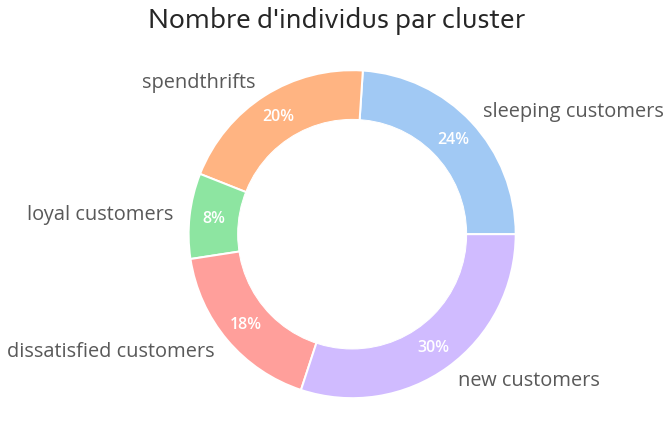

In [50]:
toolbox.plot_donut(X_boxplot_kmeans_5, 'cluster', 'Nombre d\'individus par cluster',
                   (10, 6), colors={'outside': sns.color_palette('pastel')}
                   )

Regardons le coefficient de silhouette moyen de chaque cluster :

- Les point mal assignés (avec un coefficient de silhouette négatif) se trouvent de nouveau dans les clusters "dissatified customers" et "sleeping customers" (donc ajouter un nouveau cluster n'a pas suffit) ainsi que dans le cluster "spendthrifts".

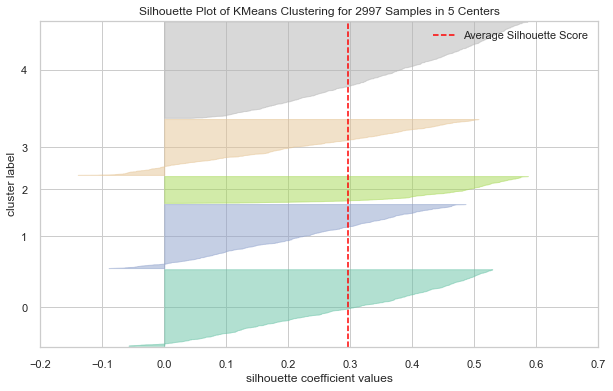

In [51]:
plt.figure(figsize=(10, 6))
silhouette_visualizer(kmeans_5, X_transformed,
                      colors='Set2', is_fitted=True
                      )
plt.show()

<h4 style="font-family:Corbel Light; color:#737373">DBSCAN</h4>

Choix des hyperparamètres

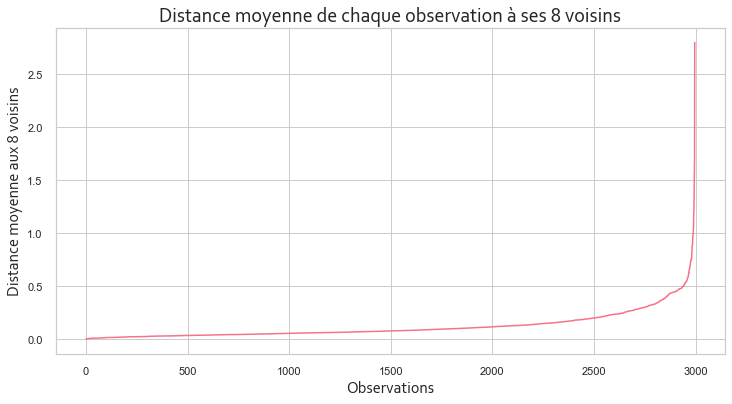

In [52]:
n_min = 8
toolbox.display_neighbors_distance_elbow(X_transformed,
                                         n_min, (12, 6),
                                         palette='husl'
                                         )

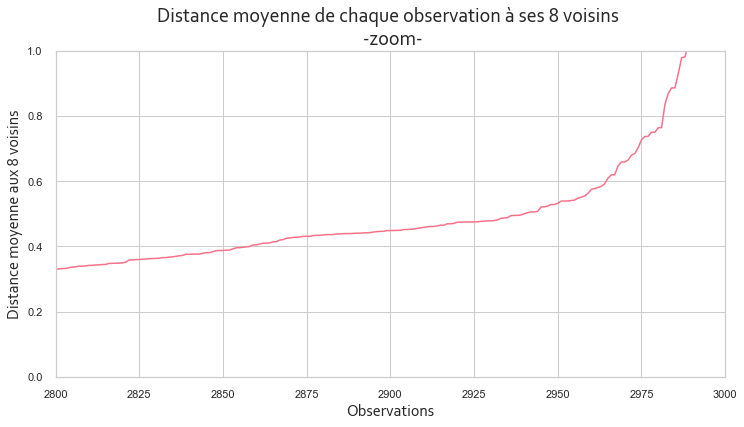

In [53]:
toolbox.display_neighbors_distance_elbow(X_transformed, n_min, (12, 6), True,
                                         [2_800, 3_000], [0, 1],
                                         palette='husl'
                                         )

In [54]:
dbscan = DBSCAN(min_samples=8, eps=0.76)
dbscan.fit(X_transformed)

DBSCAN(eps=0.76, min_samples=8)

In [55]:
print('Pour 8 voisins on obtient {} clusters'.format(
    len(np.unique(dbscan.labels_))))

Pour 8 voisins on obtient 4 clusters


Visualisation des données

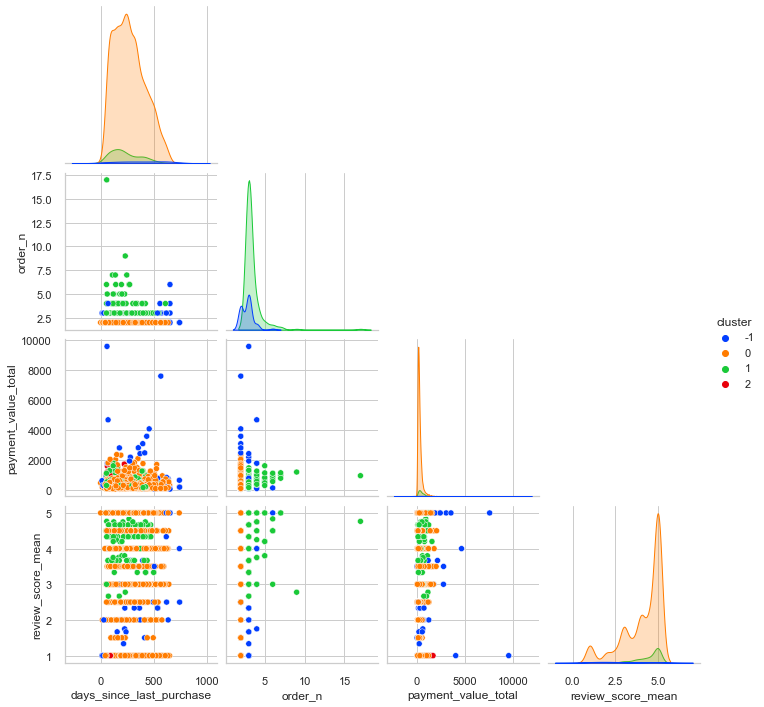

In [56]:
toolbox.pairplot_clusters(X, dbscan.labels_, palette='bright')

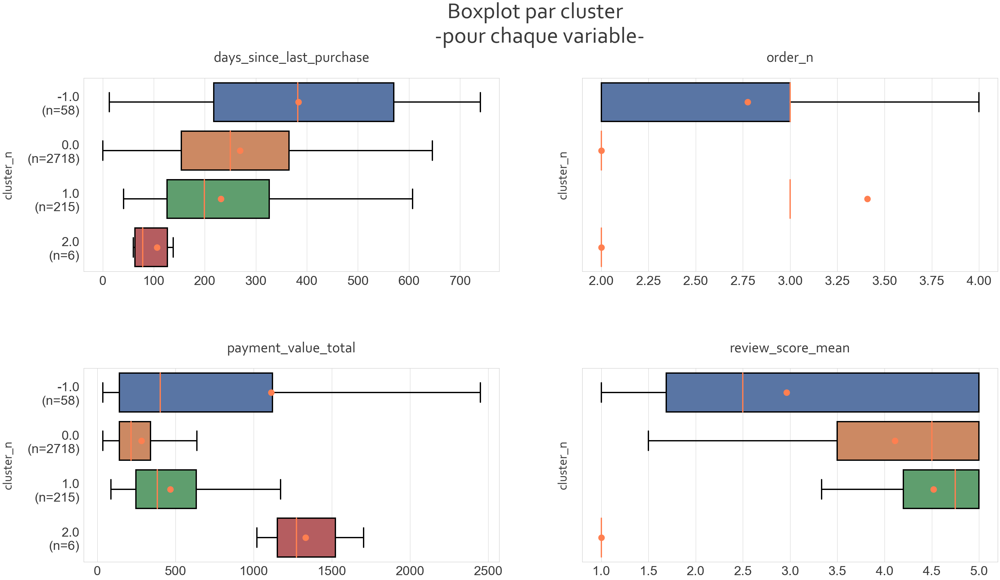

In [57]:
X_boxplot_dbscan = toolbox.reshape_data_for_boxplot(X,
                                                    'cluster',
                                                    dbscan.labels_
                                                    )

toolbox.plot_boxplot_by_dimension(X_boxplot_dbscan, X.columns.values, 2,
                                  'par cluster \n -pour chaque variable-',
                                  (40, 25), 'cluster_n', True,
                                  top=0.85, hspace=0.5
                                  )

On arrive à distinguer : 

- Les clients qui n'ont commandé que 2 fois :
    - cluster orange (0) : ces clients dépensent peu et sont plutôt contents
    - cluster rouge (2) : ces clients ont commandé récemment pour un montant moyen, et sont très mécontents de leur achat 

- Les clients qui ont commandé plus de 2 fois :
    - cluster bleu (-1): ce cluster contient les outliers, i.e. les clients pour lesquels une des variables prend une valeur extrême (ex: clients qui ont beaucoup plus commandé ou dépensé que les autres)
    - cluster vert (1): ces clients dépensent moyennement et sont assez contents

Evaluation : 

Regardons si la partition obtenue est équilibrée.

In [58]:
cluster_name_dbscan = {-1: "outliers",
                       0: "average customers",
                       1: "loyal customers",
                       2: "angry customers"}

X_boxplot_dbscan['cluster'] = X_boxplot_dbscan['cluster'].apply(lambda row:
                                                                cluster_name_dbscan[row]
                                                                )

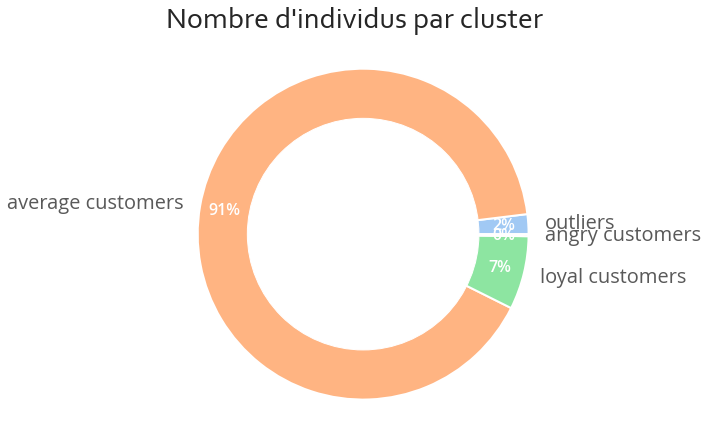

In [59]:
toolbox.plot_donut(X_boxplot_dbscan, 'cluster', 'Nombre d\'individus par cluster',
                   (10, 6), colors={'outside': sns.color_palette('pastel')}
                   )

La partition obtenue est très déséquilibrée, le premier cluster formé capte 91% des individus.

Calculons le coefficient de silhouette moyen de ce clustering : il est plus élevé que celui des autres modèles

In [60]:
silhouette_dbscan = metrics.silhouette_score(X_transformed, dbscan.labels_)
print("Coefficient de silhouette pour 4 clusters: %0.3f" % silhouette_dbscan)

Coefficient de silhouette pour 4 clusters: 0.408


<h4 style="font-family:Corbel Light; color:#737373">Conclusion</h4>

In [67]:
pd.DataFrame(data=[['DBSCAN', 4, silhouette_dbscan,
                    *list(X_boxplot_dbscan['cluster'].value_counts(normalize=True).values), np.nan
                    ],
                   ['KMeans', 4, silhouette_kmeans_4,
                    *list(X_boxplot_kmeans_4['cluster'].value_counts(normalize=True).values), np.nan
                    ],
                   ['KMeans', 5, silhouette_kmeans_5,
                    *list(X_boxplot_kmeans_5['cluster'].value_counts(normalize=True).values)
                    ],
                   ['CAH', 4, silhouette_cah_4,
                    *list(X_boxplot_cah_4['cluster'].value_counts(normalize=True).values), np.nan
                    ],
                   ['CAH', 5, silhouette_cah_5,
                    *list(X_boxplot_cah_5['cluster'].value_counts(normalize=True).values)
                    ]
                   ],
             columns=['algo', 'clusters_n', 'coefficient de silhouette',
                      'ind_cluster_1', 'ind_cluster_2', 'ind_cluster_3',
                      'ind_cluster_4', 'ind_cluster_5'
                      ]
             )

,algo,clusters_n,coefficient de silhouette,ind_cluster_1,ind_cluster_2,ind_cluster_3,ind_cluster_4,ind_cluster_5
0,DBSCAN,4,0.41,0.91,0.07,0.02,0.00,NaN
1,KMeans,4,0.31,0.41,0.29,0.21,0.08,NaN
2,KMeans,5,0.30,0.30,0.24,0.20,0.18,0.08
3,CAH,4,0.26,0.44,0.25,0.22,0.08,NaN
4,CAH,5,0.24,0.26,0.25,0.22,0.18,0.08


In [68]:
ari_5 = metrics.adjusted_rand_score(kmeans_5.labels_,
                                    cah_5.labels_
                                    )

ari_4 = metrics.adjusted_rand_score(kmeans_4.labels_,
                                    cah_4.labels_
                                    )
print("Indice de Rand Ajusté Kmeans vs CAH pour 5 clusters : ", ari_5)
print("Indice de Rand Ajusté Kmeans vs CAH pour 4 clusters : ", ari_4)

Indice de Rand Ajusté Kmeans vs CAH pour 5 clusters :  0.455742317451074
Indice de Rand Ajusté Kmeans vs CAH pour 4 clusters :  0.6055985275307513


L'algorithme DBSCAN donne une partition très asymétrique. Le premier des 4 clusters capte 91% des données.

Les algorithmes KMeans et Classification Ascendante Hiérarchique (CAH) donnent des partitions mieux équilibrées que DBSCAN.
Si on compare deux à deux les modèles KMeans et CAH à 4 et 5 clusters, on observe que les clusters obtenus sont de taille similaire, mais avec un sens un peu différent.

Ces deux algorithmes semblent être au coude à coude. Pour le même nombre de cluster, l'algorithme du KMeans a un meilleur coefficient de silhouette et les clusters formés semblent un peu plus facile à interpréter. Donc, pour cet échantillon de données, l'algorithme KMeans à 4 clusters semble être le plus adapté.

**fin modification après soutenance**

---

---

<h3 style="font-family:Corbel Light; color:#737373">Clustering Hiérarchique (méthode ascendante)</h3>

Cette méthode est plus adaptée pour les petits jeux de données de par sa complexité algorithmique lourde. On va donc travailler sur un échantillon de nos données qui respecte la partition "3% de clients ayant commandé plusieurs fois". 

In [5]:
n_samples_total = 15_000
mask_one_order = (customer_data['order_n'] == 1)

one_order_sample = resample(customer_data.loc[mask_one_order],
                            random_state=8,
                            n_samples=int(0.97 * n_samples_total))

several_orders_sample = resample(customer_data.loc[~mask_one_order],
                                 random_state=8,
                                 n_samples=int(0.03 * n_samples_total))

X = pd.concat([one_order_sample, several_orders_sample], ignore_index=True)
X.shape

(15000, 5)

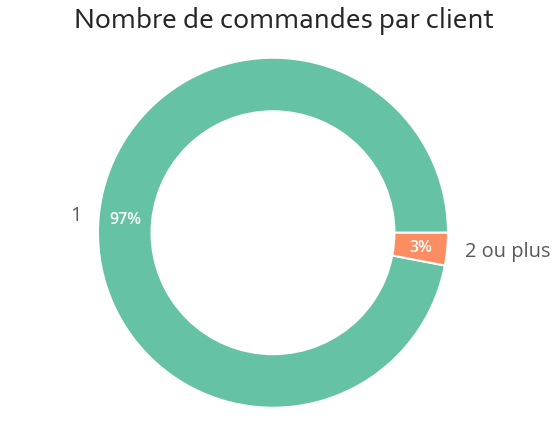

In [6]:
order_n = pd.DataFrame(X['order_n'].apply(lambda row: '2 ou plus' if row > 1
                                          else row))

toolbox.plot_donut(order_n, 'order_n',
                   'Nombre de commandes par client', (8, 6))

<h4 style="font-family:Corbel Light; color:#737373">3 variables : RFM (récence, fréquence, montant)</h4>

 - nombre de jours depuis le dernier achat, 
 - nombre de fois que la personne a acheté, 
 - montant total des achats

In [7]:
X_rfm = X.drop(columns=['review_score_mean', 'products_mean'])
X_rfm_scaled = StandardScaler().fit_transform(X_rfm)
X_rfm_scaled.shape

(15000, 3)

<h5 style="font-family:Corbel Light; color:#737373">Choix du nombre de clusters</h5>

Regardons le dendrogramme pour choisir le nombre de clusters

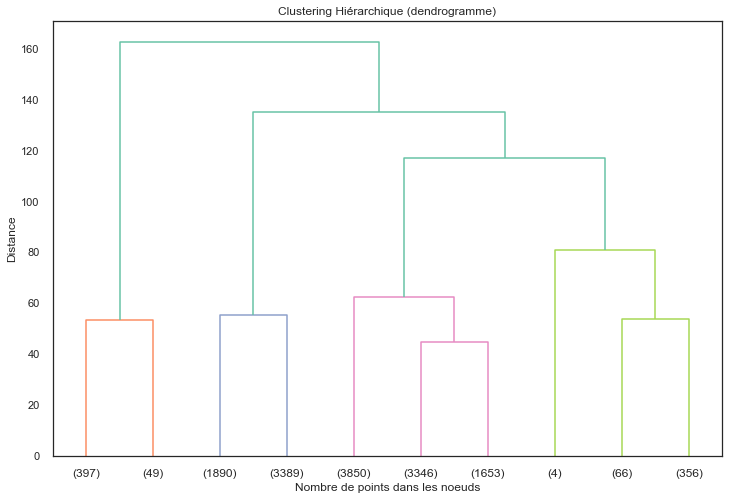

In [8]:
toolbox.display_dendrogram(X_rfm_scaled, 10)

Regardons pour 4 clusters

In [9]:
cah_rfm_4 = AgglomerativeClustering(n_clusters=4, linkage="ward")
cah_rfm_4.fit(X_rfm_scaled)

AgglomerativeClustering(n_clusters=4)

<h5 style="font-family:Corbel Light; color:#737373">Visualisation des données </h5>

Testons plusieurs approches pour visualiser nos données en 2 dimensions et les analyser :  
- features 2 à 2 : pairplot
- réduction dimensionnelle : pca
- analyse des profils clients : boxplot, radarplot

Commençons par projeter nos données sur chaque couple possible de features

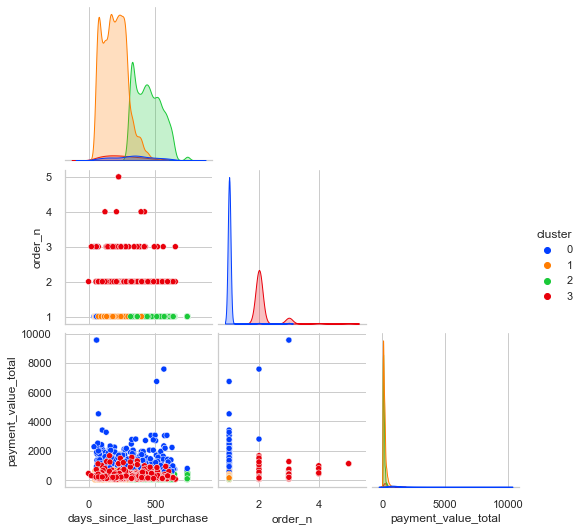

In [10]:
toolbox.pairplot_clusters(X_rfm, cah_rfm_4.labels_, palette='bright')

Avec 4 clusters : 

On a les "petits" clients (ayant commandé une seule fois plutôt pour un petit montant) regroupés en fonction du nombre de jours depuis la dernière commande passée :
- cluster orange (1) : clients ayant commandé une seule fois plutôt récemment ("new customers")
- cluster vert (2) : clients ayant commandé une seule fois il y a plutôt longtemps ("one time shoppers")


On a les plus "gros" clients (ayant commandé plusieurs fois et/ou pour un montant plus important) :
- cluster bleu (0) : clients qui dépensent beaucoup ("spendthrifts")
- cluster rouge (3) : clients ayant commandé plusieurs fois ("loyal customers")

ACP : 

Nous n'avons que 3 variables, donc appliquer une ACP ne semble pas très utile mais, par curiosité, regardons quand même si nos 4 clusters sont visibles plus distinctement après projection sur différents plans factoriels.

Rappel : Dans le notebook "Analyse", nous avons vu que : 
- F1 : positivement corrélé avec le nombre de commandes et le montant total commandé -> gros clients vs petits clients
- F2 : positivement corrélé avec le nombre de jours depuis la dernière commande -> anciens clients vs clients récents
- F3: positivement corrélé avec le nombre de commandes et anti-corrélé avec le montant total des commandes -> clients qui commandent beaucoup mais pour petit montant vs clients qui ont fait une grosse commande

Pourcentage de variance expliquée par la première composante : 38.59%
Pourcentage de variance expliquée par les 2 premières composantes ensembles : 71.89%
Pourcentage de variance expliquée par les 3 premières composantes ensembles : 100.00%


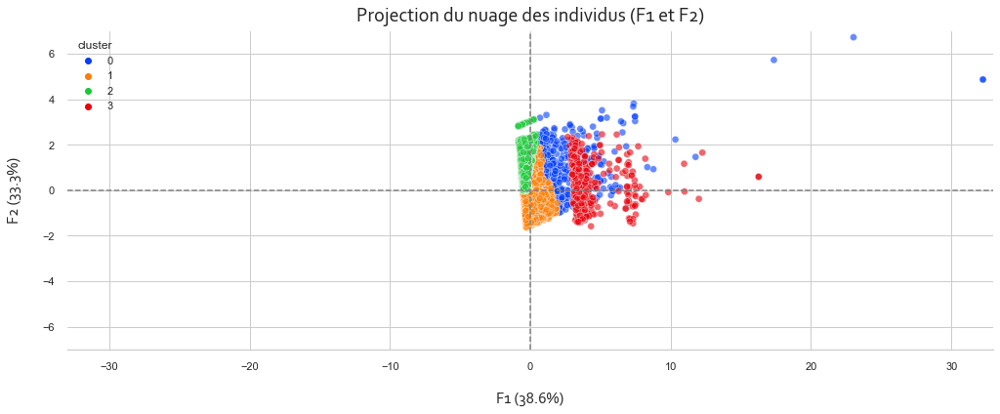

In [11]:
pca_rfm, X_rfm_proj = toolbox.fit_transform_pca(X_rfm_scaled, 3, False, True)

X_proj_df = toolbox.display_pca_scatterplot(pca_rfm, 0, 1,
                                            X_rfm_proj,
                                            3, (17, 6), True,
                                            cah_rfm_4.labels_,
                                            hue_palette='bright'
                                            )

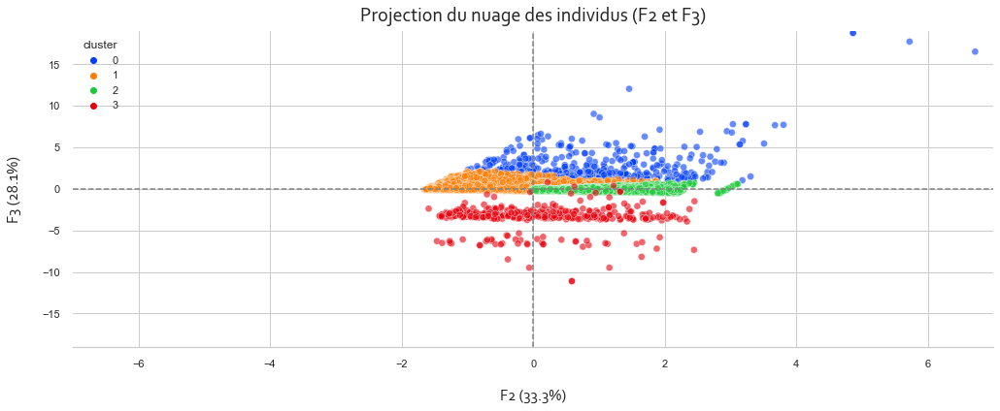

In [12]:
X_proj_df = toolbox.display_pca_scatterplot(pca_rfm, 1, 2,
                                            X_rfm_proj,
                                            3, (17, 6), True,
                                            cah_rfm_4.labels_,
                                            hue_palette='bright'
                                            )

- F1 semble bien séparer les "petits" et "gros" clients :
    - clusters vert et orange : "petits" clients, ayant commandé une seule fois pour un petit montant
    - clusters bleu et rouge : "gros" clients ayant commandé plusieurs fois et/ou pour un montant plus élevé.


- F2 semble séparer les clients ayant passé une commande plus récemment des clients les plus anciens
     - cluster vert semble ne contenir que des clients plutôt anciens


- F3 est anti-corrélé avec le montant des commandes et positivement corrélé avec le nombre de commandes et permet de séparer les "gros" clients en :
    - cluster rouge : clients ayant dépensé beaucoup (idée : plus qu'ils n'ont commandé)
    - cluster bleu : clients ayant commandé beaucoup (idée : plus qu'ils n'ont dépensé)

BoxPlot

Ces boxplots confirment nos observations précédentes, à savoir que :
- Les clusters orange et vert regroupent des clients ayant commandé une seule fois. Les clients orange semblent avoir commandé plus récemment que les verts.

- Le cluster rouge regroupe les clients ayant passé plusieurs commandes (pas forcément pour un montant élevé)
- Le cluster bleu regroupe les clients ayant le plus dépensé

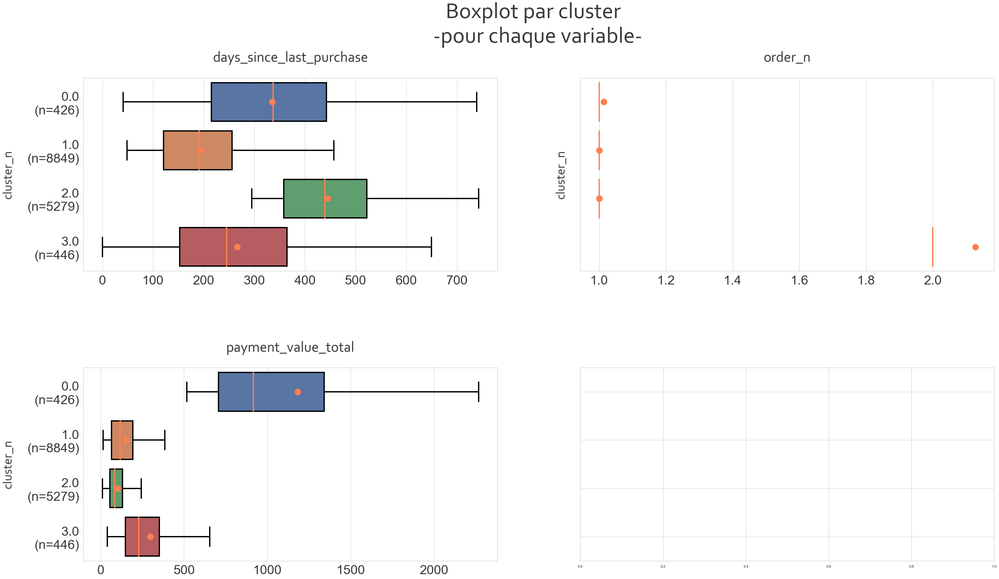

In [13]:
X_rfm_boxplot = toolbox.reshape_data_for_boxplot(X_rfm,
                                                 'cluster',
                                                 cah_rfm_4.labels_
                                                 )

toolbox.plot_boxplot_by_dimension(X_rfm_boxplot, X_rfm.columns.values, 2,
                                  'par cluster \n -pour chaque variable-',
                                  (40, 25), 'cluster_n', True,
                                  top=0.85, hspace=0.5
                                  )

RadarPlot

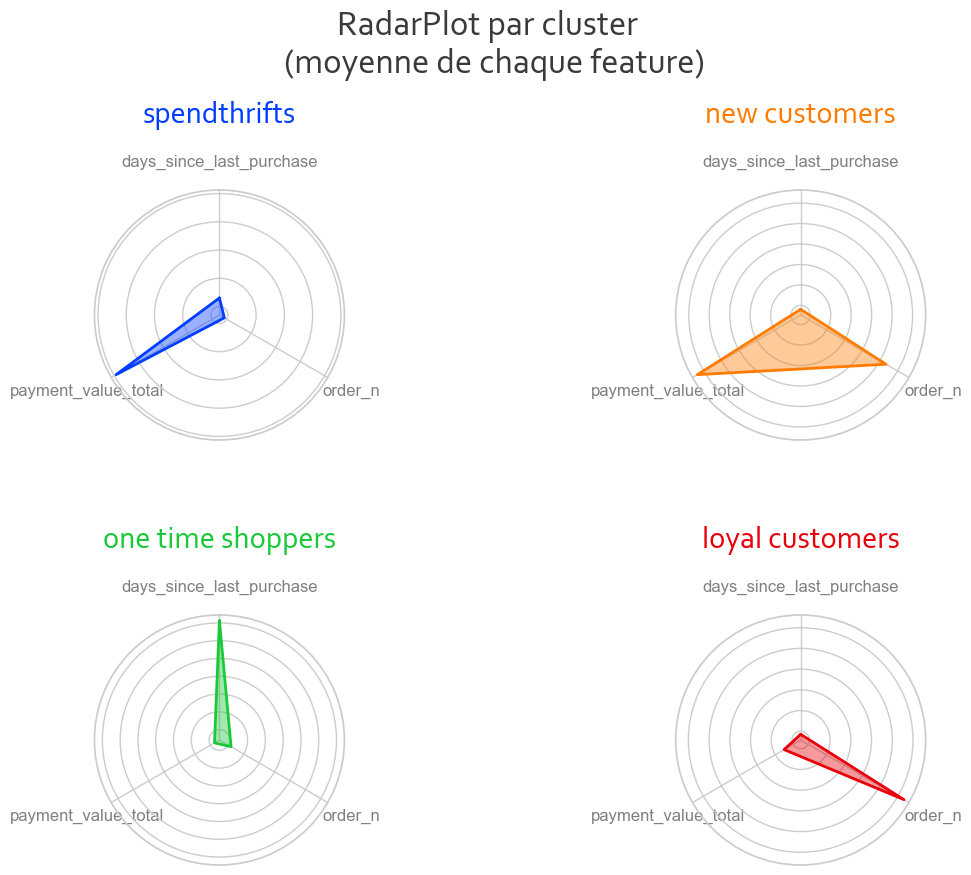

In [14]:
cluster_name = {0: "spendthrifts",
                1: "new customers",
                2: "one time shoppers",
                3: "loyal customers"}

X_rfm_radar = toolbox.reshape_for_radar(X_rfm_scaled,
                                        X_rfm.columns.values,
                                        'cluster',
                                        cah_rfm_4.labels_,
                                        cluster_name
                                        )

toolbox.display_spider_chart(X_rfm_radar, 'cluster', 2, (15, 10),
                             'par cluster \n (moyenne de chaque feature)',
                             palette='bright', top=0.8, hspace=0.7, wspace=0
                             )

<h5 style="font-family:Corbel Light; color:#737373">Evaluation</h5>

Regardons si nos clusters sont plutôt équilibrés, i.e. que 80% des observations ne sont pas regroupées dans un même cluster.

In [15]:
X_rfm_boxplot['cluster'] = X_rfm_boxplot['cluster'].apply(lambda row:
                                                          cluster_name[row]
                                                          )

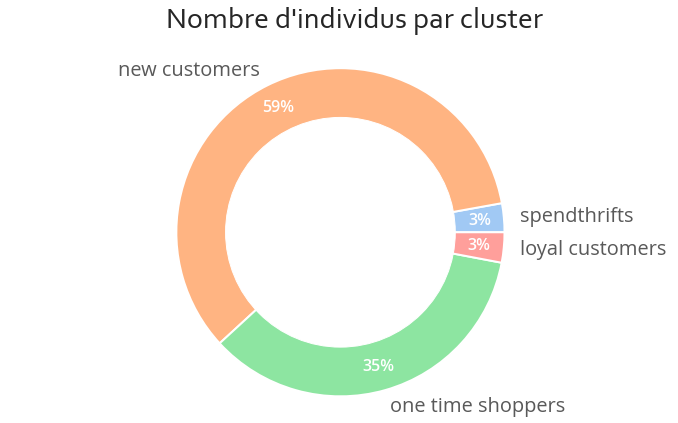

In [16]:
toolbox.plot_donut(X_rfm_boxplot, 'cluster', 'Nombre d\'individus par cluster',
                   (10, 6), colors={'outside': sns.color_palette('pastel')}
                   )

Calculons le coefficient de silhouette moyen pour ce clustering.

Rappel: Le coefficient de silhouette mesure à quel point chaque observation appartient au "bon" cluster selon les critères d'homogénéité et de séparation. Plus il est proche de 1, meilleur est le clustering.

In [17]:
print("Coefficient de silhouette pour 4 clusters: %0.3f" %
      metrics.silhouette_score(X_rfm_scaled, cah_rfm_4.labels_)
      )

Coefficient de silhouette pour 4 clusters: 0.461


<h4 style="font-family:Corbel Light; color:#737373">4 variables : RFM + note moyenne</h4>

- nombre de jours depuis le dernier achat,
- nombre de fois que la personne a acheté,
- montant total des achats,
- note moyenne attribuée par le client à ses commandes

In [18]:
X_rfm_review = X.drop(columns='products_mean')
X_rfm_review_scaled = StandardScaler().fit_transform(X_rfm_review)
X_rfm_review_scaled.shape

(15000, 4)

<h5 style="font-family:Corbel Light; color:#737373">Choix du nombre de clusters</h5>

Regardons le dendrogramme pour choisir le nombre de clusters

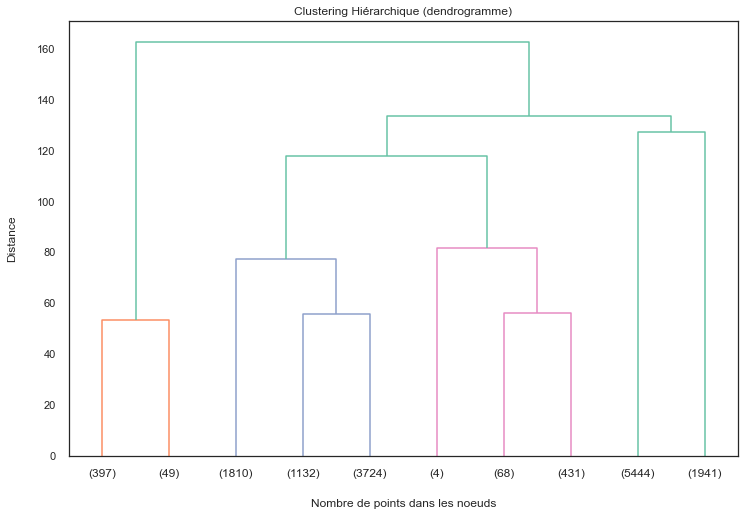

In [19]:
toolbox.display_dendrogram(X_rfm_review_scaled, 10)

Regardons pour 5 clusters

In [20]:
cah_rfmreview_5 = AgglomerativeClustering(n_clusters=5, linkage="ward")
cah_rfmreview_5.fit(X_rfm_review_scaled)

AgglomerativeClustering(n_clusters=5)

<h5 style="font-family:Corbel Light; color:#737373">Visualisation des données </h5>

Testons plusieurs approches pour visualiser nos données en 2 dimensions et les analyser:  
- features 2 à 2 : pairplot
- analyse des profils clients : boxplot, radarplot

Commençons par projeter nos données sur chaque couple possible de features

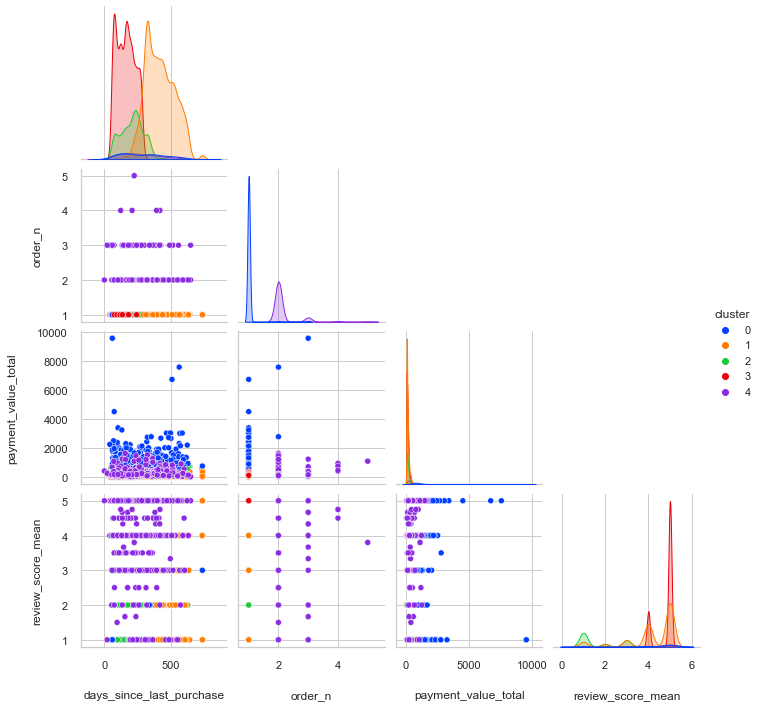

In [21]:
toolbox.pairplot_clusters(X_rfm_review,
                          cah_rfmreview_5.labels_,
                          palette='bright'
                          )

- cluster bleu (0) : clients qui dépensent le plus, une ou plusieurs commandes ("spendthrifts")
- cluster orange (1) : clients ayant commandé une seule fois il y a plutôt longtemps, petit montant ("one time shoppers")
- cluster vert (2) : clients plutôt mécontents ("dissatisfied customers")
- cluster rouge (3) : clients ayant commandé une seule fois plutôt récemment, petit montant ("new customers")
- cluster violet (4) : clients ayant commandé plusieurs fois pas forcément pour un gros montant total ("loyal customers")

BoxPlot : 

Ces boxplot  confirment les observations faites précédemment.
- Les clusters orange, vert et rouge regroupent les clients ayant commandé une seule fois pour un montant total relativemment faible. Les clients verts sont plutôt mécontents (avec une note toujours inférieure ou égale à 3). Les clients rouges et oranges sont plutôt contents. Les rouges ont passé leur dernière commande plus récemment que les oranges.

- Le cluster bleu regroupe les clients ayant passé une ou plusieurs commandes pour un montant total plutôt élevé.
- Le cluster violet regroupe les clients ayant passé le plus de commandes. 

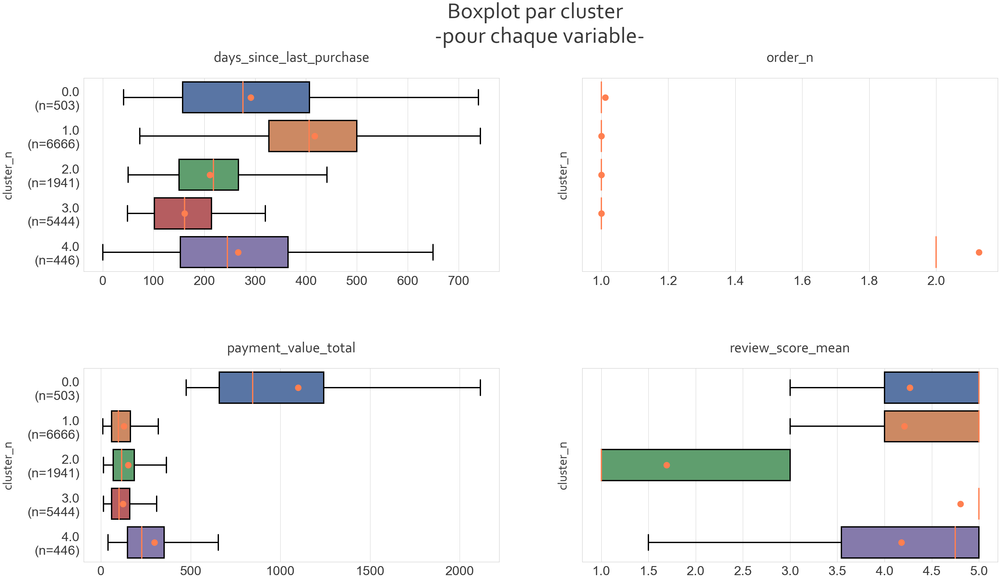

In [22]:
X_rfm_reviews_boxplot = toolbox.reshape_data_for_boxplot(X_rfm_review,
                                                         'cluster',
                                                         cah_rfmreview_5.labels_
                                                         )
toolbox.plot_boxplot_by_dimension(X_rfm_reviews_boxplot,
                                  X_rfm_review.columns.values, 2,
                                  'par cluster \n -pour chaque variable-',
                                  (40, 25), 'cluster_n', True, top=0.85, hspace=0.5
                                  )

Radar Plot

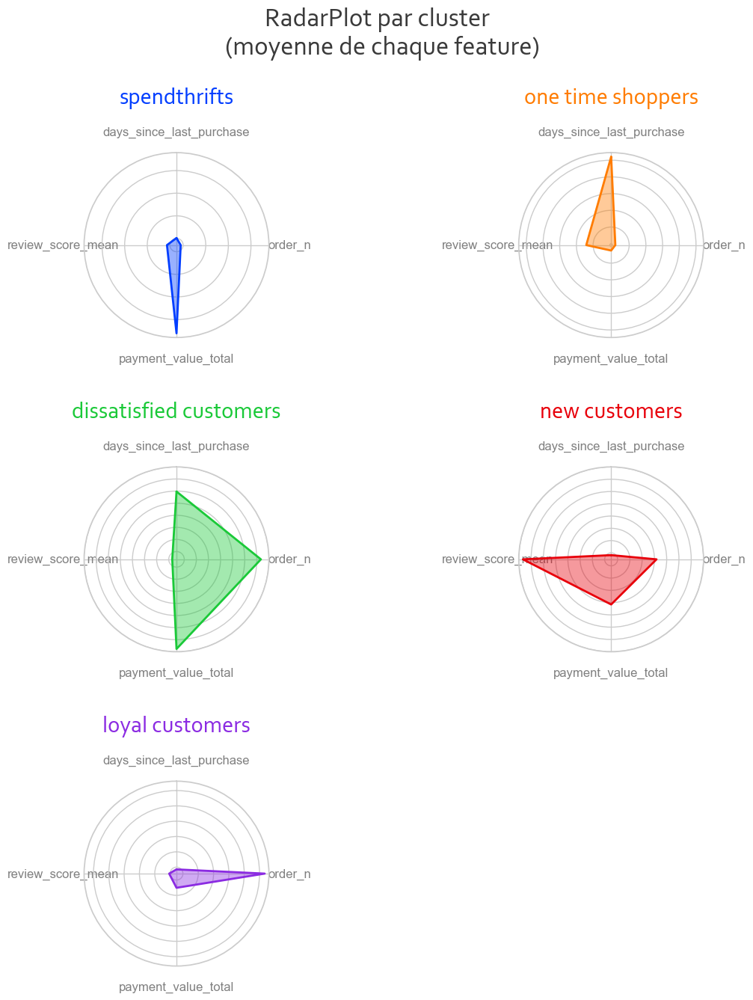

In [23]:
cluster_name = {0: "spendthrifts",
                1: "one time shoppers",
                2: "dissatisfied customers",
                3: "new customers",
                4: "loyal customers"
                }

X_rfm_review_radar = toolbox.reshape_for_radar(X_rfm_review_scaled,
                                               X_rfm_review.columns.values,
                                               'cluster',
                                               cah_rfmreview_5.labels_,
                                               cluster_name
                                               )

toolbox.display_spider_chart(X_rfm_review_radar, 'cluster', 2, (15, 15),
                             'par cluster \n (moyenne de chaque feature)',
                             palette='bright', top=0.85, hspace=0.7, wspace=0
                             )

<h5 style="font-family:Corbel Light; color:#737373">Evaluation</h5>

Regardons si nos clusters sont équilibrés

In [24]:
X_rfm_reviews_boxplot['cluster'] = X_rfm_reviews_boxplot['cluster'].apply(lambda row:
                                                                          cluster_name[row])

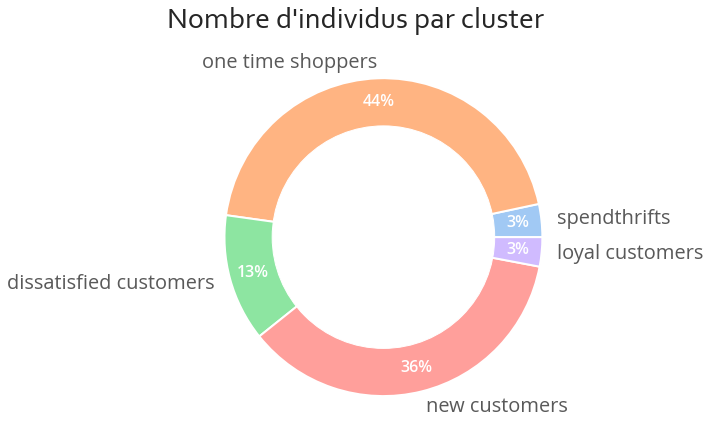

In [25]:
toolbox.plot_donut(X_rfm_reviews_boxplot, 'cluster',
                   'Nombre d\'individus par cluster', (10, 6),
                   colors={'outside': sns.color_palette('pastel')}
                   )

Calculons le coefficient de silhouette moyen pour ce clustering.

Rappel: Le coefficient de silhouette mesure à quel point chaque observation appartient au "bon" cluster selon les critères d'homogénéité et de séparation. Plus il est proche de 1, meilleur est le clustering.

In [26]:
print("Coefficient de silhouette pour 5 clusters: %0.3f" %
      metrics.silhouette_score(X_rfm_review_scaled, cah_rfmreview_5.labels_)
      )

Coefficient de silhouette pour 5 clusters: 0.363


Il est plus faible que celui du modèle RFM (0.461)

<h4 style="font-family:Corbel Light; color:#737373">4 Variables : RFM + nombre moyen de produits</h4>

- nombre de jours depuis le dernier achat,
- nombre de fois que la personne a acheté,
- montant total des achats,
- nombre moyen de produits par commande

In [27]:
X_rfm_products = X.drop(columns='review_score_mean')
X_rfm_products_scaled = StandardScaler().fit_transform(X_rfm_products)
X_rfm_products_scaled.shape

(15000, 4)

<h5 style="font-family:Corbel Light; color:#737373">Choix du nombre de clusters</h5>

Affichons le dendrogramme pour choisir le nombre de clusters

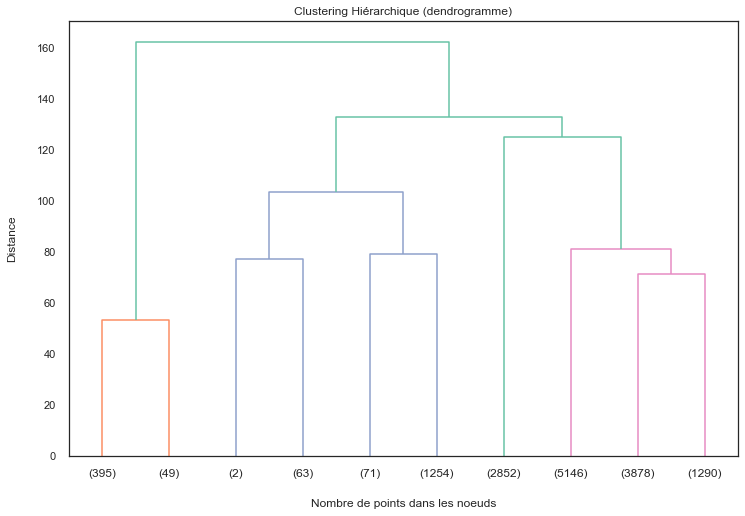

In [28]:
toolbox.display_dendrogram(X_rfm_products_scaled, 10)

Regardons pour 5 clusters

In [29]:
cah_rfm_products_5 = AgglomerativeClustering(n_clusters=5, linkage="ward")
cah_rfm_products_5.fit(X_rfm_products_scaled)

AgglomerativeClustering(n_clusters=5)

<h5 style="font-family:Corbel Light; color:#737373">Visualisation des données </h5>

Testons plusieurs approches pour visualiser nos données en 2 dimensions et les analyser:  
- features 2 à 2 : pairplot
- analyse des profils clients : boxplot, radarplot

Commençons par projeter nos données sur chaque couple possible de features

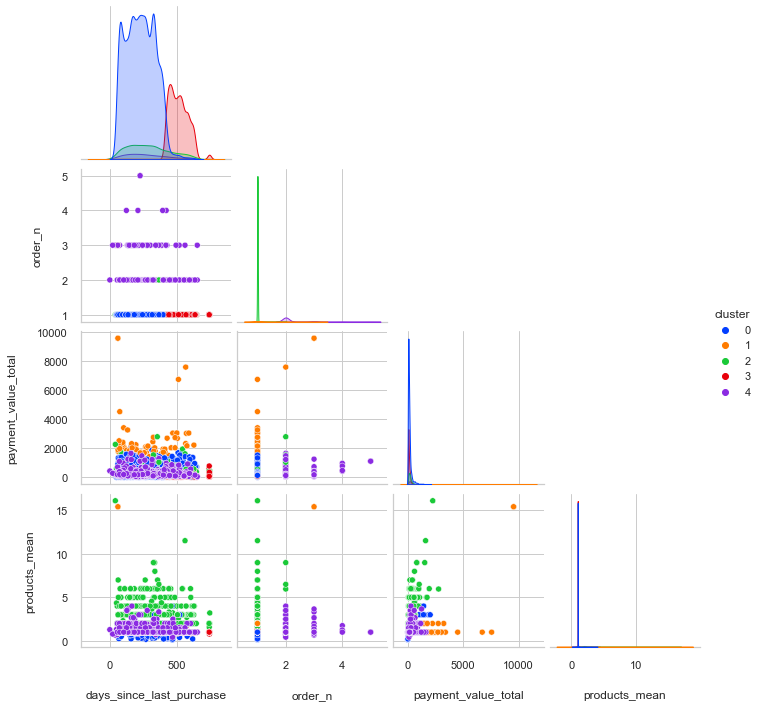

In [30]:
toolbox.pairplot_clusters(X_rfm_products,
                          cah_rfm_products_5.labels_,
                          palette='bright'
                          )

- cluster bleu (0) : clients ayant commandé une seule fois plutôt récemment ("new customers"). Cette catégorie est moins bien délimitée que dans les clusterings précédents, on y trouve plus de clients plus anciens et de clients ayant dépensé beaucoup.
- cluster orange (1) : clients ayant dépensé le plus au total ("spendthrifts") . On remarque aussi que cette catégorie est moins bien délimitée que dans les clusterings précédents, des clients du cluster vert et bleu s'y mêlent.
- cluster vert (2) : clients qui achètent le plus de produits par commande ('big buyers')
- cluster rouge (3) : clients ayant commandé une seule fois il y a plutôt longtemps ('one time shoppers')
- cluster violet (4) : clients ayant passé le plus de commandes ("loyal customers")

BoxPlot

Les boxplot confirment les observations ci-dessus.

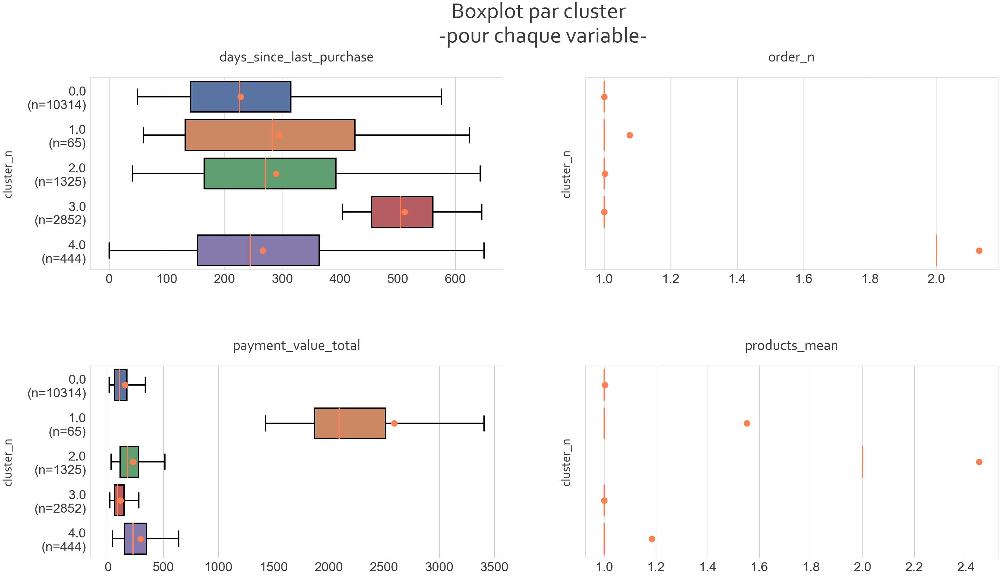

In [31]:
X_rfm_products_boxplot = toolbox.reshape_data_for_boxplot(X_rfm_products,
                                                          'cluster',
                                                          cah_rfm_products_5.labels_
                                                          )

toolbox.plot_boxplot_by_dimension(X_rfm_products_boxplot,
                                  X_rfm_products.columns.values, 2,
                                  'par cluster \n -pour chaque variable-',
                                  (40, 25), 'cluster_n', True, top=0.85, hspace=0.5
                                  )

Radar Plot : 

On remarque que le profil "new customers" est moins bien défini que dans les clusterings précédents. Il est plus difficile à interpréter.

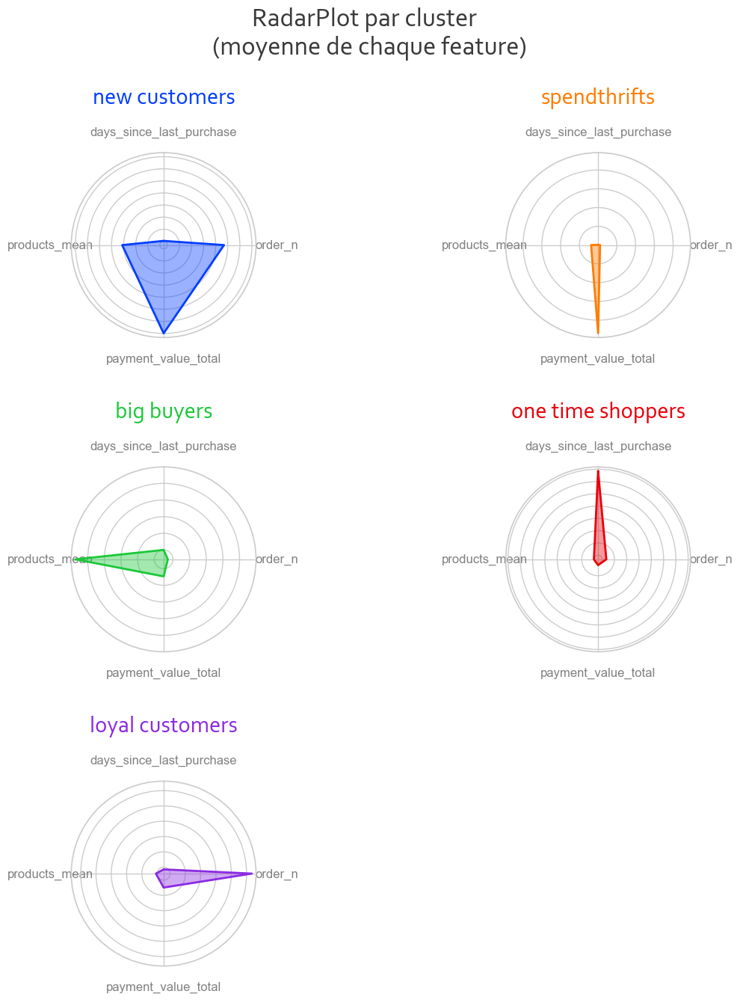

In [32]:
cluster_name = {0: "new customers",
                1: "spendthrifts",
                2: "big buyers",
                3: "one time shoppers",
                4: "loyal customers"
                }

X_rfm_products_radar = toolbox.reshape_for_radar(X_rfm_products_scaled,
                                                 X_rfm_products.columns.values, 'cluster',
                                                 cah_rfm_products_5.labels_, cluster_name
                                                 )

toolbox.display_spider_chart(X_rfm_products_radar, 'cluster', 2, (15, 15),
                             'par cluster \n (moyenne de chaque feature)',
                             palette='bright', top=0.85, hspace=0.7, wspace=0
                             )

<h5 style="font-family:Corbel Light; color:#737373">Evaluation</h5>

Regardons si nos clusters sont équilibrés :

Les clusters sont moins bien équilibrés que dans les modèles précédents. Il semblerait que le cluster "new customers" capte plus d'individus que dans les autres modèles, en particulier des individus classés auparavant comme "spendthrifts". 

In [33]:
X_rfm_products_boxplot['cluster'] = X_rfm_products_boxplot['cluster'].apply(lambda row:
                                                                            cluster_name[row])

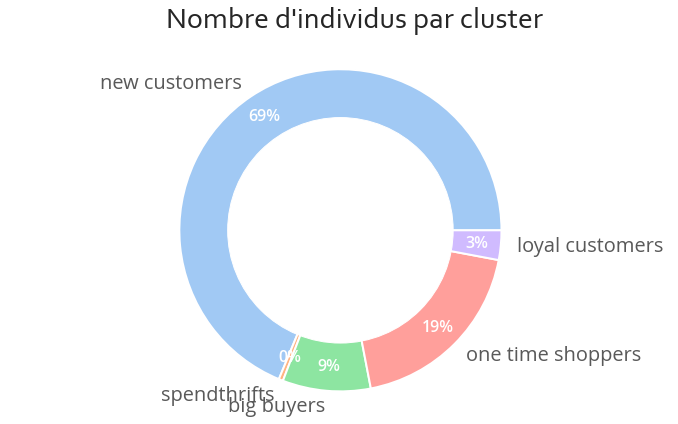

In [34]:
toolbox.plot_donut(X_rfm_products_boxplot, 'cluster',
                   'Nombre d\'individus par cluster', (10, 6),
                   colors={'outside': sns.color_palette('pastel')}
                   )

Calculons le coefficient de silhouette moyen pour ce clustering.

Rappel: Le coefficient de silhouette mesure à quel point chaque observation appartient au "bon" cluster selon les critères d'homogénéité et de séparation. Plus il est proche de 1, meilleur est le clustering.

In [35]:
print("Coefficient de silhouette pour 5 clusters: %0.3f" %
      metrics.silhouette_score(X_rfm_products_scaled,
                               cah_rfm_products_5.labels_)
      )

Coefficient de silhouette pour 5 clusters: 0.429


Il est plus élevé que celui du modèle RFM + note (0.363) mais plus faible que celui du modèle RFM (0.461).

<h4 style="font-family:Corbel Light; color:#737373">5 variables : RFM + nombre moyen de produits + note moyenne</h4>

- nombre de jours depuis le dernier achat,
- nombre de fois que la personne a acheté,
- montant total des achats,
- nombre moyen de produits par commande,
- note moyenne attribuée par le client à ses commandes

In [36]:
X_scaled = StandardScaler().fit_transform(X)
X_scaled.shape

(15000, 5)

<h5 style="font-family:Corbel Light; color:#737373">Choix du nombre de clusters</h5>

Affichons le dendrogramme pour choisir le nombre de clusters

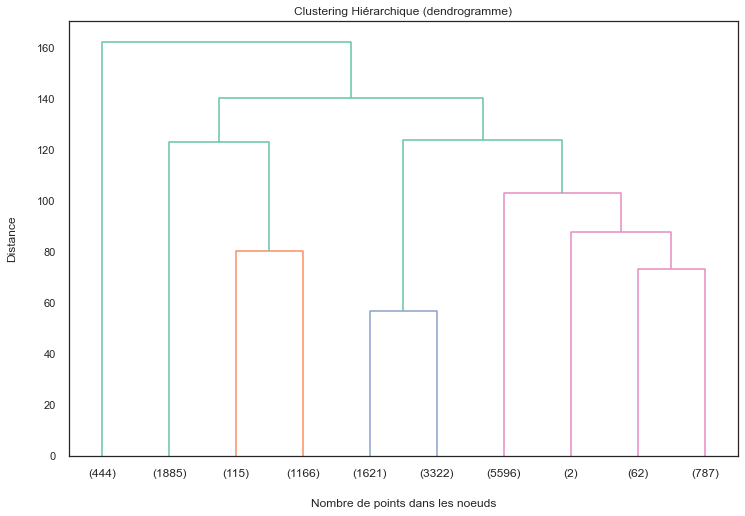

In [37]:
toolbox.display_dendrogram(X_scaled, 10)

Regardons pour 6 clusters

In [38]:
cah_6 = AgglomerativeClustering(n_clusters=6, linkage="ward")
cah_6.fit(X_scaled)

AgglomerativeClustering(n_clusters=6)

<h5 style="font-family:Corbel Light; color:#737373">Visualisation des données </h5>

Testons plusieurs approches pour visualiser nos données en 2 dimensions et les analyser:  
- features 2 à 2 : pairplot
- analyse des profils clients : boxplot, radarplot

Commençons par projeter nos données sur chaque couple possible de features

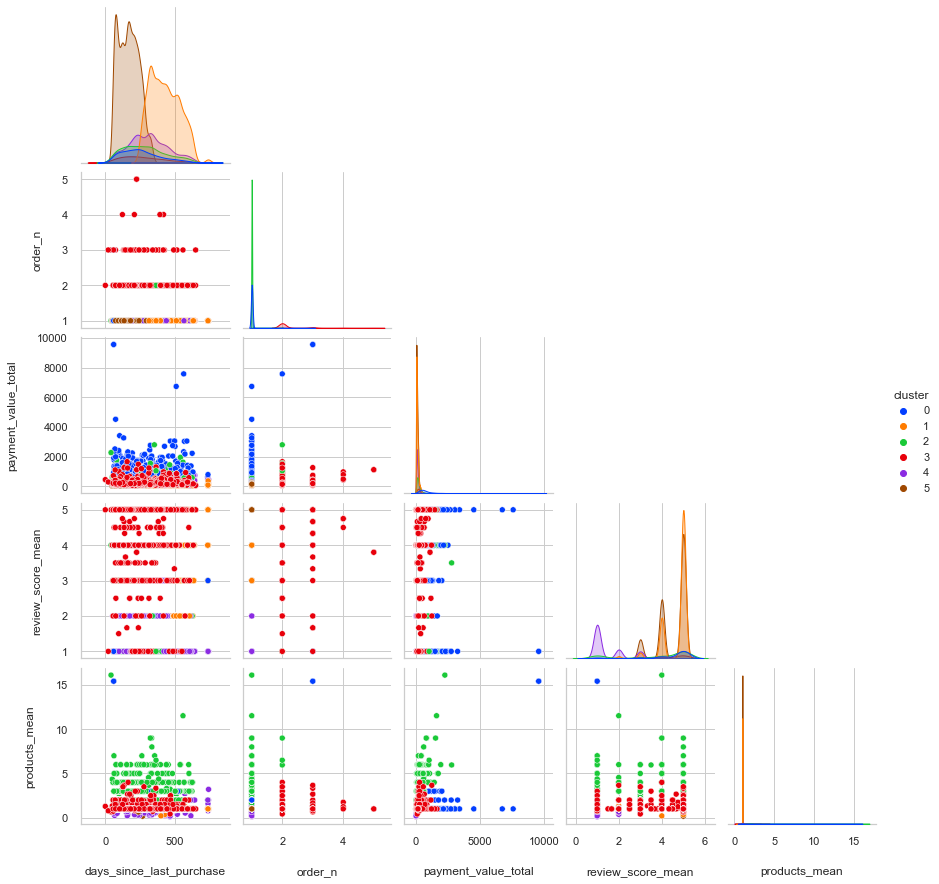

In [39]:
toolbox.pairplot_clusters(X, cah_6.labels_, palette='bright')

- cluster bleu (0) : clients ayant dépensé le plus. ("spendthrifts")
- cluster orange (1) : clients ayant passé une seule commande, il y a plutôt longtemps ("one time shoppers")
- cluster vert (2) : clients qui achètent le plus de produits par commande, ("big buyers")
- cluster rouge (3) : clients qui commandent le plus ('loyal customers')
- cluster violet (4) : clients ayant passé une seule commande, plutôt mécontents ('dissatisfied customers')
- cluster marron (5) : clients ayant passé une seule commande plutôt récemment ("new customers")

BoxPlot

Ces boxplots nous permettent d'affiner nos observations.

- Les clusters orange, vert, violet et marron regroupent des clients qui n'ont passé qu'une seule commande.
    - le cluster orange regroupe les clients ayant passé leur dernière commande il y a plutôt longtemps
    - le cluster marron regroupe les clients ayant passé leur dernière commande plutôt récemment
    - le cluster violet regroupe les clients mécontents
    - le cluster vert regroupe les clients ayant acheté beaucoup de produits
- Le cluster rouge contient les clients ayant commandé plusieurs fois.
- Le cluster bleu regroupe les clients les plus dépensiers

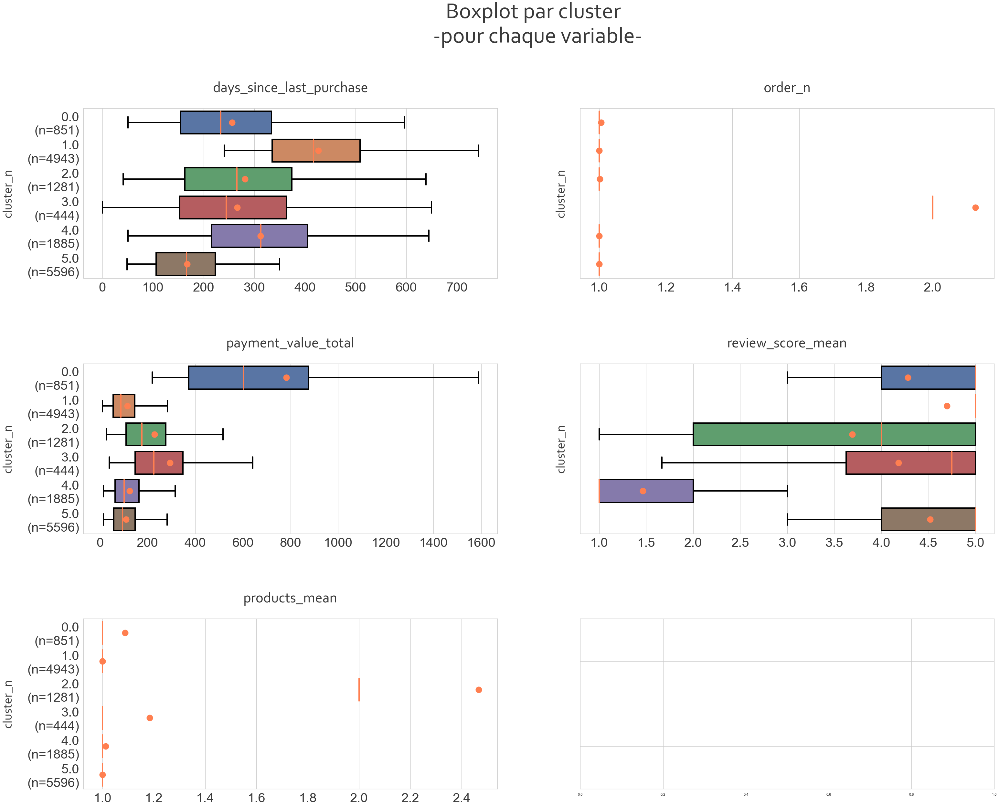

In [40]:
X_boxplot = toolbox.reshape_data_for_boxplot(X, 'cluster', cah_6.labels_)

toolbox.plot_boxplot_by_dimension(X_boxplot, X.columns.values, 2,
                                  'par cluster \n -pour chaque variable-',
                                  (40, 35), 'cluster_n', True, top=0.85, hspace=0.5
                                  )

Radar Plot : 

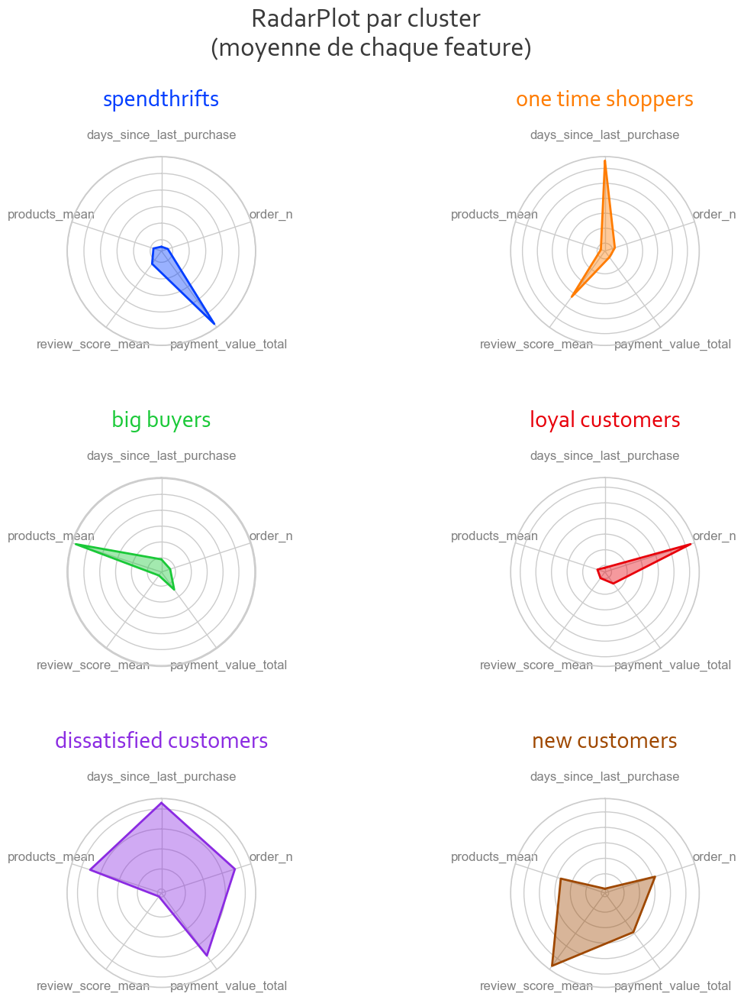

In [41]:
cluster_name = {0: "spendthrifts",
                1: "one time shoppers",
                2: "big buyers",
                3: "loyal customers",
                4: "dissatisfied customers",
                5: "new customers"
                }

X_radar = toolbox.reshape_for_radar(X_scaled,
                                    X.columns.values, 'cluster',
                                    cah_6.labels_, cluster_name
                                    )

toolbox.display_spider_chart(X_radar, 'cluster', 2, (15, 15),
                             'par cluster \n (moyenne de chaque feature)',
                             palette='bright', top=0.85, hspace=0.7, wspace=0
                             )

<h5 style="font-family:Corbel Light; color:#737373">Evaluation</h5>

Regardons si nos clusters sont équilibrés : 

De tous les modèles testés précédemment, celui-ci contient le plus de clusters (6) et est le plus équilibré.

In [42]:
X_boxplot['cluster'] = X_boxplot['cluster'].apply(lambda row:
                                                  cluster_name[row])

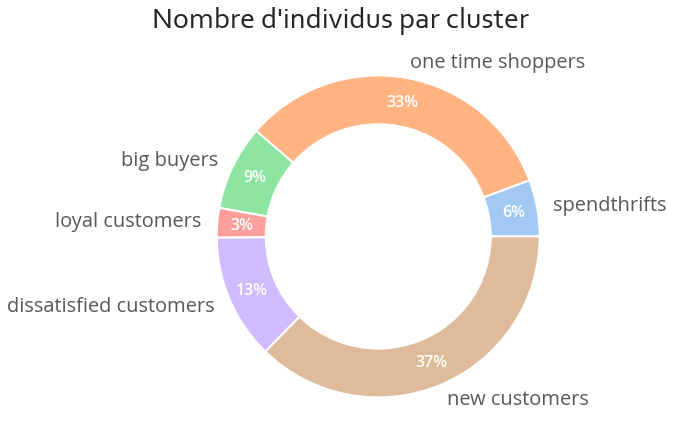

In [43]:
toolbox.plot_donut(X_boxplot, 'cluster', 'Nombre d\'individus par cluster',
                   (10, 6), colors={'outside': sns.color_palette('pastel')}
                   )

Calculons le coefficient de silhouette moyen pour ce clustering.

Rappel: Le coefficient de silhouette mesure à quel point chaque observation appartient au "bon" cluster selon les critères d'homogénéité et de séparation. Plus il est proche de 1, meilleur est le clustering.

In [44]:
print("Coefficient de silhouette pour 6 clusters: %0.3f" %
      metrics.silhouette_score(X_scaled, cah_6.labels_))

Coefficient de silhouette pour 6 clusters: 0.347


Il est plus faible que celui de tous les autres modèles testés.

5 features (0.347) < RFM + note (0.363) < RFM + produits (0.429) < RFM (0.461)

<h4 style="font-family:Corbel Light; color:#737373">Conclusion</h4>

Pour le clustering hiérarchique, le meilleur modèle semble être celui avec 4 variables : rfm + score de satisfaction moyen. Ces variables nous permettent de distinguer les "bons" et moins bons clients ainsi que les clients les moins satisfaits. 

Le modèle avec 5 features a un moins bon coefficient de silhouette moyen. 

Le modèle RFM a le meilleur coefficient de silhouette moyen, mais n'apporte pas suffisamment d'informations sur les différents profils clients. 

Quant au modèle RFM + produits, il définit la partition la moins équilibrée de tous les modèles. Le fait de savoir qu'un client achète beaucoup de produits par commande ne semble pas être une information très utile. On s'intéresse plus aux clients qui viennent régulièrement et dépensent beaucoup. 

Cependant on ne peut retenir le clustering hiérarchique car cette méthode n'est pas applicable à l'ensemble du jeu de données. 
Sa complexité algorithmique est assez élevée et je ne dispose pas de suffisamment d'espace libre sur mon ordinateur. Elle nous a quand même permis d'avoir un premier aperçu des profils de clients que l'on peut trouver dans notre jeu de données. Voyons, si nous retrouvons des profils similaires avec le KMeans. 

<h3 style="font-family:Corbel Light; color:#737373">KMeans</h3>

In [45]:
X = customer_data
X.shape

(96096, 5)

<h4 style="font-family:Corbel Light; color:#737373">3 variables : RFM (récence, fréquence, montant) </h4>

- nombre de jours depuis le dernier achat,
- nombre de fois que la personne a acheté,
- montant total des achats

In [46]:
X_rfm = X.drop(columns=['review_score_mean', 'products_mean'])
X_rfm_scaled = StandardScaler().fit_transform(X_rfm)
X_rfm.shape

(96096, 3)

<h5 style="font-family:Corbel Light; color:#737373">Choix du nombre de clusters</h5>

Affichons le coefficient de silhouette moyen en fonction du nombre de cluster. Selon cette méthode, le nombre "optimal" de clusters maximise le coefficient de silhouette moyen.

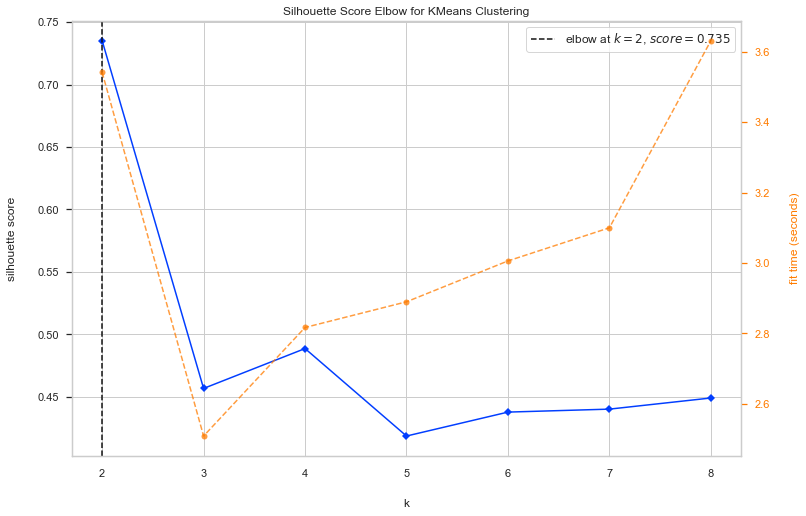

CPU times: total: 23min 8s
Wall time: 18min 11s


In [47]:
%%time
sns.set_theme(style='whitegrid', palette='bright')
plt.figure(figsize=(12, 8))
kelbow_visualizer(KMeans(random_state=8, n_init=10),
                  X_rfm_scaled, k=(2, 9), metric='silhouette'
                  )
plt.show()

Calculer le coefficient de silhouette moyen pour chaque clustering est trop long. Essayons avec la méthode du coude.

Méthode du coude : 

Traçons la courbe de la distortion (somme des distances au carré de chaque point à son centroide) en fonction du nombre de clusters. Le but étant de trouver des clusters homogènes, ces distances doivent être les plus petites possible. Le nombre "optimal" de clusters se trouve au niveau de la dernière cassure forte de la courbe, point à partir duquel augmenter le nombre de clusters ne réduit plus la distortion (i.e. n'augmente plus l'homogénéité des clusters) de manière significative.

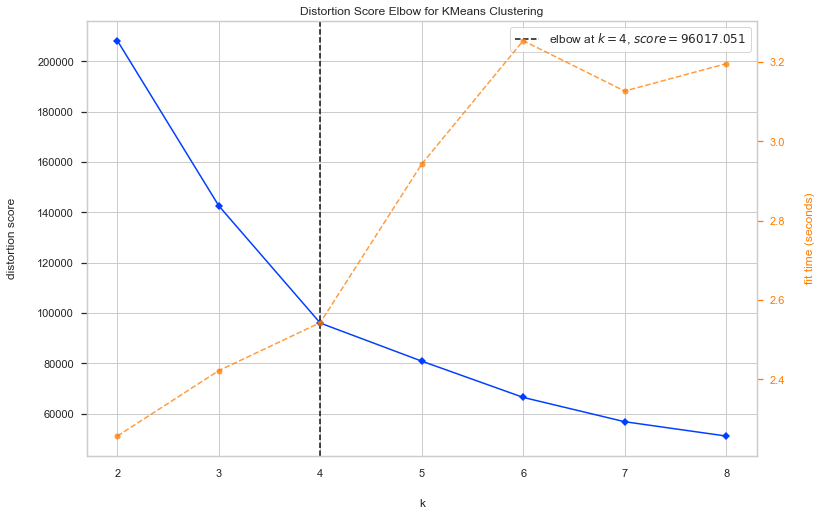

CPU times: total: 57.8 s
Wall time: 20.5 s


In [48]:
%%time
plt.figure(figsize=(12, 8))
kelbow_visualizer(KMeans(random_state=8, n_init=10), X_rfm_scaled, k=(2, 9))
plt.show()

Comparons 2 et 4 clusters

In [49]:
kmeans_rfm_2 = KMeans(n_clusters=2, n_init=10, random_state=8)
kmeans_rfm_2.fit(X_rfm_scaled)

kmeans_rfm_4 = KMeans(n_clusters=4, n_init=10, random_state=8)
kmeans_rfm_4.fit(X_rfm_scaled)

KMeans(n_clusters=4, n_init=10, random_state=8)

<h5 style="font-family:Corbel Light; color:#737373">Visualisation des données</h5>

Testons plusieurs approches pour visualiser nos données en 2 dimensions et les analyser :  
- features 2 à 2 : pairplot
- réduction dimensionnelle : pca
- analyse des profils clients : boxplot, radarplot

Commençons par projeter nos données sur chaque couple possible de features

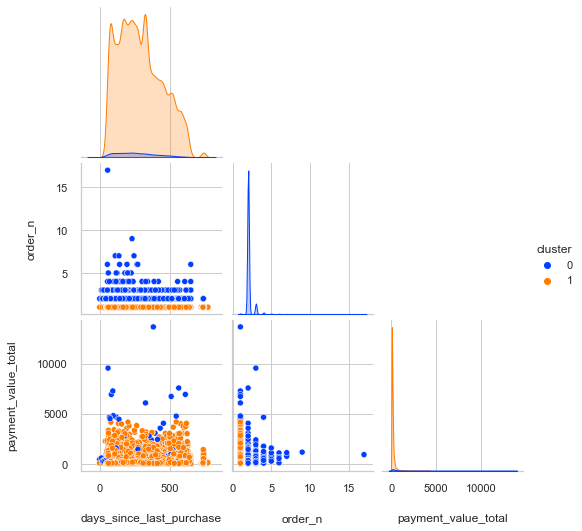

In [50]:
toolbox.pairplot_clusters(X_rfm, kmeans_rfm_2.labels_, palette='bright')

Avec 2 clusters : les clients sont regroupés selon le nombre de commandes.
- Cluster bleu (0) : clients ayant fait plusieurs commandes
- Cluster orange (1) : clients ayant fait une seule commande

Regrouper les clients en 2 clusters n'apporte pas suffisamment d'informations

Regardons pour 4 clusters.

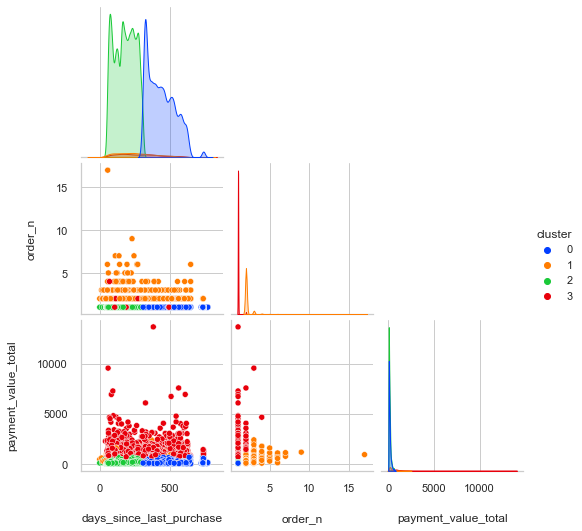

In [51]:
toolbox.pairplot_clusters(X_rfm, kmeans_rfm_4.labels_, palette='bright')

Avec 4 clusters : On retrouve les mêmes profils de clients qu'avec le clustering agglomératif hiérarchique
- cluster bleu (0) : clients ayant fait une seule commande, plus anciens, pour un petit montant ("one time shoppers")
- cluster orange (1) : clients ayant fait plusieurs commandes, pour un petit montant ("loyal customers")
- cluster vert (2) : clients ayant fait une seule commande, plus récents, pour un petit montant ("new customers")
- cluster rouge (3) : clients qui dépensent beaucoup, en une ou plusieurs commandes ("spendthrifts")

ACP : 

Nous n'avons que 3 variables, donc appliquer une ACP ne semble pas très utile mais, par curiosité, regardons quand même si nos 4 clusters sont visibles plus distinctement après projection sur différents plans factoriels.

Rappel : Dans le notebook "Analyse", nous avons vu que : 
- F1 : positivement corrélé avec le nombre de commandes et le montant total commandé -> gros clients vs petits clients
- F2 : positivement corrélé avec le nombre de jours depuis la dernière commande -> anciens clients vs clients récents
- F3: positivement corrélé avec le nombre de commandes et anti-corrélé avec le montant total des commandes -> clients qui commandent beaucoup mais pour petit montant vs clients qui ont fait une grosse commande

Pourcentage de variance expliquée par la première composante : 37.64%
Pourcentage de variance expliquée par les 2 premières composantes ensembles : 70.93%
Pourcentage de variance expliquée par les 3 premières composantes ensembles : 100.00%


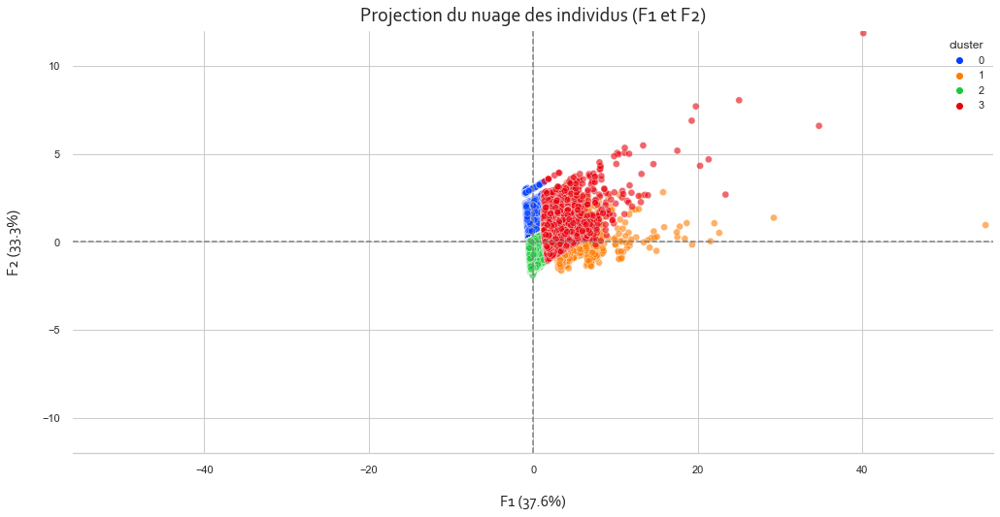

In [52]:
pca_rfm, X_rfm_proj = toolbox.fit_transform_pca(X_rfm_scaled, 3, False, True)

X_proj_df = toolbox.display_pca_scatterplot(pca_rfm, 0, 1, X_rfm_proj, 3, (17, 8), True,
                                            kmeans_rfm_4.labels_, hue_palette='bright')

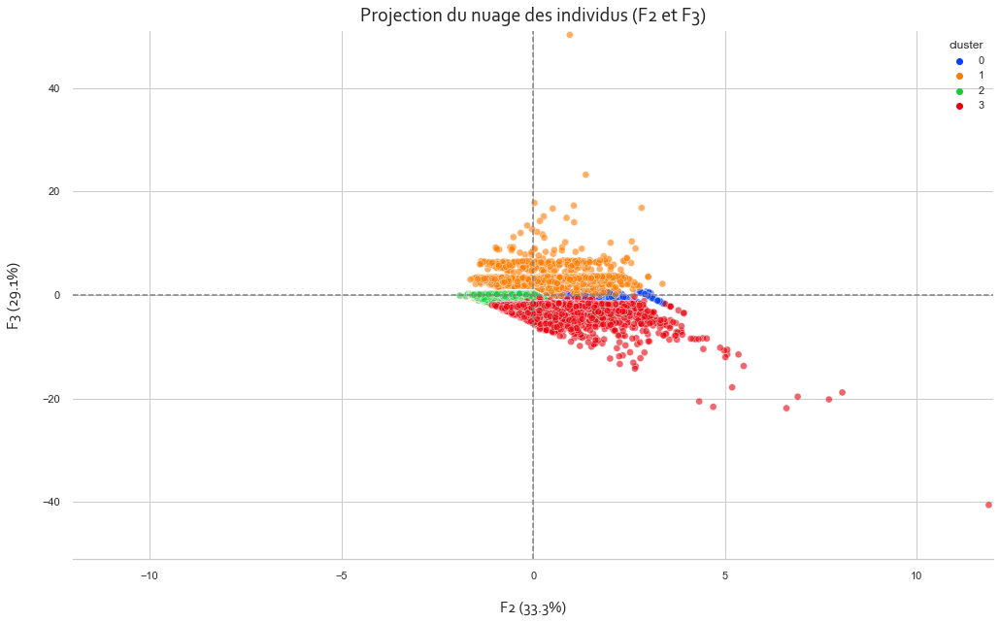

In [53]:
X_proj_df = toolbox.display_pca_scatterplot(pca_rfm, 1, 2, X_rfm_proj, 3, (17, 10), True,
                                            kmeans_rfm_4.labels_, hue_palette='bright')

En projetant nos données sur le plan (F2, F3) on distingue mieux les 4 groupes. On retrouve les mêmes interprétations que précédemment.
- F2 permet de bien séparer le cluster bleu et le cluster vert selon le nombre de jours depuis la dernière commande faite par le client.
    - cluster bleu (0) : le dernier achat fait par le client est plutôt ancien (F2)
    - cluster vert (2) : clients ayant acheté plus récemment (F2)


- F3 permet de bien séparer le cluster orange du cluster rouge selon le montant total dépensé sur le site (-) et le nombre de commandes (+)
    - cluster orange (1) : clients qui ont fait plusieurs commandes mais globalement dépensé peu (idée : dépensent peu, commandent beaucoup)
    - cluster rouge (3) : clients qui ont dépensé beaucoup mais pas forcément fait plusieurs commandes (idée : dépensent beaucoup, commandent peu)
    
    - cluster bleu et vert : clients ayant peu commandé (une seule commande) pour un petit montant (idée: dépensent peu, commandent peu)

BoxPlot : Affichons la distribution de chaque variable selon le cluster. 

Les boxplots confirment les observations faites précédemment, à savoir que : 

- les clusters bleu et vert regroupent des clients qui n'ont commandé qu'une seule fois pour un montant plutôt faible (comparé aux autres clusters). Les clients du cluster vert ont passé leur commande plus récemment que les clients du cluster bleu. 
- le cluster orange regroupe les clients qui commandent le plus souvent.
- le cluster rouge regroupe les clients qui ont le plus dépensé.

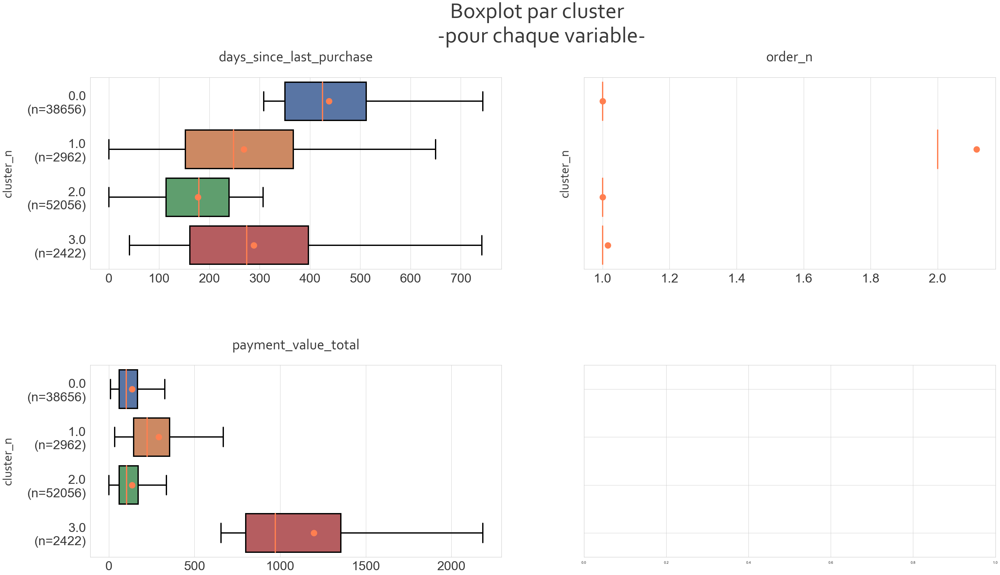

In [54]:
X_rfm_boxplot = toolbox.reshape_data_for_boxplot(X_rfm, 'cluster',
                                                 kmeans_rfm_4.labels_
                                                 )

toolbox.plot_boxplot_by_dimension(X_rfm_boxplot, X_rfm.columns.values, 2,
                                  'par cluster \n -pour chaque variable-',
                                  (40, 25), 'cluster_n', True, top=0.85, hspace=0.5
                                  )

RadarPlot : 

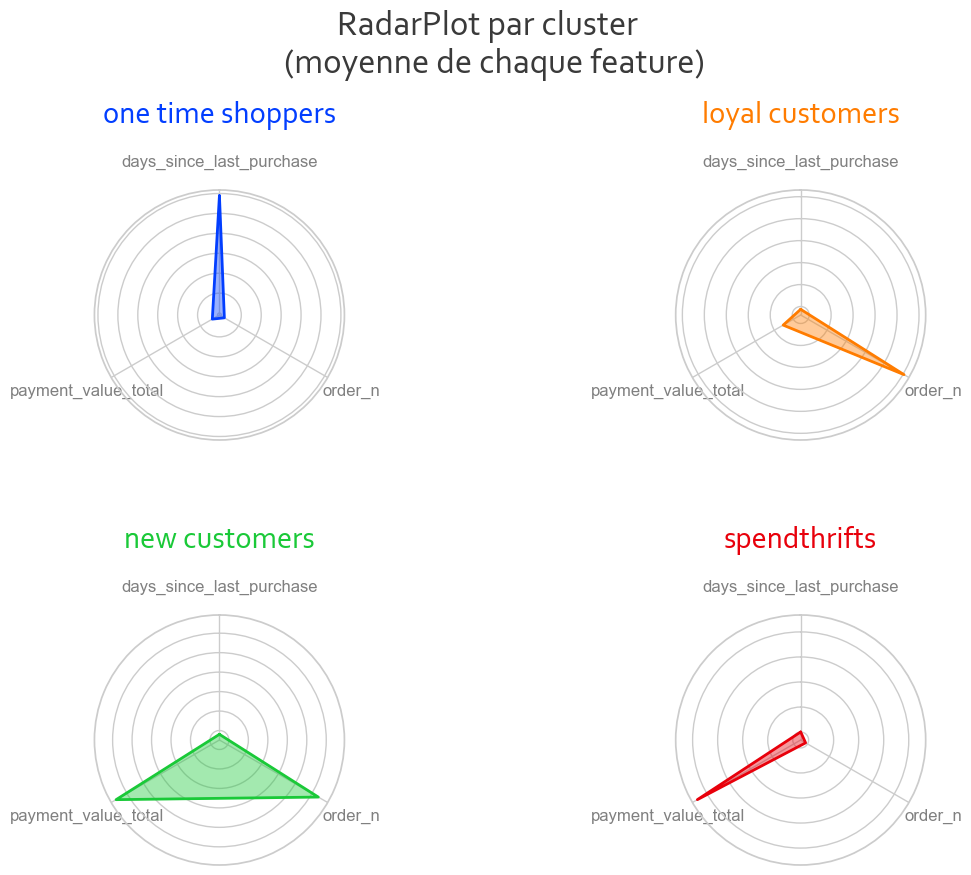

In [55]:
cluster_name = {0: "one time shoppers",
                1: "loyal customers",
                2: "new customers",
                3: "spendthrifts"
                }

X_rfm_radar = toolbox.reshape_for_radar(X_rfm_scaled, X_rfm.columns.values, 'cluster',
                                        kmeans_rfm_4.labels_, cluster_name
                                        )

toolbox.display_spider_chart(X_rfm_radar, 'cluster', 2, (15, 10),
                             'par cluster \n (moyenne de chaque feature)',
                             palette='bright', top=0.8, hspace=0.7, wspace=0
                             )

<h5 style="font-family:Corbel Light; color:#737373">Evaluation</h5>

Regardons si nos clusters sont équilibrés

In [56]:
X_rfm_boxplot['cluster'] = X_rfm_boxplot['cluster'].apply(lambda row:
                                                          cluster_name[row])

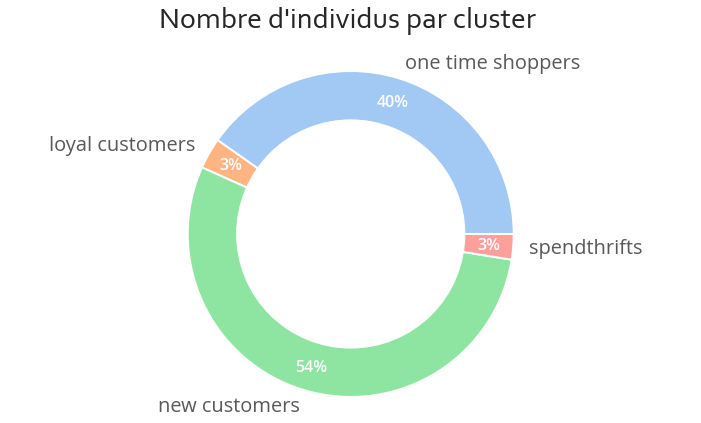

In [57]:
toolbox.plot_donut(X_rfm_boxplot, 'cluster', 'Nombre d\'individus par cluster',
                   (10, 6), colors={'outside': sns.color_palette('pastel')}
                   )

Les clusters "new customers" et "one time shoppers" sont bien plus gros que les clusters "loyal customers" et "spendthrifts". On conserve quand même ces deux petits clusters car ils correspondent à de "bons" clients (qui reviennent régulièrement et/ou dépensent beaucoup). Il serait probablement interessant pour Olist d'essayer de transformer un maximum de nouveaux clients en clients d'une de ces deux catégories.

Calculons le coefficient de silhouette moyen pour ce clustering.

Rappel: Le coefficient de silhouette mesure à quel point chaque observation appartient au "bon" cluster selon les critères d'homogénéité et de séparation. Plus il est proche de 1, meilleur est le clustering.

In [58]:
%%time
print("Coefficient de silhouette moyen pour 4 clusters: %0.3f" %
      metrics.silhouette_score(X_rfm_scaled, kmeans_rfm_4.labels_))

Coefficient de silhouette moyen pour 4 clusters: 0.489
CPU times: total: 3min 12s
Wall time: 2min 33s


Regardons le coefficient de silhouette moyen de chaque cluster : 

- Peu de points ont un coefficient de silhouette en dessous de 0 (i.e. assignés au mauvais cluster). C'est une bonne chose. 
- Nos clusters ne sont pas bien équilibrés. Mais celà est surtout dû à la composition du jeu de données, seuls 3% des clients ont commandé plusieurs fois. Je pense qu'il est intéressant d'identifier quand même ces clients et donc de garder des clusters plus petits que les autres.

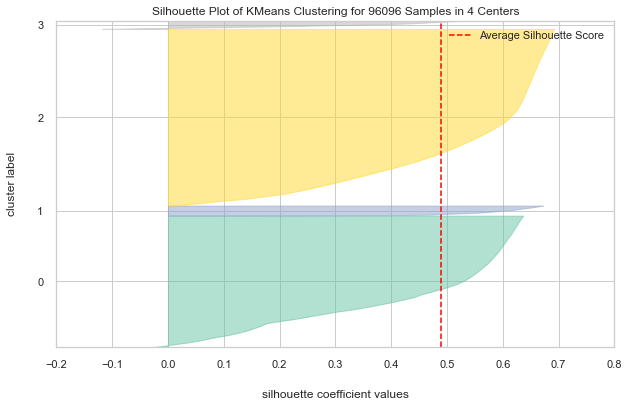

CPU times: total: 6min 34s
Wall time: 5min 12s


In [59]:
%%time
plt.figure(figsize=(10, 6))
silhouette_visualizer(KMeans(4, random_state=8, n_init=10),
                      X_rfm_scaled, colors='Set2')
plt.show()

<h4 style="font-family:Corbel Light; color:#737373">4 variables : RFM + nombre moyen de produits</h4>

- nombre de jours depuis le dernier achat,
- nombre de fois que la personne a acheté,
- montant total des achats,
- nombre moyen de produits par commande

In [60]:
X_rfm_products = X.drop(columns=['review_score_mean'])
X_rfm_products_scaled = StandardScaler().fit_transform(X_rfm_products)
X_rfm_products.shape

(96096, 4)

<h5 style="font-family:Corbel Light; color:#737373">Choix du nombre de clusters</h5>

Calculer le coefficient de silhouette moyen pour chaque clustering est trop long. Nous allons seulement utiliser la méthode du coude.

Traçons la courbe de la distortion (somme des distances au carré de chaque point à son centroide) en fonction du nombre de clusters. Le but étant de trouver des clusters homogènes, ces distances doivent être les plus petites possible. Le nombre "optimal" de clusters se trouve au niveau de la dernière cassure forte de la courbe, point à partir duquel augmenter le nombre de clusters ne réduit plus la distortion (i.e. n'augmente plus l'homogénéité des clusters) de manière significative.

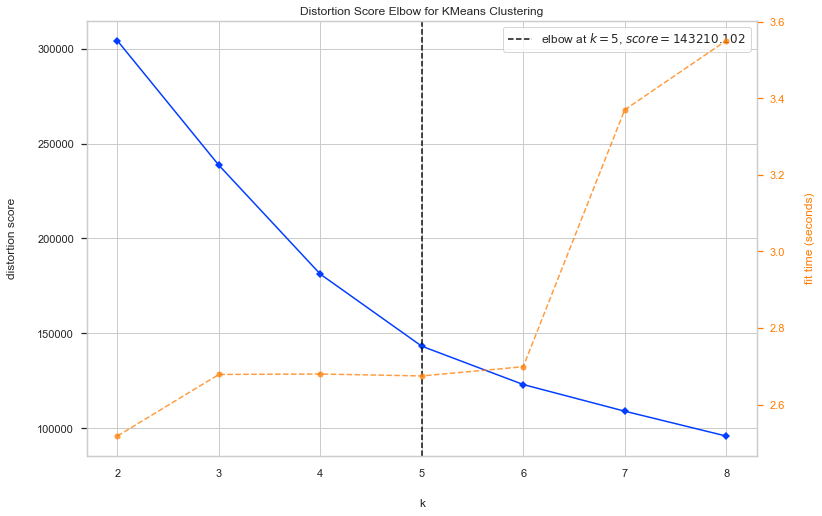

In [61]:
plt.figure(figsize=(12, 8))
kelbow_visualizer(KMeans(random_state=8, n_init=10),
                  X_rfm_products_scaled, k=(2, 9))
plt.show()

Regardons pour 5 clusters

In [62]:
kmeans_rfm_products_5 = KMeans(n_clusters=5, n_init=10, random_state=8)
kmeans_rfm_products_5.fit(X_rfm_products_scaled)

KMeans(n_clusters=5, n_init=10, random_state=8)

<h5 style="font-family:Corbel Light; color:#737373">Visualisation des données</h5>

Testons plusieurs approches pour visualiser nos données en 2 dimensions et les analyser :  
- features 2 à 2 : pairplot
- réduction dimensionnelle : pca
- analyse des profils clients : boxplot, radarplot

Nous avons toujours peu de variables donc on peut commencer par projeter nos données sur chaque couple possible de features

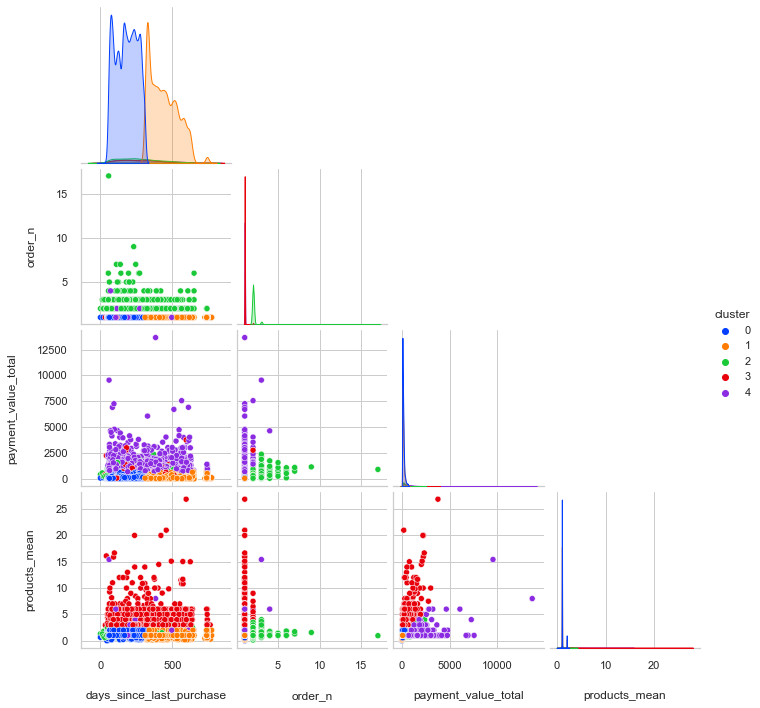

In [63]:
toolbox.pairplot_clusters(X_rfm_products,
                          kmeans_rfm_products_5.labels_,
                          palette='bright'
                          )

- cluster bleu (0) : client ayant fait une seule commande plutôt récente, petit montant, peu de produits ("new customers")
- cluster orange (1) : clients ayant fait une seule commande plutôt ancienne, petit montant, peu de produits ("one time shoppers")
- cluster vert (2) : clients ayant fait plusieurs commandes ("loyal customers")
- cluster rouge (3) : clients ayant acheté beaucoup de produits par commande, peu de commandes, dépense moyenne voire petite ("big buyers")
- cluster violet (4) :  clients ayant dépensé beaucoup, peu de commandes, pas forcément beaucoup de produits par commande ("spendthrifts")

ACP :

Nous n'avons que 4 variables, donc appliquer une ACP ne semble pas très utile mais, par curiosité, regardons quand même si nos 5 clusters sont visibles plus distinctement après projection sur différents plans factoriels.

Dans le Notebook Analyse on a vu que : 

- F1 : positivement corrélé avec le montant total de la commande et le nombre moyen de produit par commande -> gros clients (grosses commandes : a acheté beaucoup de produits et dépensé beaucoup) vs petits clients (petite commandes)

- F2 : anti-corrélé avec le nombre de jours depuis la dernière commande -> clients récents vs anciens clients

- F3 : positivement corrélé avec le nombre de commandes -> clients ayant commandé plusieurs fois vs clients ayant commandé une fois

Pourcentage de variance expliquée par la première composante : 31.86%
Pourcentage de variance expliquée par les 2 premières composantes ensembles : 57.20%
Pourcentage de variance expliquée par les 3 premières composantes ensembles : 81.36%


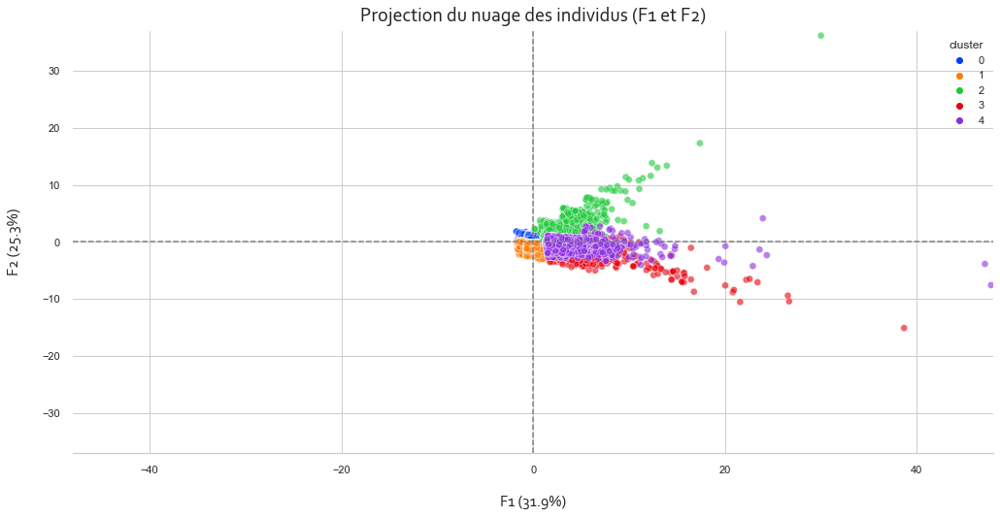

In [64]:
pca_rfm_products, X_rfm_products_proj = toolbox.fit_transform_pca(X_rfm_products_scaled, 3,
                                                                  False, True
                                                                  )

X_proj_df = toolbox.display_pca_scatterplot(pca_rfm_products, 0, 1,
                                            X_rfm_products_proj, 3, (17,
                                                                     8), True,
                                            kmeans_rfm_products_5.labels_, hue_palette='bright'
                                            )

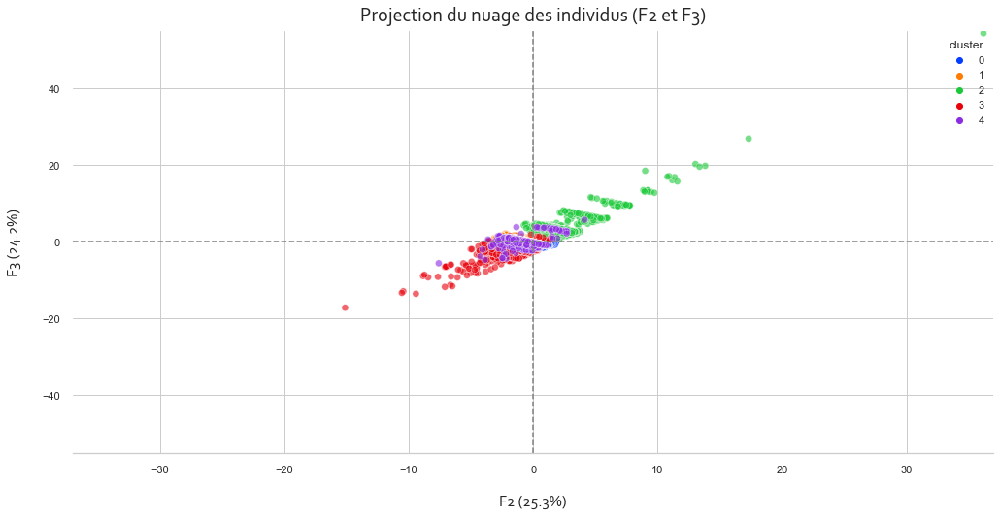

In [65]:
X_proj_df = toolbox.display_pca_scatterplot(pca_rfm_products, 1, 2, X_rfm_products_proj, 3, (17, 8), True,
                                            kmeans_rfm_products_5.labels_, hue_palette='bright')

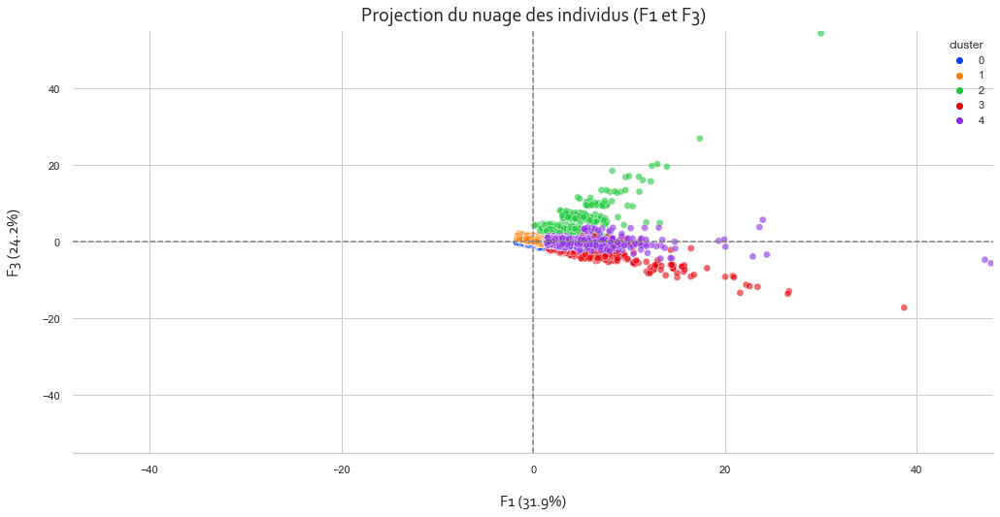

In [66]:
X_proj_df = toolbox.display_pca_scatterplot(pca_rfm_products, 0, 2, X_rfm_products_proj, 3, (17, 8), True,
                                            kmeans_rfm_products_5.labels_, hue_palette='bright')

On voit moins bien les groupes que pour le RFM à 4 clusters. Et il est plus difficile d'interpréter les composantes de l'ACP.
- F2 semble bien séparer les clusters orange et bleu selon le nombre de jours depuis la dernière commande :
    - cluster bleu (0) : clients ayant commandé plutôt récemment
    - cluster orange (1) : dernière commande plutôt ancienne
    - les clients du cluster vert (2) semblent avoir commandé plus récemment que ceux du cluster rouge (3)


- F3 semble bien séparer les clusters vert et violet selon le nombre de commandes (+) et le nombre de produits par commande (-):
    - cluster vert (2) : clients ayant commandé plusieurs fois mais peu de produits (idée: commande +, quantité produits -)
    - cluster rouge (3) : clients ayant commandé peu de fois mais beaucoup de produits (idée: commande -, quantité +)


- F1 semble séparer les clusters selon le montant dépensé :
    - cluster rouge, violet et vert : clients ont plus dépensé 
    - cluster bleu, orange  : clients ont peu dépensé

BoxPlot : 

Les boxplots confirment nos observations précédentes, à savoir que :

- Les clusters bleu et orange regroupent des clients ayant fait une seule commande pour peu de produits et un montant plutôt petit. Ce qui les distingue c'est la date de cette commande : les clients bleus ont commandé plus récemment que les oranges.
- Le cluster vert regroupe les clients ayant fait beaucoup de commandes contenant en moyenne peu de produits et pour un montant moyen.
- Le cluster violet regroupe les clients ayant fait une ou plusieurs commandes pour un montant total élevé.
- Le cluster rouge regroupe les clients qui commandent beaucoup de produits par commande, sans que le montant total ne soit particulièrement élevé.

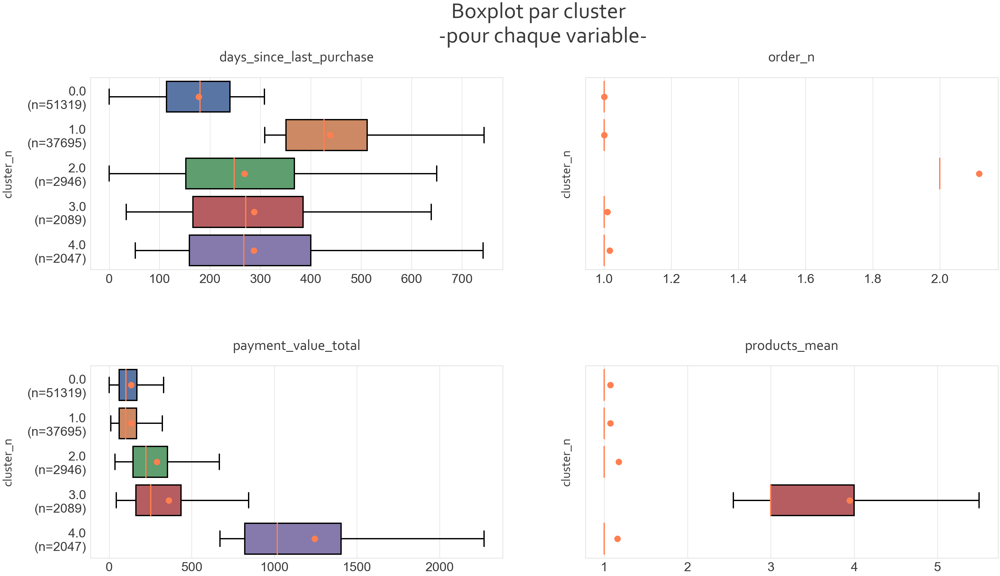

In [67]:
X_rfm_products_boxplot = toolbox.reshape_data_for_boxplot(X_rfm_products, 'cluster',
                                                          kmeans_rfm_products_5.labels_
                                                          )
toolbox.plot_boxplot_by_dimension(X_rfm_products_boxplot, X_rfm_products.columns.values, 2,
                                  'par cluster \n -pour chaque variable-', (40, 25),
                                  'cluster_n', True, top=0.85, hspace=0.5
                                  )

Radar Plot :

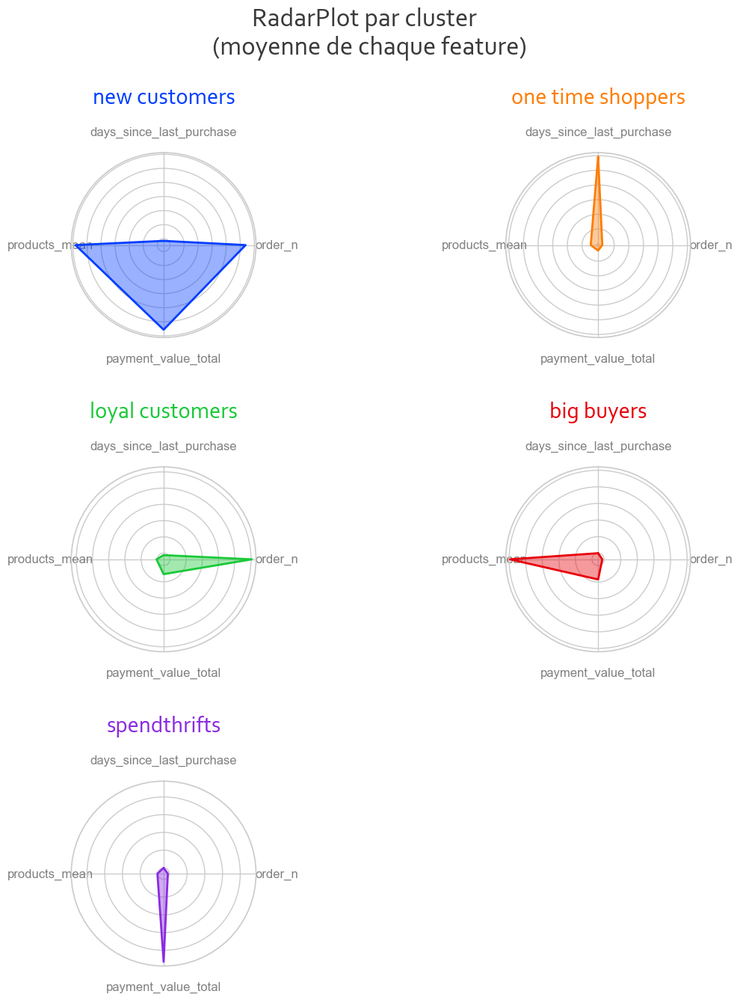

In [68]:
cluster_name = {0: "new customers",
                1: "one time shoppers",
                2: "loyal customers",
                3: "big buyers",
                4: "spendthrifts"
                }

X_rfm_products_radar = toolbox.reshape_for_radar(X_rfm_products_scaled,
                                                 X_rfm_products.columns.values, 'cluster',
                                                 kmeans_rfm_products_5.labels_, cluster_name
                                                 )

toolbox.display_spider_chart(X_rfm_products_radar, 'cluster', 2, (15, 15),
                             'par cluster \n (moyenne de chaque feature)',
                             palette='bright', top=0.85, hspace=0.7, wspace=0
                             )

<h5 style="font-family:Corbel Light; color:#737373">Evaluation</h5>

Regardons si nos clusters sont équilibrés. 

Ajouter la variable nombre de produits moyen par commande aux variables RFM, entraine la création d'un 5ème mini cluster. Cette variable seule ne semble pas apporter suffisamment d'informations sur les clients.

In [69]:
X_rfm_products_boxplot['cluster'] = X_rfm_products_boxplot['cluster'].apply(lambda row:
                                                                            cluster_name[row])

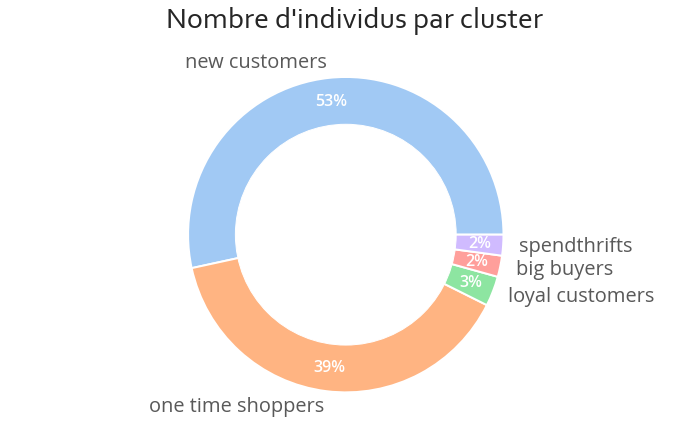

In [70]:
toolbox.plot_donut(X_rfm_products_boxplot, 'cluster', 'Nombre d\'individus par cluster',
                   (10, 6), colors={'outside': sns.color_palette('pastel')}
                   )

Calculons le coefficient de silhouette moyen pour ce clustering.

Rappel: Le coefficient de silhouette mesure à quel point chaque observation appartient au "bon" cluster selon les critères d'homogénéité et de séparation. Plus il est proche de 1, meilleur est le clustering.

In [71]:
%%time
print("Coefficient de silhouette moyen pour 5 clusters: %0.3f" %
      metrics.silhouette_score(X_rfm_products_scaled, kmeans_rfm_products_5.labels_))

Coefficient de silhouette moyen pour 5 clusters: 0.442
CPU times: total: 3min 7s
Wall time: 2min 32s


Il est moins élevé que le coefficient de silhouette moyen du modèle avec RFM (0.489)

Regardons le coefficient de silhouette moyen de chaque cluster : 

- Peu de points ont un coefficient de silhouette en dessous de 0 (i.e. assignés au mauvais cluster). C'est une bonne chose. 
- Nos clusters ne sont pas bien équilibrés.

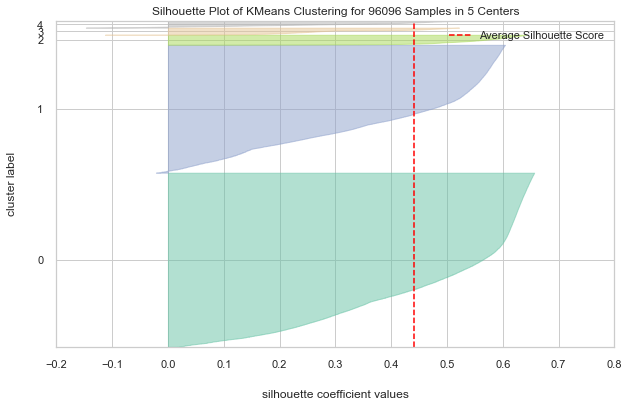

CPU times: total: 6min 31s
Wall time: 5min 15s


In [72]:
%%time
plt.figure(figsize=(10, 6))
silhouette_visualizer(KMeans(5, random_state=8, n_init=10),
                      X_rfm_products_scaled, colors='Set2')
plt.show()

<h4 style="font-family:Corbel Light; color:#737373">4 variables : RFM + note moyenne</h4>

- nombre de jours depuis le dernier achat,
- nombre de fois que la personne a acheté,
- montant total des achats,
- note moyenne attribuée par le client à ses commandes

In [73]:
X_rfm_reviews = X.drop(columns=['products_mean'])
X_rfm_reviews_scaled = StandardScaler().fit_transform(X_rfm_reviews)
X_rfm_reviews.shape

(96096, 4)

<h5 style="font-family:Corbel Light; color:#737373">Choix du nombre de clusters</h5>

Utilisons la méthode du coude.

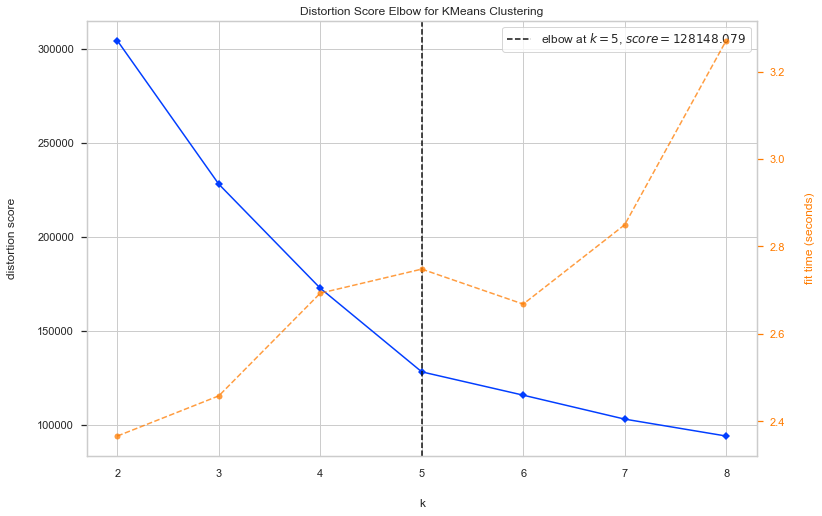

In [74]:
plt.figure(figsize=(12, 8))
kelbow_visualizer(KMeans(random_state=8, n_init=10),
                  X_rfm_reviews_scaled, k=(2, 9))
plt.show()

On va regarder 5 clusters

In [75]:
kmeans_rfm_reviews_5 = KMeans(n_clusters=5, n_init=10, random_state=8)
kmeans_rfm_reviews_5.fit(X_rfm_reviews_scaled)

KMeans(n_clusters=5, n_init=10, random_state=8)

<h5 style="font-family:Corbel Light; color:#737373">Visualisation des données</h5>

Testons plusieurs approches pour visualiser nos données en 2 dimensions et les analyser :  
- features 2 à 2 : pairplot
- réduction dimensionnelle : pca
- analyse des profils clients : boxplot, radarplot

On a toujours peu de variables donc on peut commencer par projeter nos données sur chaque couple possible de variables.

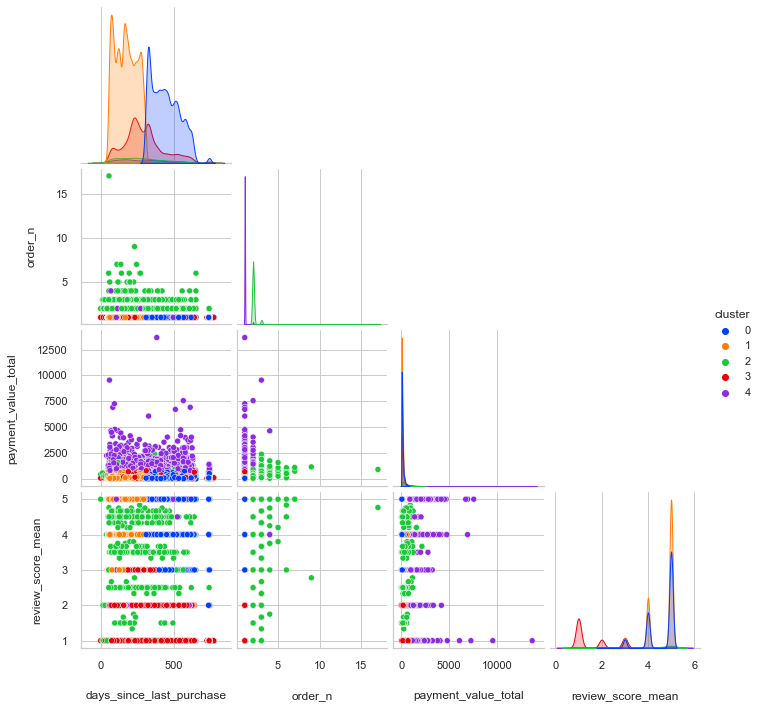

In [76]:
toolbox.pairplot_clusters(X_rfm_reviews,
                          kmeans_rfm_reviews_5.labels_,
                          palette='bright'
                          )

- cluster bleu (0) : clients ayant fait une seule commande il y a plutôt longtemps, petit montant, plutôt contents - note >= 3 ("one time shoppers")
- cluster orange (1) : clients ayant fait une seule commande plutôt récemment, petit montant, plutôt contents - note > = 3 ("new customers")
- cluster vert (2) : clients ayant fait plusieurs commandes ("loyal customers")
- cluster rouge (3) : clients ayant fait une seule commande, petit montant, plutôt non satisfaits - note <=3 ("dissatisfied customers")
- cluster violet (4) : clients ayant fait une ou plusieurs commandes et ayant le plus dépensé ("spendthrifts")

ACP :

Nous n'avons que 4 variables, donc appliquer une ACP ne semble pas très utile mais, par curiosité, regardons quand même si nos 5 clusters sont visibles plus distinctement après projection sur différents plans factoriels.

Dans le Notebook Analyse on a vu que : 

- F1 : positivement corrélé avec le nombre de commandes et le montant total dépensé -> gros clients (ont commandés plusieurs fois et/ou ont beaucoup dépensé)
- F2 : anticorrélé avec le nombre de jours depuis la dernière commande et positivement corrélé avec la note moyenne -> clients récents et satisfaits vs anciens clients moins satisfaits
- F3 : positivement corrélé avec la note moyenne et positivement corrélé avec le nombre de jours depuis la dernière commande -> anciens clients satisfaits vs clients plus récents et moins satisfaits

Pourcentage de variance expliquée par la première composante : 28.35%
Pourcentage de variance expliquée par les 2 premières composantes ensembles : 54.22%
Pourcentage de variance expliquée par les 3 premières composantes ensembles : 78.43%


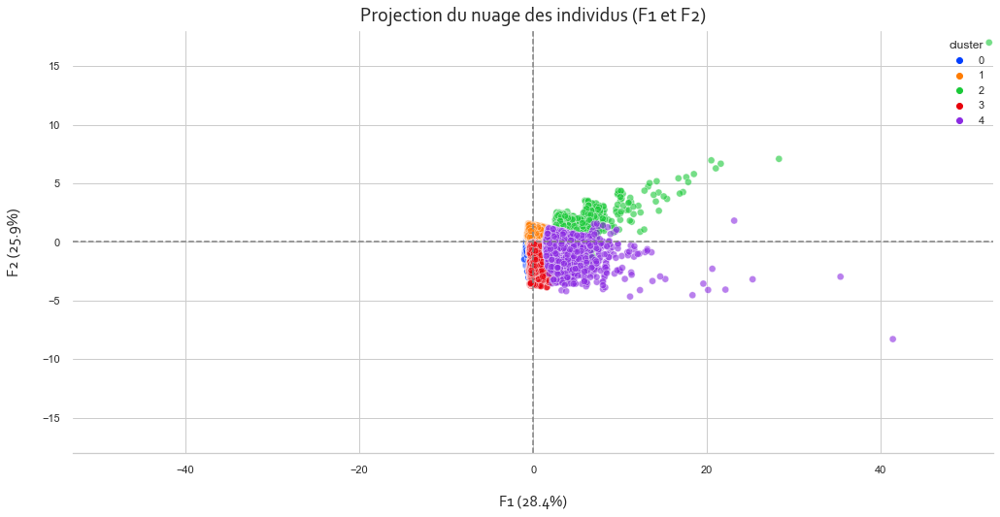

In [77]:
pca_rfm_reviews, X_rfm_reviews_proj = toolbox.fit_transform_pca(X_rfm_reviews_scaled, 3,
                                                                False, True
                                                                )

X_proj_df = toolbox.display_pca_scatterplot(pca_rfm_reviews, 0, 1,
                                            X_rfm_reviews_proj, 3,
                                            (17, 8), True,
                                            kmeans_rfm_reviews_5.labels_,
                                            hue_palette='bright'
                                            )

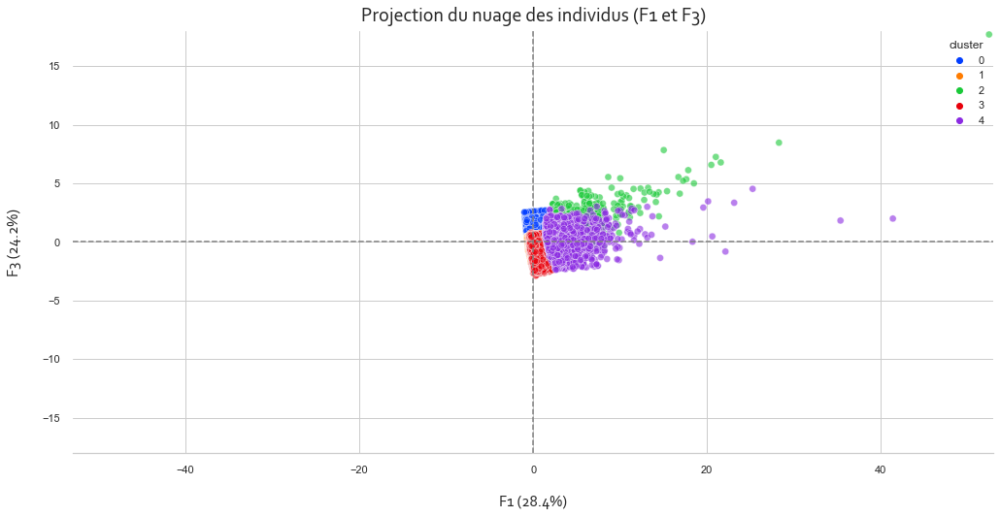

In [78]:
X_proj_df = toolbox.display_pca_scatterplot(pca_rfm_reviews, 0, 2, X_rfm_reviews_proj, 3, (17, 8), True,
                                            kmeans_rfm_reviews_5.labels_, hue_palette='bright')

En projetant les données sur différents plan factoriels, on distingue mal les 5 clusters. De plus les composantes de cette ACP sont difficiles à interpréter. Il semble plus simple d'analyser les clusters en regardant directement les variables originales (boxplot ou pairplot)

- F1 semble séparer les "petits" clients (ayant peu dépensé et peu commandé) des "gros" clients (ayant beaucoup dépensé et/ou commandé)
    - clusters bleu (0), orange (1) et rouge (3) : "petits" clients
    - cluster vert (2), violet (4) : "gros" clients
    
- Sur le 1er plan factoriel, F2 semble séparer les clients en fonction de leur satisfaction et de la date de leur dernier achat:
    - cluster rouge (3) : clients plutôt mécontents
    - cluster orange et vert : clients plutôt contents et/ou plus récents

BoxPlot : 

Les boxplots confirment nos observations, à savoir que :

- clusters **bleu et orange** regoupent les **clients contents ayant fait une seule commande, pour un petit montant**. Les clients oranges ont passé une commande plus récemment que les clients bleus.
- cluster **vert** regroupe les clients ayant passé **plusieurs commandes**, pour un montant total plutôt moyen, clients plutôt satisfaits.
- cluster **rouge** regroupe les clients ayant passé une seule commande pour un petit montant et plutôt **mécontents**
- cluster **violet** regoupe les clients ayant **le plus dépensé au total**, ils sont plutôt contents et ont fait peu de commandes.

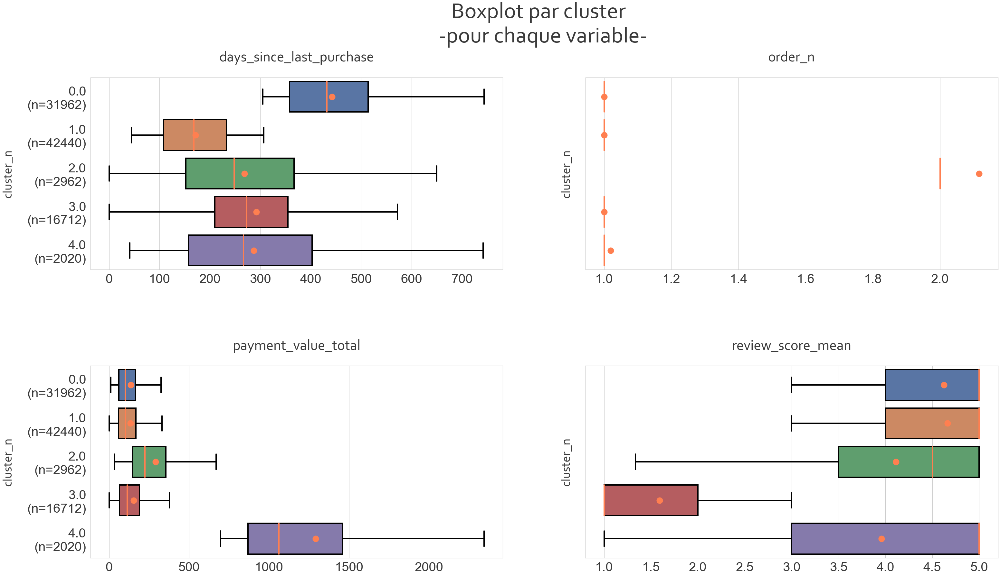

In [79]:
X_rfm_reviews_boxplot = toolbox.reshape_data_for_boxplot(X_rfm_reviews, 'cluster',
                                                         kmeans_rfm_reviews_5.labels_
                                                         )

toolbox.plot_boxplot_by_dimension(X_rfm_reviews_boxplot, X_rfm_reviews.columns.values, 2,
                                  'par cluster \n -pour chaque variable-', (40, 25),
                                  'cluster_n', True, top=0.85, hspace=0.5
                                  )

Radar Plot

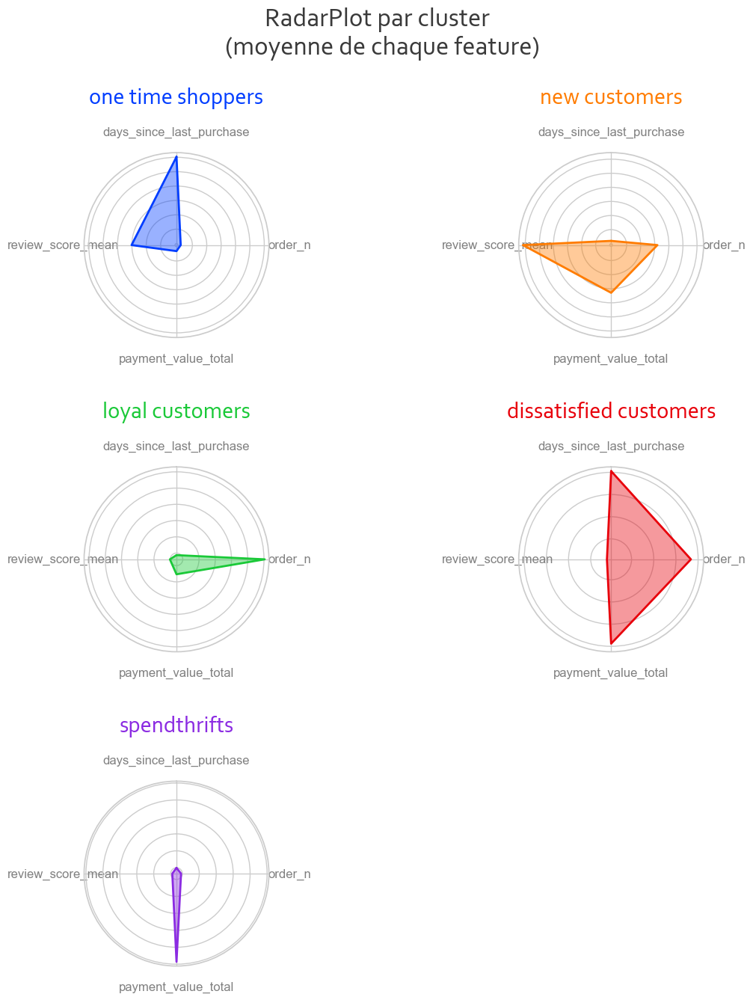

In [80]:
cluster_name = {0: "one time shoppers",
                1: "new customers",
                2: "loyal customers",
                3: "dissatisfied customers",
                4: "spendthrifts"
                }

X_rfm_reviews_radar = toolbox.reshape_for_radar(X_rfm_reviews_scaled,
                                                X_rfm_reviews.columns.values, 'cluster',
                                                kmeans_rfm_reviews_5.labels_, cluster_name
                                                )

toolbox.display_spider_chart(X_rfm_reviews_radar, 'cluster', 2, (15, 15),
                             'par cluster \n (moyenne de chaque feature)',
                             palette='bright', top=0.85, hspace=0.7, wspace=0
                             )

<h5 style="font-family:Corbel Light; color:#737373">Evaluation</h5>

Regardons si nos clusters sont équilibrés.

In [81]:
X_rfm_reviews_boxplot['cluster'] = X_rfm_reviews_boxplot['cluster'].apply(lambda row:
                                                                          cluster_name[row])

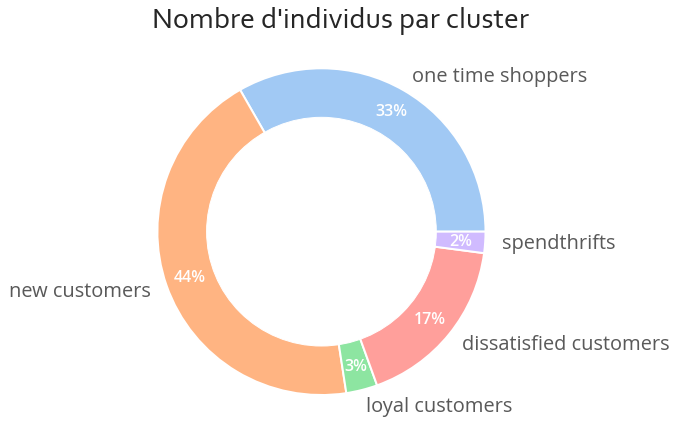

In [82]:
toolbox.plot_donut(X_rfm_reviews_boxplot, 'cluster', 'Nombre d\'individus par cluster',
                   (10, 6), colors={'outside': sns.color_palette('pastel')}
                   )

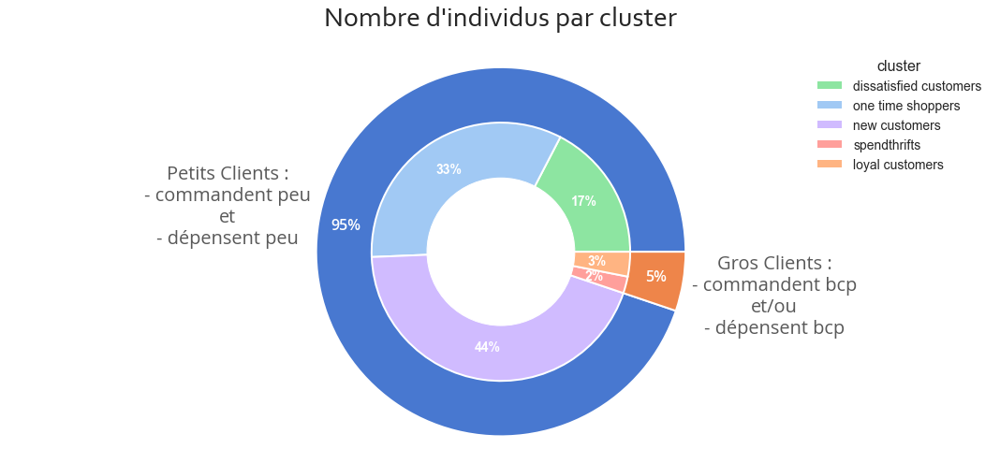

In [83]:
order = {"dissatisfied customers": 0,
         "one time shoppers": 1,
         "new customers": 2,
         "spendthrifts": 3,
         "loyal customers": 4
         }
big_customers = ['spendthrifts', 'loyal customers']

palette = sns.color_palette('pastel', 5)
palette.sort()
colors = {"inside": palette, "outside": sns.color_palette('muted', 2)}

X_rfm_reviews_nested_donut = toolbox.reshape_for_nested_donut(X_rfm_reviews_boxplot,
                                                              order, big_customers
                                                              )
toolbox.plot_donut(X_rfm_reviews_nested_donut, 'customer', 'Nombre d\'individus par cluster',
                   (15, 7), colors=colors, nested=True, sub_categ_var='cluster', labeldistance=1.5,
                   textprops={'fontsize': 20, 'color': '#595959',
                              'fontname': 'Open Sans', 'ha': 'center'}
                   )

La variable "note moyenne" semble apporter plus d'informations (elle permet de créer un nouveau groupe avec 17% des clients) que la variable "nombre moyen de produits par commande" qui permet de regrouper seulement 2% des clients.

Calculons le coefficient de silhouette moyen pour ce clustering.

Rappel: Le coefficient de silhouette mesure à quel point chaque observation appartient au "bon" cluster selon les critères d'homogénéité et de séparation. Plus il est proche de 1, meilleur est le clustering.

In [84]:
%%time
print("Coefficient de silhouette moyen pour 5 clusters: %0.3f" %
      metrics.silhouette_score(X_rfm_reviews_scaled, kmeans_rfm_reviews_5.labels_))

Coefficient de silhouette moyen pour 5 clusters: 0.418
CPU times: total: 3min 7s
Wall time: 2min 31s


Il est plus faible que le coefficient de silhouette moyen des deux modèles précédents (RFM : 0.489 , RFM + Produits : 0.442).

Regardons le coefficient de silhouette moyen de chaque cluster :

- Peu de points ont un coefficient de silhouette en dessous de 0 (i.e. assignés au mauvais cluster). C'est une bonne chose.
- Nos clusters ne sont pas bien équilibrés. Mais celà est surtout dû à la composition du jeu de données, seuls 3% des clients ont commandé plusieurs fois. Je pense qu'il est intéressant d'identifier quand même ces clients et donc de garder des clusters plus petits que les autres.

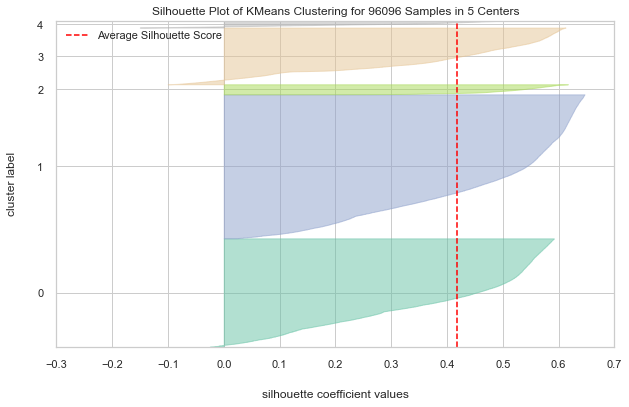

CPU times: total: 6min 24s
Wall time: 5min 5s


In [85]:
%%time
plt.figure(figsize=(10, 6))
silhouette_visualizer(KMeans(5, random_state=8, n_init=10),
                      X_rfm_reviews_scaled, colors='Set2')
plt.show()

<h4 style="font-family:Corbel Light; color:#737373">5 variables : RFM + nombre moyen de produits + note moyenne</h4>

- nombre de jours depuis le dernier achat,
- nombre de fois que la personne a acheté,
- montant total des achats,
- nombre moyen de produits par commande,
- note moyenne attribuée par le client à ses commandes

In [86]:
X_scaled = StandardScaler().fit_transform(X)
X_scaled.shape

(96096, 5)

<h5 style="font-family:Corbel Light; color:#737373">Choix du nombre de clusters</h5>

Utilisons la méthode du coude.

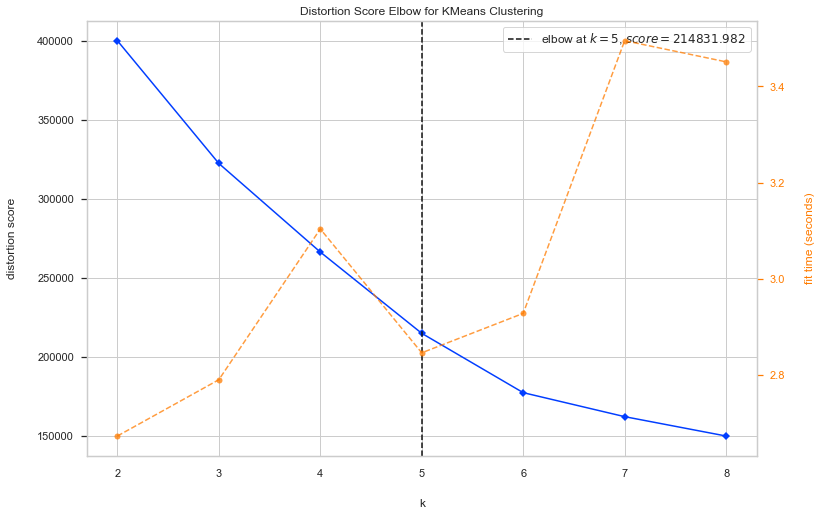

In [87]:
plt.figure(figsize=(12, 8))
kelbow_visualizer(KMeans(random_state=8, n_init=10), X_scaled, k=(2, 9))
plt.show()

In [88]:
kmeans_all_5 = KMeans(n_clusters=5, n_init=10, random_state=8)
kmeans_all_5.fit(X_scaled)

KMeans(n_clusters=5, n_init=10, random_state=8)

<h5 style="font-family:Corbel Light; color:#737373">Visualisation des données</h5>

Testons plusieurs approches pour visualiser nos données en 2 dimensions et les analyser :  
- features 2 à 2 : pairplot
- réduction dimensionnelle : pca
- analyse des profils clients : boxplot, radarplot

Commençons par projeter nos données sur chaque couple possible de variables.

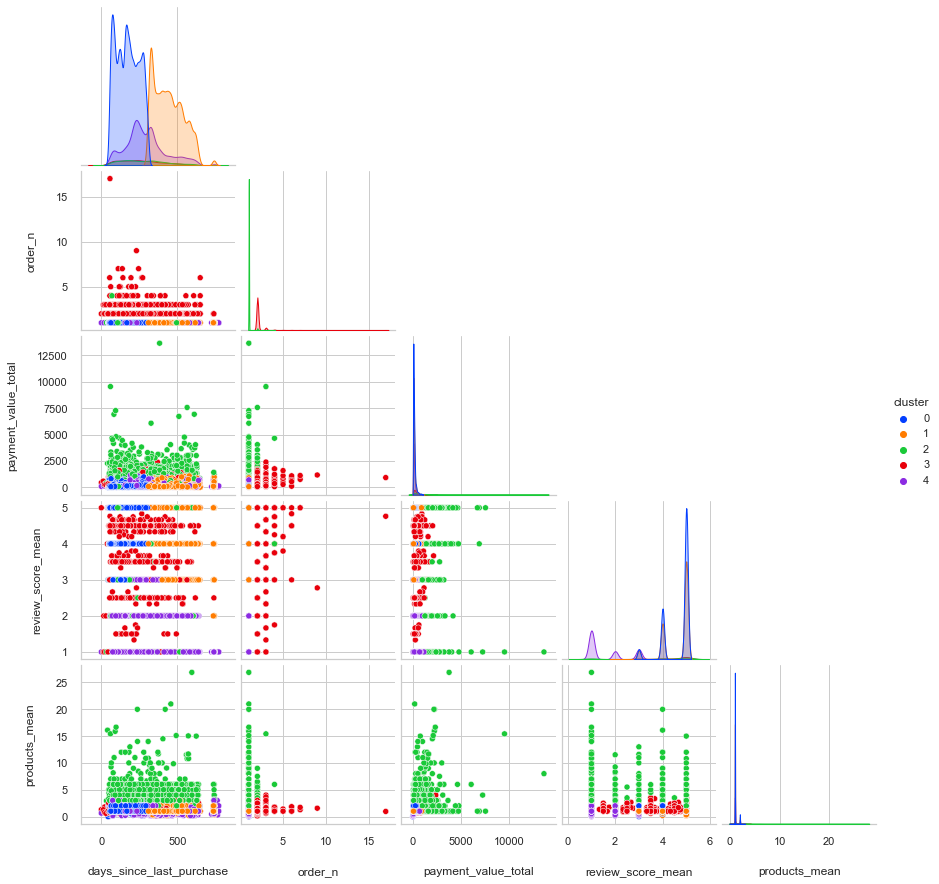

In [89]:
toolbox.pairplot_clusters(X, kmeans_all_5.labels_, palette='bright')

- cluster bleu (0) : clients ayant réalisé une commande plutôt récemment, peu de produits par commande, petit montant, plutôt contents - note >=3 ("new customers")
- cluster orange (1) :  clients ayant passé une seule commande il y a plutôt longtemps, plutôt content - note >=3, petit montant, peu de produits ("one time shoppers")
- cluster vert (2) : clients qui dépensent le plus et/ou achètent le plus de produits par commande, peu de commandes ("big buyers")
- cluster rouge (3) : clients ayant commandé plusieurs fois, montant moyen ou petit, peu de produits par commande ("loyal customers")
- cluster violet (4) : clients ayant passé une seule commande, petit montant, peu de produits, plutôt mécontents - note<=3, ("dissatisfied customers")

BoxPlot : 

Les boxplot permettent de confirmer nos observations, à savoir que :
- Les clusters bleu, orange et violet regroupent les clients ayant passé une seule commande, pour un petit montant et peu de produits. Les clients oranges plus sont les plus anciens, les bleus les plus récents. Quant aux violets ils sont plutôt mécontents.
    
    
- Les clusters rouge et vert regroupent des "gros clients". Les clients verts commandent beaucoup de produit à la fois et/ou dépensent beaucoup (grosses commandes soit en terme de quantité de produits, soit en terme de montant). Les clients rouges passent beaucoup de commandes.

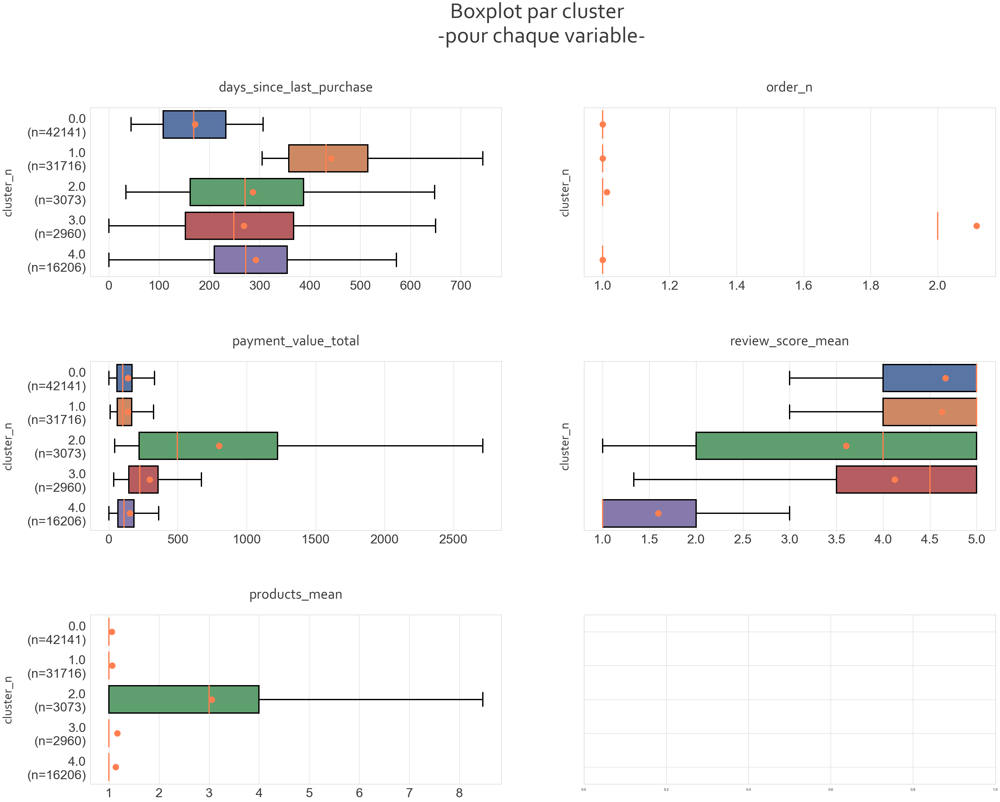

In [90]:
X_boxplot = toolbox.reshape_data_for_boxplot(X, 'cluster',
                                             kmeans_all_5.labels_
                                             )
toolbox.plot_boxplot_by_dimension(X_boxplot, X.columns.values, 2,
                                  'par cluster \n -pour chaque variable-',
                                  (40, 35), 'cluster_n', True,
                                  top=0.85, hspace=0.5
                                  )

RadarPlot

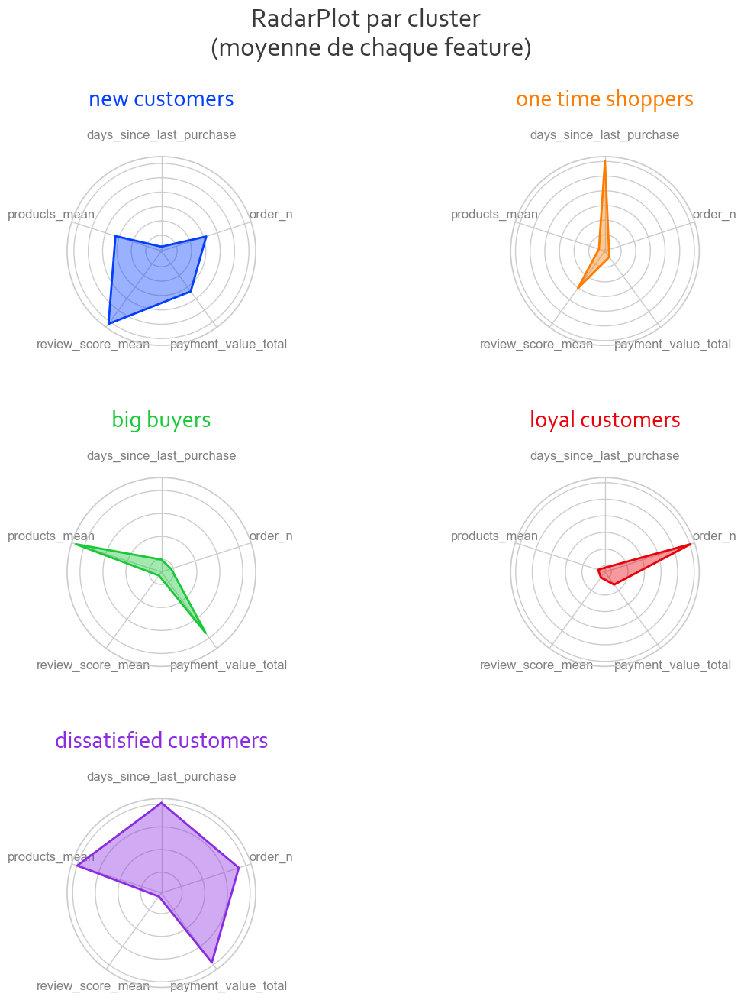

In [91]:
cluster_name = {0: "new customers",
                1: "one time shoppers",
                2: "big buyers",
                3: "loyal customers",
                4: "dissatisfied customers"
                }

X_radar = toolbox.reshape_for_radar(X_scaled, X.columns.values, 'cluster',
                                    kmeans_all_5.labels_, cluster_name
                                    )

toolbox.display_spider_chart(X_radar, 'cluster', 2, (15, 15),
                             'par cluster \n (moyenne de chaque feature)',
                             palette='bright', top=0.85, hspace=0.7, wspace=0
                             )

<h5 style="font-family:Corbel Light; color:#737373">Evaluation</h5>

Regardons si nos clusters sont équilibrés

In [92]:
X_boxplot['cluster'] = X_boxplot['cluster'].apply(lambda row:
                                                  cluster_name[row])

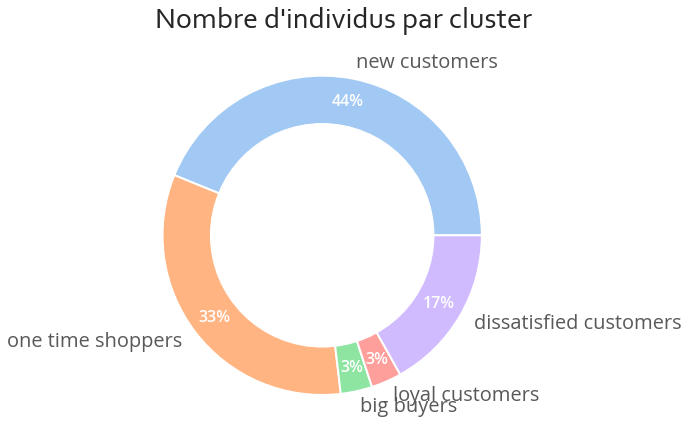

In [93]:
toolbox.plot_donut(X_boxplot, 'cluster', 'Nombre d\'individus par cluster',
                   (10, 6), colors={'outside': sns.color_palette('pastel')}
                   )

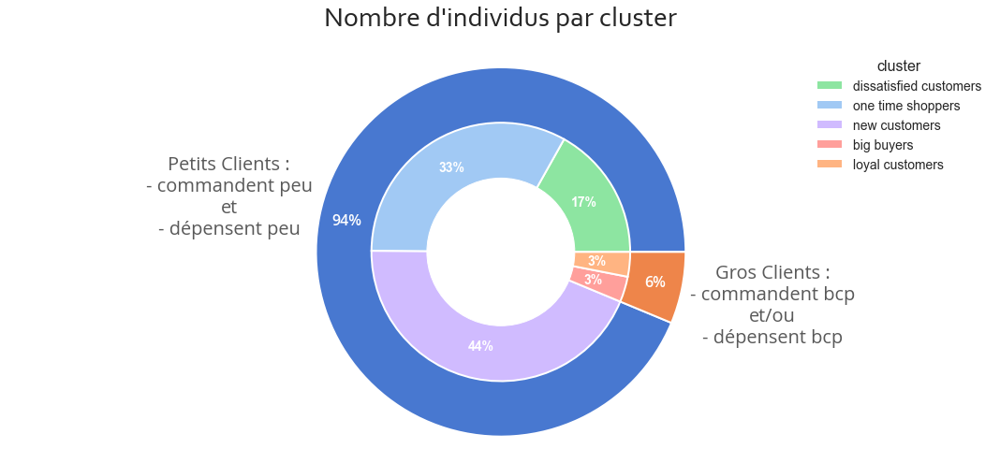

In [94]:
order = {"dissatisfied customers": 0, "one time shoppers": 1,
         "new customers": 2, "big buyers": 3, "loyal customers": 4}
big_customers = ['big buyers', 'loyal customers']

palette = sns.color_palette('pastel', 5)
palette.sort()
colors = {"inside": palette, "outside": sns.color_palette('muted', 2)}

X_nested_donut = toolbox.reshape_for_nested_donut(X_boxplot,
                                                  order,
                                                  big_customers
                                                  )

toolbox.plot_donut(X_nested_donut, 'customer', 'Nombre d\'individus par cluster',
                   (15, 7), colors=colors, nested=True, sub_categ_var='cluster', labeldistance=1.5,
                   textprops={'fontsize': 20, 'color': '#595959',
                              'fontname': 'Open Sans', 'ha': 'center'}
                   )

Regardons si on obtient des clusters similaires à ceux obtenus en utilisant seulement 4 variables (sans le nombre moyen de produits) afin de voir si il est vraiment pertinent d'ajouter la variable "nombre moyen de produits par commande". 

In [95]:
ari = metrics.adjusted_rand_score(kmeans_rfm_reviews_5.labels_,
                                  kmeans_all_5.labels_
                                  )
print(ari)

0.9525472285538921


Calculons le coefficient de silhouette moyen pour ce clustering.

Rappel: Le coefficient de silhouette mesure à quel point chaque observation appartient au "bon" cluster selon les critères d'homogénéité et de séparation. Plus il est proche de 1, meilleur est le clustering.

In [96]:
%%time
print("Coefficient de silhouette moyen pour 5 clusters: %0.3f" %
      metrics.silhouette_score(X_scaled, kmeans_all_5.labels_))

Coefficient de silhouette moyen pour 5 clusters: 0.368
CPU times: total: 3min 6s
Wall time: 2min 29s


Il est moins élevé que le coefficient de silhouette moyen de tous les autres modèles KMeans testés.

5 Features (0.368) < RFM + note (0.418) < RFM + Produits (0.442) < RFM (0.489)

Regardons le coefficient de silhouette moyen de chaque cluster :

- Nos clusters ne sont pas bien équilibrés.
- Comparé aux autres modèles, il y a plus de points assignés au mauvais cluster (avec un coefficient de silhouette inférieur à 0). En particulier, le cluster "big buyers" a une forme de papillon, i.e. autant de points plutôt mal assignés que de points plutôt bien assignés. Il faudrait peut-être le couper en 2 et séparer les clients qui dépensent beaucoup des clients qui achètent de nombreux produits. Mais, en faisant cela, on obtiendrait deux clusters encore plus minis.

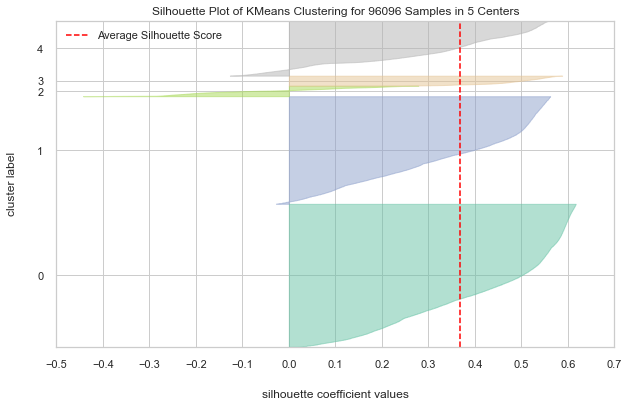

CPU times: total: 6min 22s
Wall time: 5min 2s


In [97]:
%%time
plt.figure(figsize=(10, 6))
silhouette_visualizer(KMeans(5, random_state=8, n_init=10),
                      X_scaled, colors='Set2')
plt.show()

<h4 style="font-family:Corbel Light; color:#737373">Conclusion</h4>

Pour le KMeans, comme pour le clustering hiérarchique, le modèle avec 4 variables (rfm + note de satisfaction moyenne) et 5 clusters semble être le meilleur. Il permet bien de distinguer les "bons" clients des moins bons, ainsi que les clients peu satisfaits. Ajouter le nombre de produits moyen par commande à ce modèle donne de moins bons résultats : le coefficient de silhouette moyen baisse et un des petits clusters a besoin d'être coupé en deux, ce qui rendrait notre modèle encore plus déséquilibré avec des minis clusters.

<h3 style="font-family:Corbel Light; color:#737373">DBSCAN</h3>

Je n'arrive pas à paramétrer le modèle pour l'entrainer sur le jeu de données entier standardisé. Chaque fois que j'essaie, mon ordinateur freeze et je dois le redémarrer. Il semblerait que DBSCAN soit trop gourmand en espace mémoire.

J'ai réussi à entrainer DBSCAN sur des données standardisées dans Google Colab et les résultats sont tout aussi mauvais, ce qui m'a permis de conclure que cet algorithme n'est pas adapté à notre problématique. A noter que même dans Google Colab, faire tourner DBSCAN consomme pratiquement toute la RAM disponible. 

Pour illuster ma démarche de test, j'ai donc seulement affiché dans ce notebook les résultats obtenus sur :
- le jeu de données entier non standardisé (l'algorithme accorde plus d'importance aux variables exprimées dans un ordre de grandeur plus élevé que les autres, en particuler le nombre de commandes n'est pas bien pris en compte)
- un échantillon de 1000 individus représentatifs du jeu de données obtenus en appliquant un KMeans

Peu importe les données utilisées (standardisées/non standardisées, jeu entier/échantillon) les conclusions sont les mêmes : les clusters sont difficiles à interpréter et déséquilibrés.

<h4 style="font-family:Corbel Light; color:#737373"> 3 variables : RFM</h4>

- nombre de jours depuis le dernier achat,
- nombre de fois que la personne a acheté,
- montant total des achats

In [157]:
X_rfm = customer_data.drop(columns=['review_score_mean', 'products_mean'])
X_rfm_scaled = StandardScaler().fit_transform(X_rfm)
X_rfm_scaled.shape

(96096, 3)

In [99]:
X_rfm.head()

,days_since_last_purchase,order_n,payment_value_total
customer_unique_id,,,
0000366f3b9a7992bf8c76cfdf3221e2,160,1,141.90
0000b849f77a49e4a4ce2b2a4ca5be3f,163,1,27.19
0000f46a3911fa3c0805444483337064,585,1,86.22
0000f6ccb0745a6a4b88665a16c9f078,369,1,43.62
0004aac84e0df4da2b147fca70cf8255,336,1,196.89


**Ensemble des données non standardisées**

<h5 style="font-family:Corbel Light; color:#737373">Choix des paramètres</h5>

D'après la littérature :

- min_sample : 2*dimensions
- epsilon : 
    - pour chaque observation on calcule la distance moyenne à ses n_min voisins les plus proches, 
    - on trie les distances obtenues dans l'ordre croissant, 
    - on affiche une courbe
    - on prend la distance moyenne qui se situe au niveau du "coude"

Pour n_min = 6, epsilon = 30 -> 29 clusters

On obtient un trop grand nombre de clusters, essayons d'augmenter le nombre de voisins pour obtenir moins de clusters.

- Pour n_min = 20  - epsilon = 30 -> 12 clusters 
- Pour n_min = 30 - epsilon = 25 -> 9 clusters
- Pour n_min = 40 - epsilon = 30 -> 7 clusters
- Pour n_min = 60 - epsilon = 30 -> 3 clusters
- Pour n_min = 70 - epsilon = 25 - > 4 clusters
- Pour n_min = 100 - epsilon = 25 -> 4 clusters

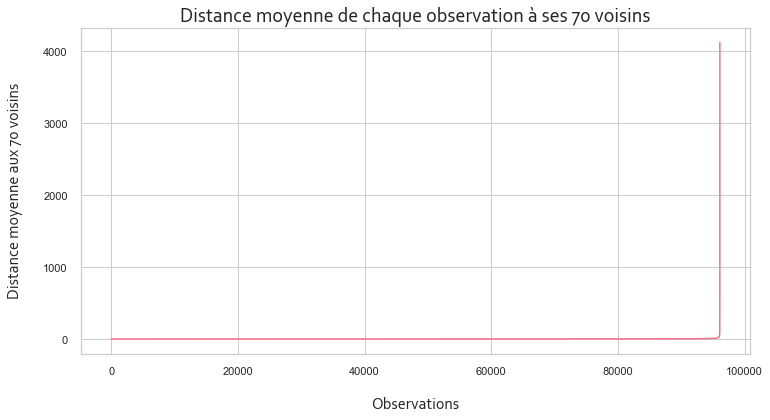

In [165]:
n_min = 70
toolbox.display_neighbors_distance_elbow(X_rfm, n_min, (12, 6), palette='husl')

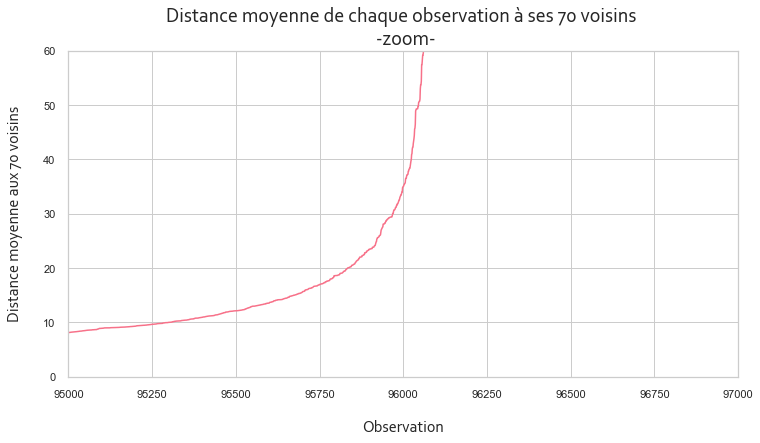

In [101]:
toolbox.display_neighbors_distance_elbow(X_rfm, n_min, (12, 6), True,
                                         [95_000, 97_000], [0, 60],
                                         palette='husl'
                                         )

Essayons pour n_min = 40, 60 et 70

In [102]:
dbscan_rfm_7 = DBSCAN(min_samples=40, eps=30).fit(X_rfm)
print('Pour 40 voisins on obtient {} clusters'.format(
    len(np.unique(dbscan_rfm_7.labels_))))
dbscan_rfm_3 = DBSCAN(min_samples=60, eps=30).fit(X_rfm)
print('Pour 60 voisins on obtient {} clusters'.format(
    len(np.unique(dbscan_rfm_3.labels_))))
dbscan_rfm_4 = DBSCAN(min_samples=70, eps=25).fit(X_rfm)
print('Pour 70 voisins on obtient {} clusters'.format(
    len(np.unique(dbscan_rfm_4.labels_))))

Pour 40 voisins on obtient 7 clusters
Pour 60 voisins on obtient 3 clusters
Pour 70 voisins on obtient 4 clusters


<h5 style="font-family:Corbel Light; color:#737373">Visualisation des données</h5>

Testons plusieurs approches pour visualiser nos données en 2 dimensions et les analyser :  
- features 2 à 2 : pairplot
- analyse des profils clients : boxplot

Commençons par projeter nos données sur tous les couples possible de variables.

Pour 3 clusters

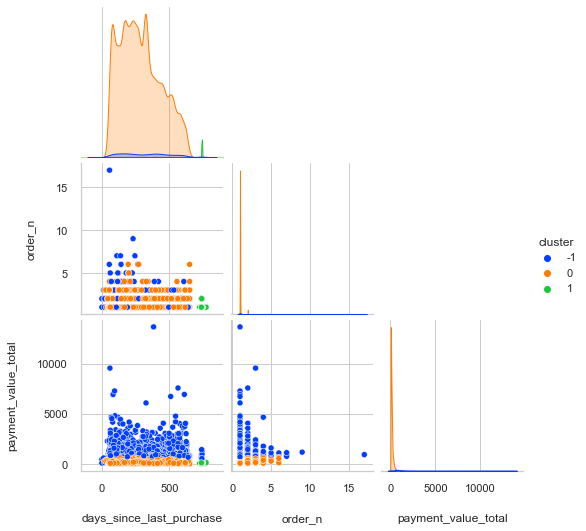

In [103]:
toolbox.pairplot_clusters(X_rfm, dbscan_rfm_3.labels_, palette='bright')

Trop difficiles à interpréter: Ne prend pas en compte le nombre de commandes (probablement car les données sont non réduites)
   - cluster bleu (-1) : les clients qui dépensent beaucoup (normalement les outliers)
   - cluster orange (0) : les clients qui dépensent peu
   - cluster vert (1) : les clients les plus anciens

Pour 4 clusters 

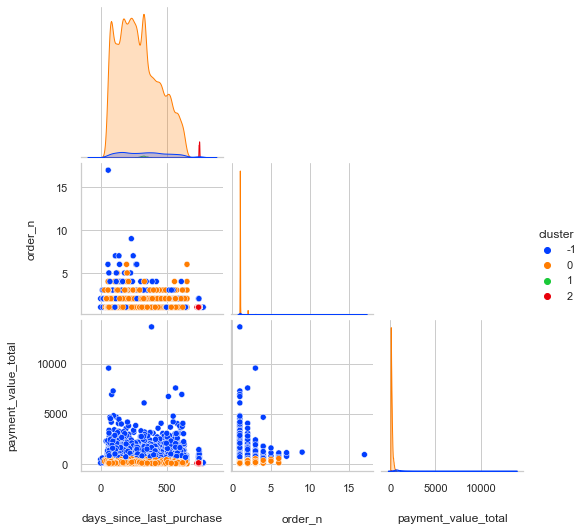

In [104]:
toolbox.pairplot_clusters(X_rfm, dbscan_rfm_4.labels_, palette='bright')

Regardons sans le cluster bleu (-1) qui nous cache un peu la vue :

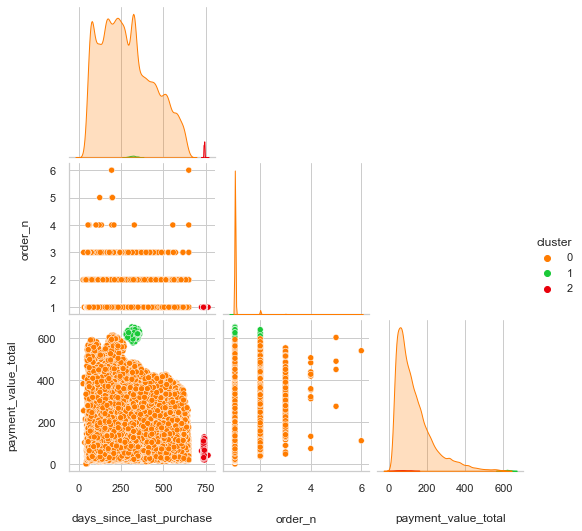

In [105]:
copy = X_rfm.copy()
copy['cluster'] = dbscan_rfm_4.labels_
copy = copy.loc[copy['cluster'].isin([0, 1, 2])]
toolbox.pairplot_clusters(copy,
                          copy['cluster'],
                          palette=sns.color_palette('bright')[1:4])

Trop difficiles à interpréter + Ne prend pas trop en compte le nombre de commandes (données non réduites)
   - cluster bleu (-1) : les clients qui dépensent beaucoup
   - cluster orange (0) : clients qui dépensent peu, commandent une ou plusieurs fois
   - cluster vert (1) : clients plutôt récents qui dépensent moyennement, une ou 2 commandes
   - cluster rouge (2) : clients les plus anciens, dépensent peu

Pour 7 clusters:

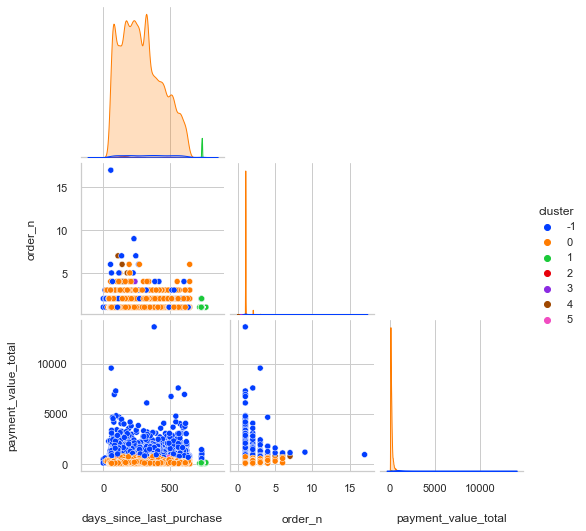

In [106]:
toolbox.pairplot_clusters(X_rfm, dbscan_rfm_7.labels_, palette='bright')

Regardons les données sans le cluster (-1)

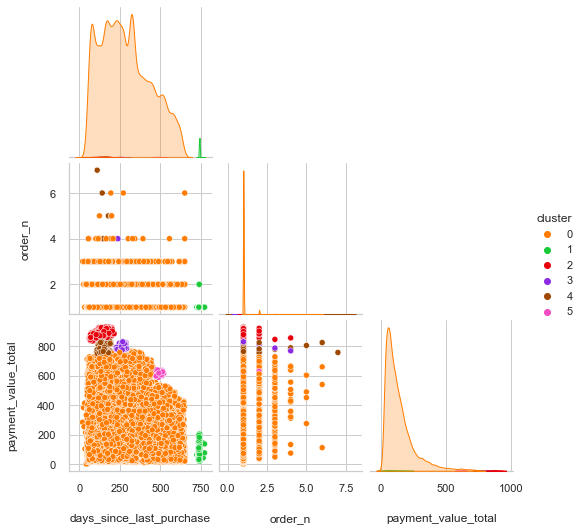

In [107]:
copy = X_rfm.copy()
copy['cluster'] = dbscan_rfm_7.labels_
copy = copy.loc[copy['cluster'].isin([0, 1, 2, 3, 4, 5])]

toolbox.pairplot_clusters(copy,
                          copy['cluster'],
                          palette=sns.color_palette('bright')[1:7]
                          )

Les clients ne semblent toujours pas être séparés selon le nombre de commandes - Toujours difficile à interpréter
   - cluster orange (0) : clients qui dépensent le moins
   - cluster bleu (-1) : clients qui dépensent le plus
    
    
   - Clients qui dépensent moyennement : rangé par nombre de jours depuis la dernière commande
       - cluster vert (1) : les plus anciens
       - cluster rose (5) : anciens 
       - cluster violet (3) : clients un peu plus récents
       - cluster rouge (2) et marron (4) : clients les plus récents

BoxPlot : 4 clusters

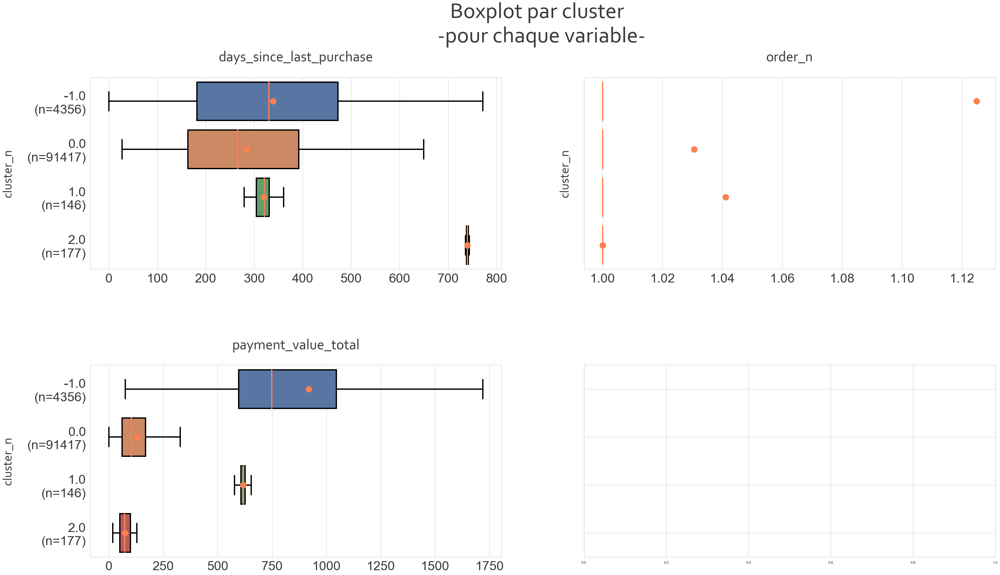

In [108]:
X_rfm_boxplot = toolbox.reshape_data_for_boxplot(X_rfm, 'cluster',
                                                 dbscan_rfm_4.labels_
                                                 )
toolbox.plot_boxplot_by_dimension(X_rfm_boxplot,
                                  X_rfm.columns.values, 2,
                                  'par cluster \n -pour chaque variable-',
                                  (40, 25), 'cluster_n', True,
                                  top=0.85, hspace=0.5
                                  )

BoxPlot : 7 clusters

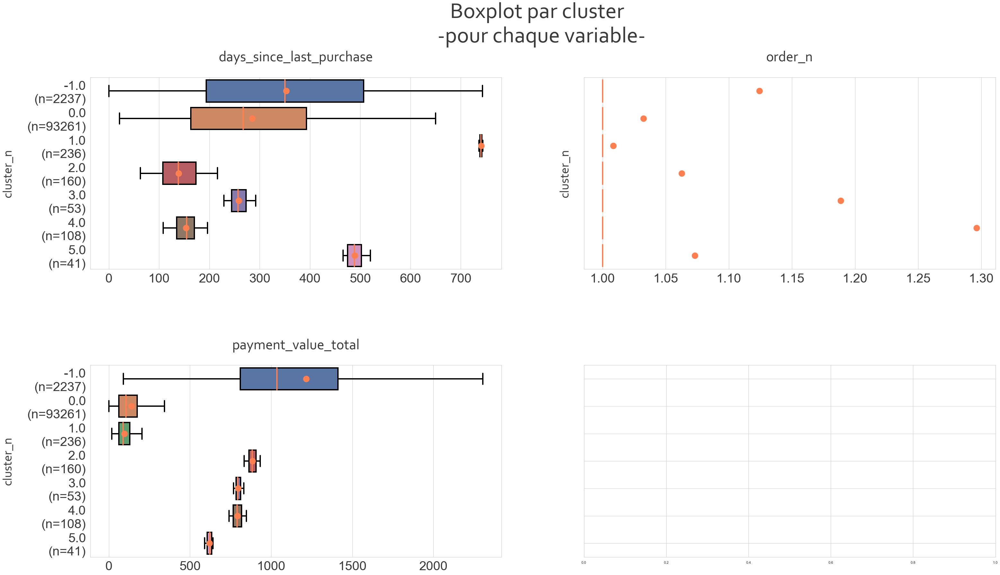

In [109]:
X_rfm_boxplot = toolbox.reshape_data_for_boxplot(X_rfm, 'cluster',
                                                 dbscan_rfm_7.labels_
                                                 )
toolbox.plot_boxplot_by_dimension(X_rfm_boxplot,
                                  X_rfm.columns.values, 2,
                                  'par cluster \n -pour chaque variable-',
                                  (40, 25), 'cluster_n', True,
                                  top=0.85, hspace=0.5
                                  )

<h5 style="font-family:Corbel Light; color:#737373">Evaluation</h5>

Regardons si on obtient des clusters équilibrés

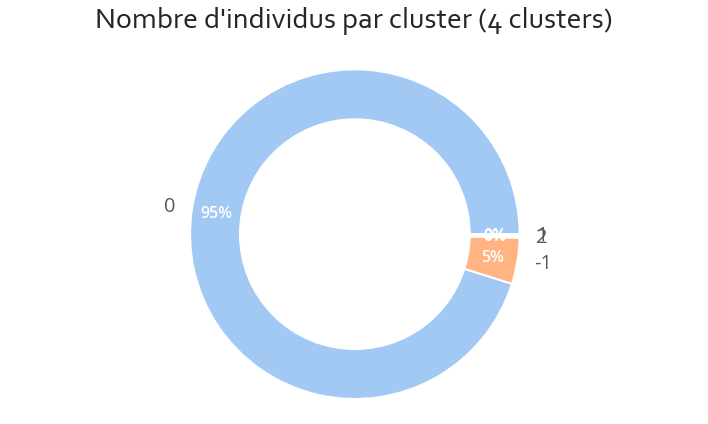

In [110]:
X_rfm_cluster = pd.DataFrame(dbscan_rfm_4.labels_, columns=['cluster'])

toolbox.plot_donut(X_rfm_cluster, 'cluster', 'Nombre d\'individus par cluster (4 clusters)',
                   (10, 6), colors={'outside': sns.color_palette('pastel')}
                   )

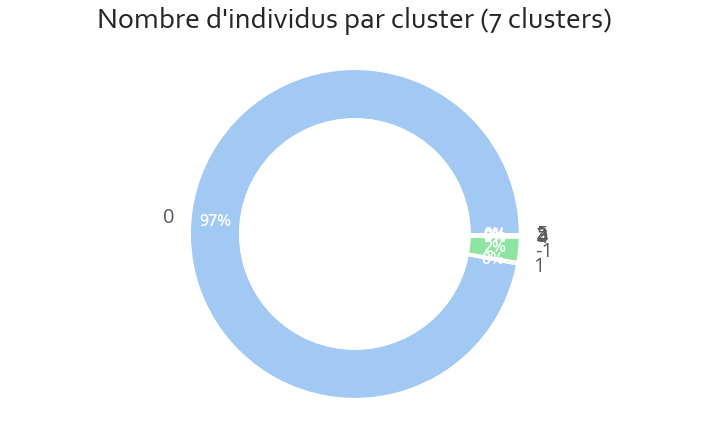

In [111]:
X_rfm_cluster = pd.DataFrame(dbscan_rfm_7.labels_, columns=['cluster'])

toolbox.plot_donut(X_rfm_cluster, 'cluster', 'Nombre d\'individus par cluster (7 clusters)',
                   (10, 6), colors={'outside': sns.color_palette('pastel')}
                   )

Les groupes sont très asymétriques. Le premier cluster crée capte la majorité des points.

---

---

**Echantillon de données standardisées**

In [112]:
kmeans = KMeans(n_clusters=1000, n_init=10, random_state=8)
kmeans.fit(X_rfm_scaled)

KMeans(n_clusters=1000, n_init=10, random_state=8)

In [113]:
centroids = kmeans.cluster_centers_
centroids_scaled = StandardScaler().fit_transform(centroids)
centroids_df = pd.DataFrame(centroids_scaled, columns=X_rfm.columns.values)
centroids_df.shape

(1000, 3)

*Choix des hyperparamètres*

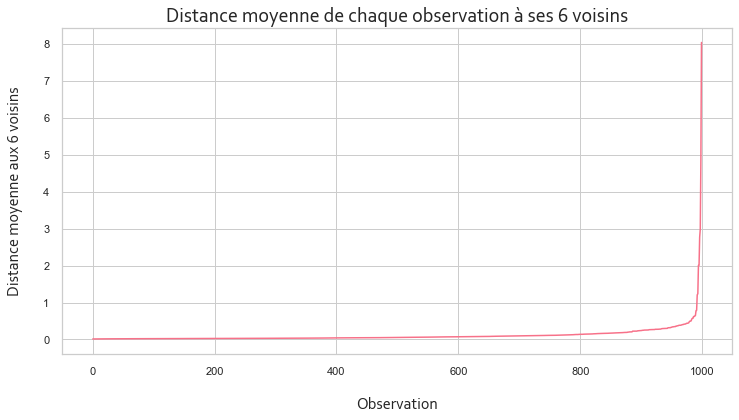

In [114]:
n_min = 6
toolbox.display_neighbors_distance_elbow(
    centroids_scaled, n_min, (12, 6), palette='husl')

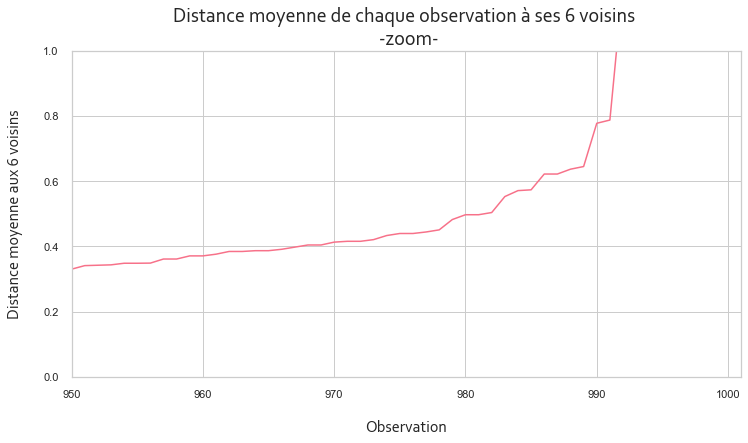

In [115]:
toolbox.display_neighbors_distance_elbow(centroids_scaled, n_min, (12, 6), True,
                                         [950, 1001], [0, 1],
                                         palette='husl'
                                         )

In [116]:
dbscan_rfm_6 = DBSCAN(min_samples=6, eps=0.79).fit(centroids_scaled)
print('Pour 6 voisins on obtient {} clusters'.format(
    len(np.unique(dbscan_rfm_6.labels_))))

Pour 6 voisins on obtient 6 clusters


In [117]:
dbscan_rfm_20 = DBSCAN(min_samples=20, eps=0.79).fit(centroids_scaled)
print('Pour 20 voisins on obtient {} clusters'.format(
    len(np.unique(dbscan_rfm_20.labels_))))

Pour 20 voisins on obtient 4 clusters


*Visualisations*

Pour 6 voisins - 6 clusters

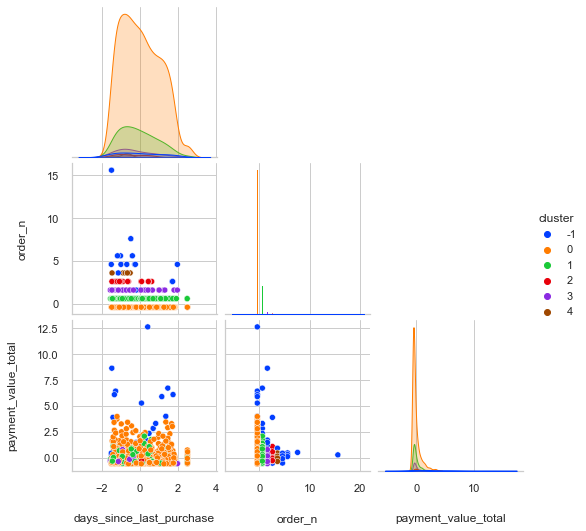

In [118]:
toolbox.pairplot_clusters(centroids_df, dbscan_rfm_6.labels_, palette='bright')

Les clients semblent être surtout regroupés selon le nombre de commandes passées. Ces clusters sont un peu difficiles à interpréter.

- cluster orange (0) : clients qui commandent le moins
- cluster vert (1) : clients qui commandent peu
- cluster violet (3) : clients qui commandent moyennement peu
- cluster rouge (2) : clients qui commandent moyennement
- cluster marron (4) : clients qui commandent beaucoup et dont la dernière commande est plutôt récente
- cluster bleu (-1) : outliers - clients qui ont dépensé le plus et/ou commandé le plus

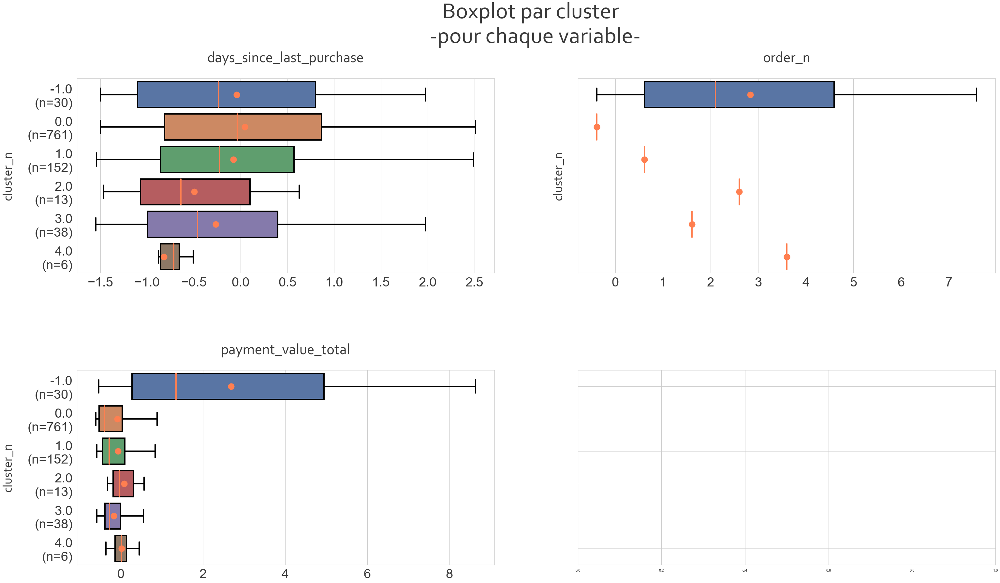

In [119]:
X_rfm_boxplot = toolbox.reshape_data_for_boxplot(centroids_df, 'cluster',
                                                 dbscan_rfm_6.labels_
                                                 )
toolbox.plot_boxplot_by_dimension(X_rfm_boxplot,
                                  X_rfm.columns.values, 2,
                                  'par cluster \n -pour chaque variable-',
                                  (40, 25), 'cluster_n', True,
                                  top=0.85, hspace=0.5
                                  )

Pour 20 voisins - 4 clusters

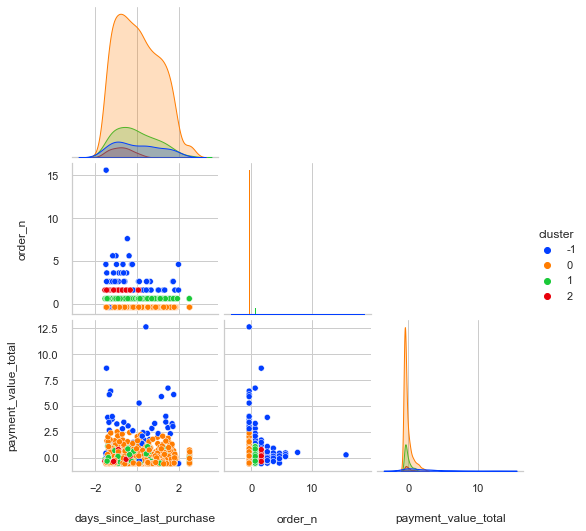

In [120]:
toolbox.pairplot_clusters(
    centroids_df, dbscan_rfm_20.labels_, palette='bright')

cluster bleu (-1) : outliers, clients qui dépensent le plus et/ou commandent le plus

Les clients sont regroupés dans les trois autres clusters selon le nombre de commandes qu'ils ont passé :
- cluster orange (0) : clients qui commandent peu
- cluster vert (1) : clients qui commandent moyennement
- cluster rouge (2) : clients qui commandent beaucoup et dont la dernière commande a été passée plutôt récemment

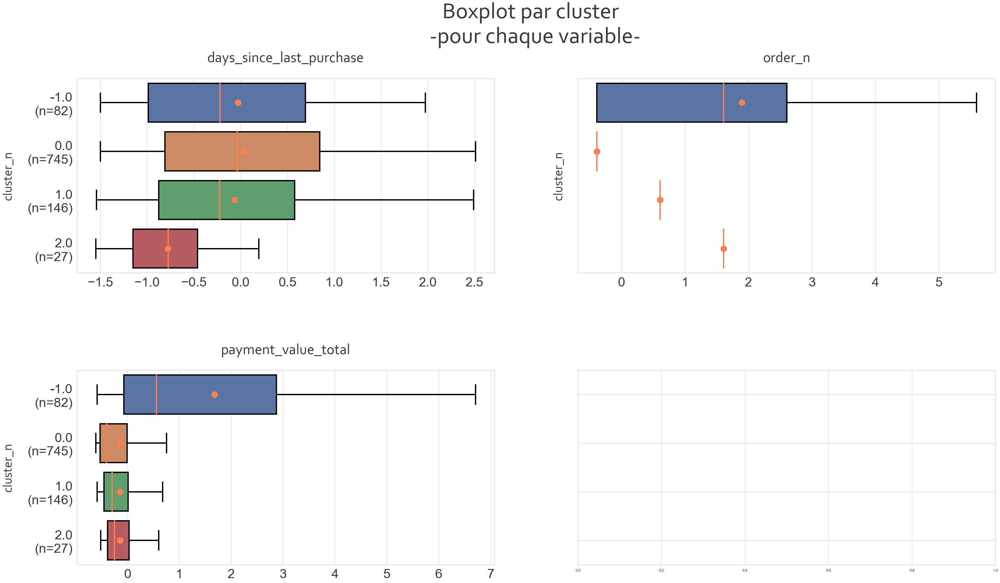

In [121]:
X_rfm_boxplot = toolbox.reshape_data_for_boxplot(centroids_df, 'cluster',
                                                 dbscan_rfm_20.labels_
                                                 )
toolbox.plot_boxplot_by_dimension(X_rfm_boxplot,
                                  X_rfm.columns.values, 2,
                                  'par cluster \n -pour chaque variable-',
                                  (40, 25), 'cluster_n', True,
                                  top=0.85, hspace=0.5
                                  )

*Evaluation*

Regardons si les clusters sont équilibrés

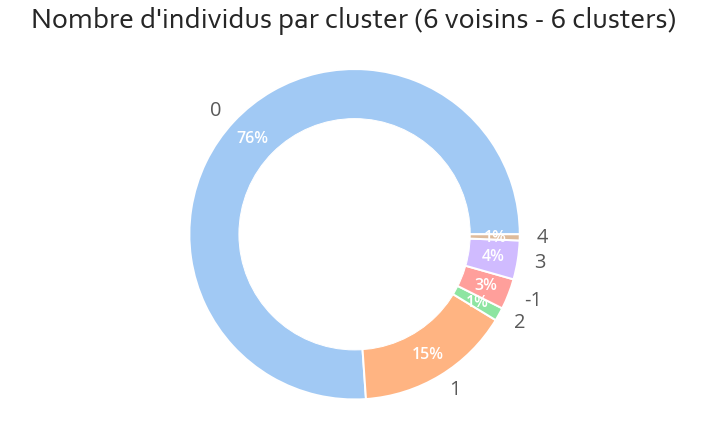

In [122]:
X_rfm_cluster = pd.DataFrame(dbscan_rfm_6.labels_, columns=['cluster'])

toolbox.plot_donut(X_rfm_cluster, 'cluster', 'Nombre d\'individus par cluster (6 voisins - 6 clusters)',
                   (10, 6), colors={'outside': sns.color_palette('pastel')}
                   )

Les clusters ne semblent pas bien équilibrés. On a un grand cluster (0) qui capte 76% des données et 5 petits clusters.

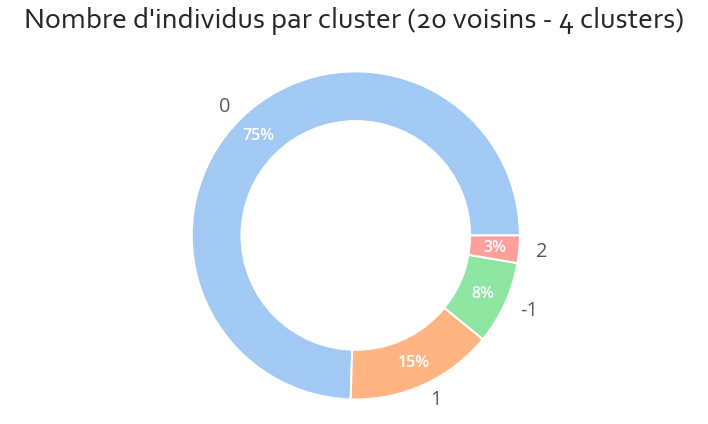

In [123]:
X_rfm_cluster = pd.DataFrame(dbscan_rfm_20.labels_, columns=['cluster'])

toolbox.plot_donut(X_rfm_cluster, 'cluster', 'Nombre d\'individus par cluster (20 voisins - 4 clusters)',
                   (10, 6), colors={'outside': sns.color_palette('pastel')}
                   )

Même conclusion, les clusters ne sont pas équilibrés. Le cluster 0 capte 76% des individus.

---

---

<h4 style="font-family:Corbel Light; color:#737373">4 variables : rfm + note moyenne</h4>

In [124]:
X_rfm_reviews = customer_data.drop(columns=['products_mean'])
X_rfm_reviews_scaled = StandardScaler().fit_transform(X_rfm_reviews)
X_rfm_reviews_scaled.shape

(96096, 4)

**Ensemble des données non standardisées**

<h5 style="font-family:Corbel Light; color:#737373">Choix des paramètres</h5>

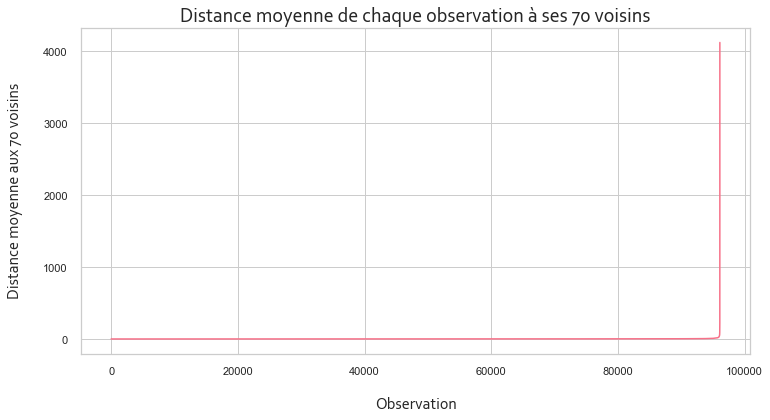

In [125]:
n_min = 70
toolbox.display_neighbors_distance_elbow(X_rfm_reviews,
                                         n_min, (12, 6),
                                         palette='husl'
                                         )

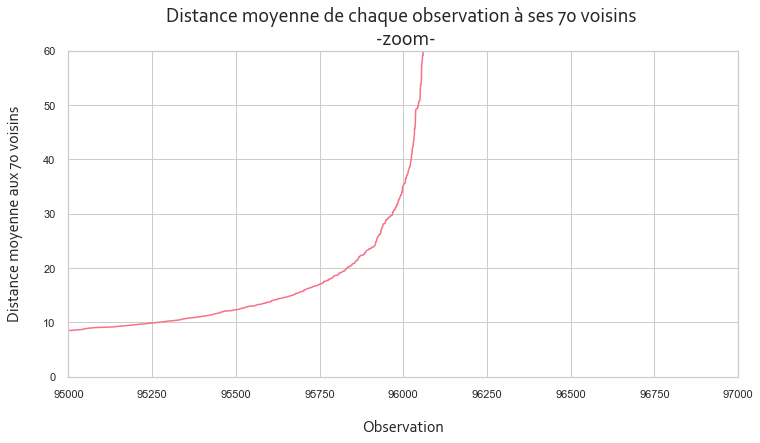

In [126]:
toolbox.display_neighbors_distance_elbow(X_rfm_reviews,
                                         n_min, (12, 6), True,
                                         [95_000, 97_000], [0, 60],
                                         palette='husl'
                                         )

In [127]:
dbscan_rfm_reviews_7 = DBSCAN(min_samples=40, eps=30).fit(X_rfm_reviews)
print('Pour 40 voisins on obtient {} clusters'.format(
    len(np.unique(dbscan_rfm_reviews_7.labels_))))
dbscan_rfm_reviews_3 = DBSCAN(min_samples=60, eps=30).fit(X_rfm_reviews)
print('Pour 60 voisins on obtient {} clusters'.format(
    len(np.unique(dbscan_rfm_reviews_3.labels_))))
dbscan_rfm_reviews_4 = DBSCAN(min_samples=70, eps=30).fit(X_rfm_reviews)
print('Pour 70 voisins on obtient {} clusters'.format(
    len(np.unique(dbscan_rfm_reviews_4.labels_))))

Pour 40 voisins on obtient 7 clusters
Pour 60 voisins on obtient 3 clusters
Pour 70 voisins on obtient 4 clusters


<h5 style="font-family:Corbel Light; color:#737373">Visualisation des données</h5>

Pour 4 clusters :

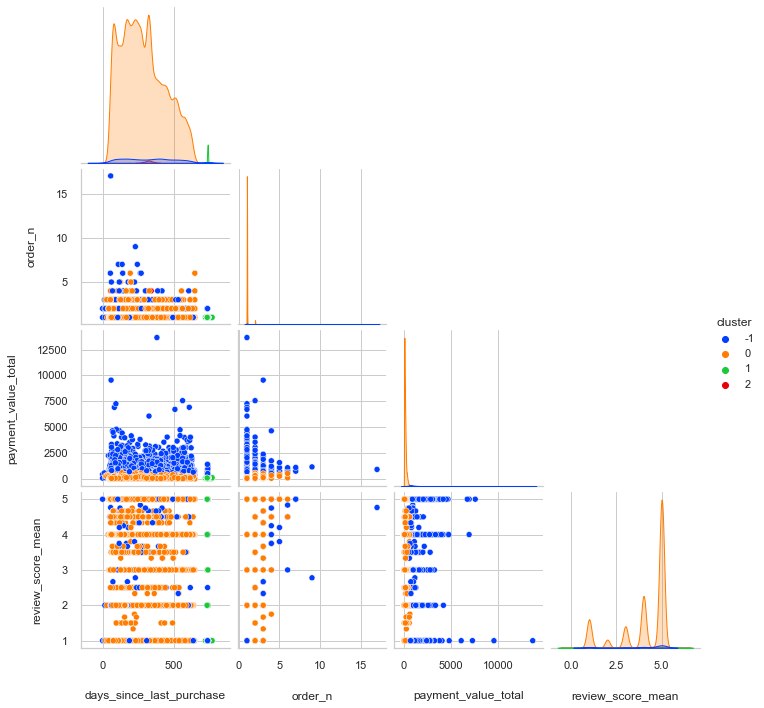

In [128]:
toolbox.pairplot_clusters(X_rfm_reviews,
                          dbscan_rfm_reviews_4.labels_,
                          palette='bright'
                          )

On ne voit pas grand chose sauf que : 
- cluster bleu (-1): clients qui dépensent le plus
- cluster vert (1) : clients les plus anciens qui dépensent peu

Boxplot : 

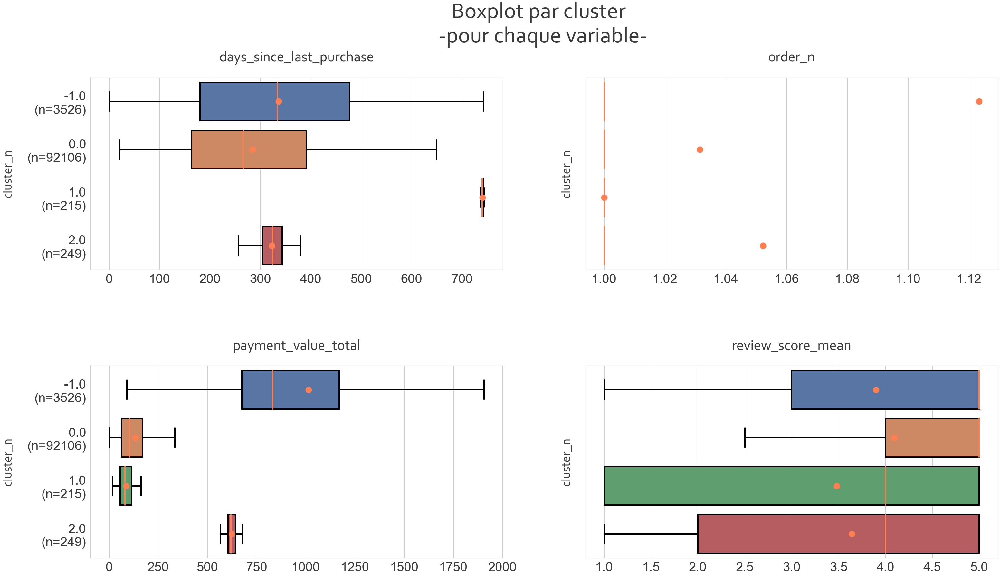

In [129]:
X_rfm_boxplot = toolbox.reshape_data_for_boxplot(X_rfm_reviews, 'cluster',
                                                 dbscan_rfm_reviews_4.labels_
                                                 )
toolbox.plot_boxplot_by_dimension(X_rfm_boxplot,
                                  X_rfm_reviews.columns.values, 2,
                                  'par cluster \n -pour chaque variable-',
                                  (40, 25), 'cluster_n', True, top=0.85, hspace=0.5
                                  )

De nouveau, les groupes sont disproportionnés et difficiles à interpréter : 
- cluster orange (0) : regroupe la majorité des clients
- cluster vert (1) : clients les plus anciens qui n'ont passé qu'une seule commande

<h5 style="font-family:Corbel Light; color:#737373">Evaluation</h5>

Regardons si les clusters obtenus sont standardisés

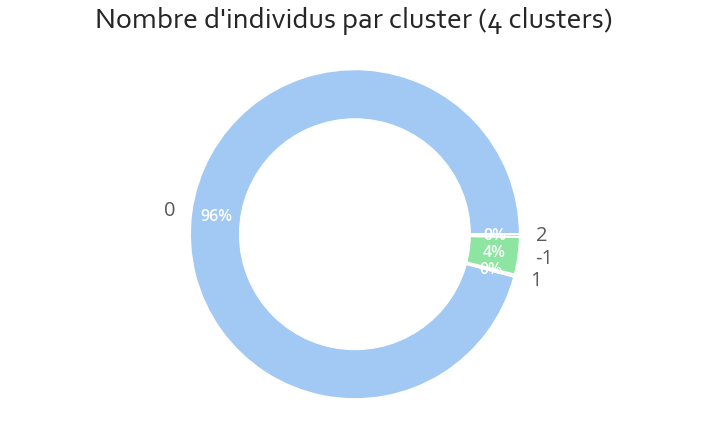

In [130]:
X_rfm_reviews_cluster = pd.DataFrame(dbscan_rfm_reviews_4.labels_,
                                     columns=['cluster'])

toolbox.plot_donut(X_rfm_reviews_cluster, 'cluster', 'Nombre d\'individus par cluster (4 clusters)',
                   (10, 6), colors={'outside': sns.color_palette('pastel')}
                   )

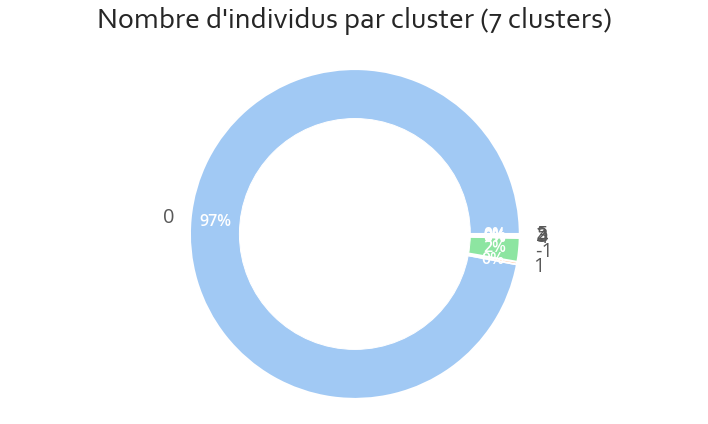

In [131]:
X_rfm_reviews_cluster = pd.DataFrame(dbscan_rfm_reviews_7.labels_,
                                     columns=['cluster']
                                     )

toolbox.plot_donut(X_rfm_reviews_cluster, 'cluster', 'Nombre d\'individus par cluster (7 clusters)',
                   (10, 6), colors={'outside': sns.color_palette('pastel')}
                   )

--- 

---

**Echantillon de données standardisées**

In [132]:
kmeans = KMeans(n_clusters=1000, n_init=10, random_state=8)
kmeans.fit(X_rfm_reviews_scaled)

KMeans(n_clusters=1000, n_init=10, random_state=8)

In [133]:
centroids = kmeans.cluster_centers_
centroids_scaled = StandardScaler().fit_transform(centroids)
centroids_df = pd.DataFrame(centroids, columns=X_rfm_reviews.columns.values)
centroids_df.shape

(1000, 4)

*Choix des hyperparamètres*

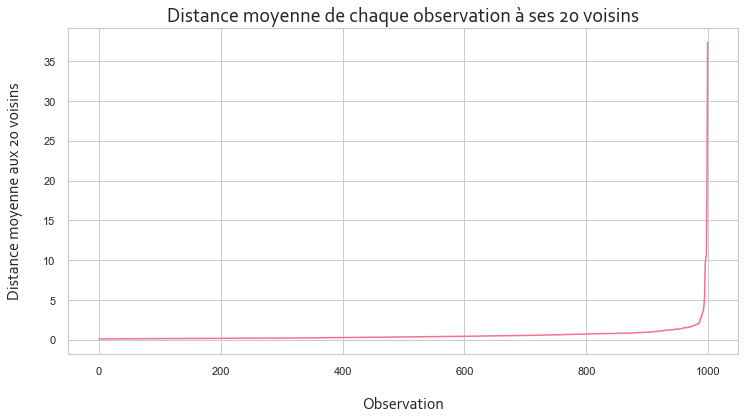

In [134]:
n_min = 20
toolbox.display_neighbors_distance_elbow(centroids, n_min, (12, 6), palette='husl')

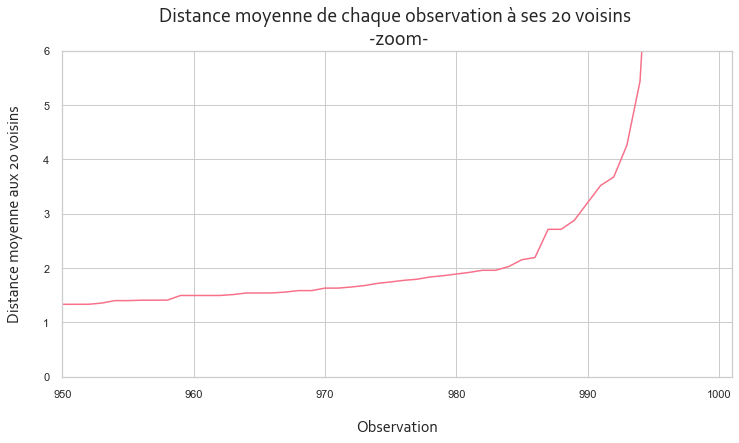

In [135]:
toolbox.display_neighbors_distance_elbow(centroids, n_min, (12, 6), True,
                                         [950, 1001], [0, 6],
                                         palette='husl'
                                         )

In [136]:
dbscan_6 = DBSCAN(min_samples=6, eps=3.8).fit(centroids)
print('Pour 6 voisins on obtient {} clusters'.format(
    len(np.unique(dbscan_6.labels_))))

Pour 6 voisins on obtient 5 clusters


In [137]:
dbscan_20 = DBSCAN(min_samples=20, eps=4).fit(centroids)
print('Pour 20 voisins on obtient {} clusters'.format(
    len(np.unique(dbscan_20.labels_))))

Pour 20 voisins on obtient 4 clusters


*Visualisation des données*

Pour 6 voisins - 5 clusters

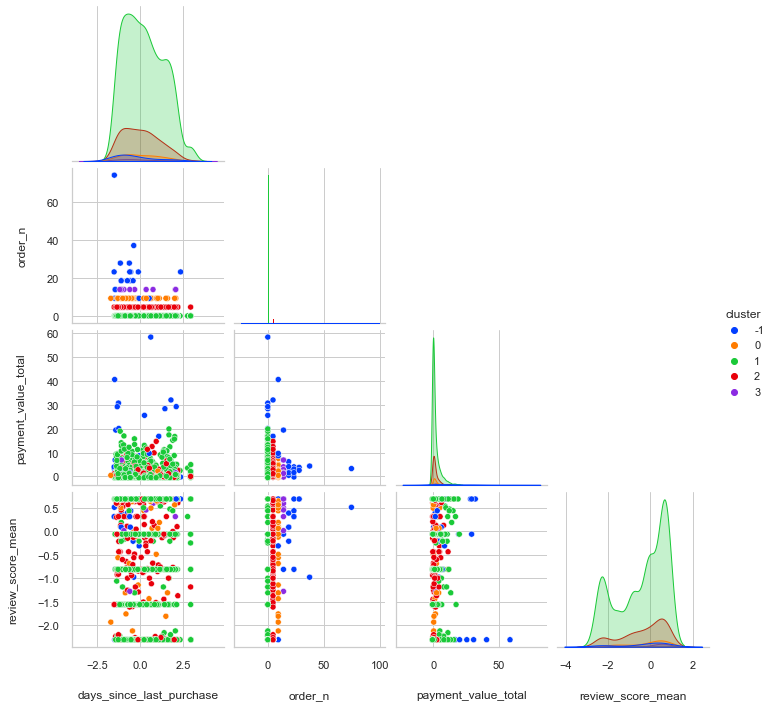

In [138]:
toolbox.pairplot_clusters(centroids_df, dbscan_6.labels_, palette='bright')

- cluster bleu (-1) : outliers - clients qui commandent et/ou dépensent le plus

Les clients ont de nouveau l'air d'être regroupés en fonction du nombre de commandes passées:
- cluster vert (1) : clients qui commandent le moins
- cluster rouge (2) : clients qui commandent peu
- cluster orange (0) : clients qui commandent "moyennement"
- cluster violet (3) : clients qui commandent "beaucoup"

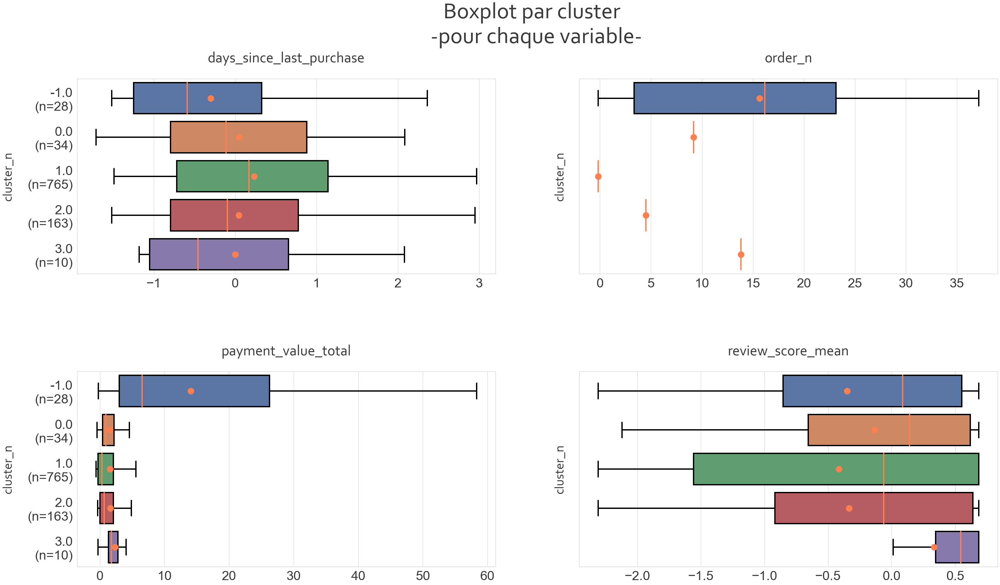

In [139]:
X_rfm_reviews_boxplot = toolbox.reshape_data_for_boxplot(centroids_df, 'cluster',
                                                         dbscan_6.labels_
                                                         )
toolbox.plot_boxplot_by_dimension(X_rfm_reviews_boxplot,
                                  X_rfm_reviews.columns.values, 2,
                                  'par cluster \n -pour chaque variable-',
                                  (40, 25), 'cluster_n', True, top=0.85, hspace=0.5
                                  )

*Evaluation*

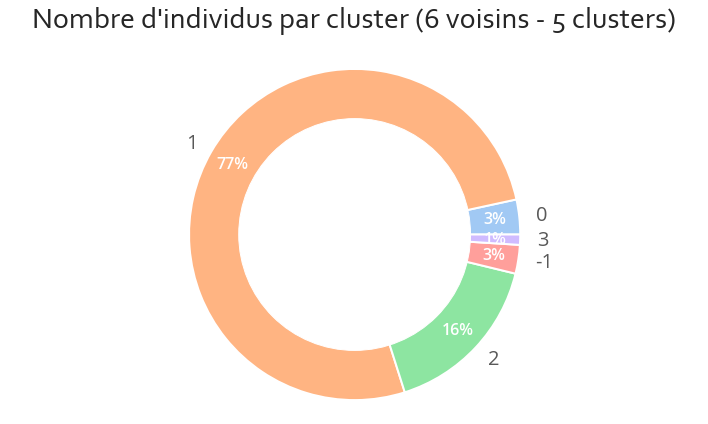

In [140]:
X_rfm_reviews_cluster = pd.DataFrame(dbscan_6.labels_,
                                     columns=['cluster']
                                     )

toolbox.plot_donut(X_rfm_reviews_cluster, 'cluster', 'Nombre d\'individus par cluster (6 voisins - 5 clusters)',
                   (10, 6), colors={'outside': sns.color_palette('pastel')}
                   )

<h4 style="font-family:Corbel Light; color:#737373">5 variables : rfm + nombre moyen de produits + note moyenne</h4>

In [141]:
X = customer_data
X_scaled = StandardScaler().fit_transform(X)
X_scaled.shape

(96096, 5)

**Ensemble du jeu de données non standardisé**

<h5 style="font-family:Corbel Light; color:#737373">Choix des paramètres</h5>

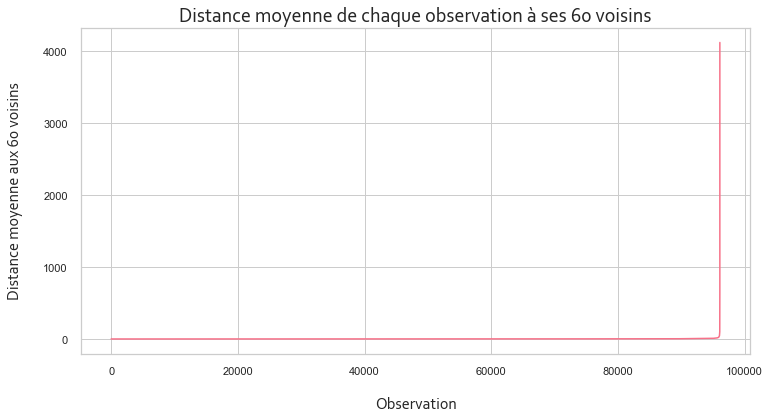

In [142]:
n_min = 60
toolbox.display_neighbors_distance_elbow(X, n_min, (12, 6), palette='husl')

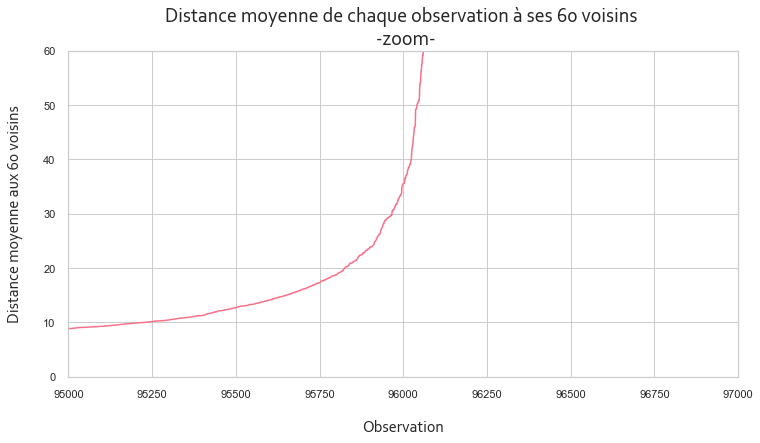

In [143]:
toolbox.display_neighbors_distance_elbow(X, n_min, (12, 6), True,
                                         [95_000, 97_000], [0, 60],
                                         palette='husl'
                                         )

In [144]:
dbscan_7 = DBSCAN(min_samples=40, eps=30).fit(X)
print('Pour 40 voisins on obtient {} clusters'.format(len(np.unique(dbscan_7.labels_))))
dbscan_3 = DBSCAN(min_samples=60, eps=30).fit(X)
print('Pour 60 voisins on obtient {} clusters'.format(len(np.unique(dbscan_3.labels_))))
dbscan_4 = DBSCAN(min_samples=70, eps=30).fit(X)
print('Pour 70 voisins on obtient {} clusters'.format(len(np.unique(dbscan_4.labels_))))

Pour 40 voisins on obtient 7 clusters
Pour 60 voisins on obtient 3 clusters
Pour 70 voisins on obtient 4 clusters


<h5 style="font-family:Corbel Light; color:#737373">Visualisation des données</h5>

Pour 4 clusters

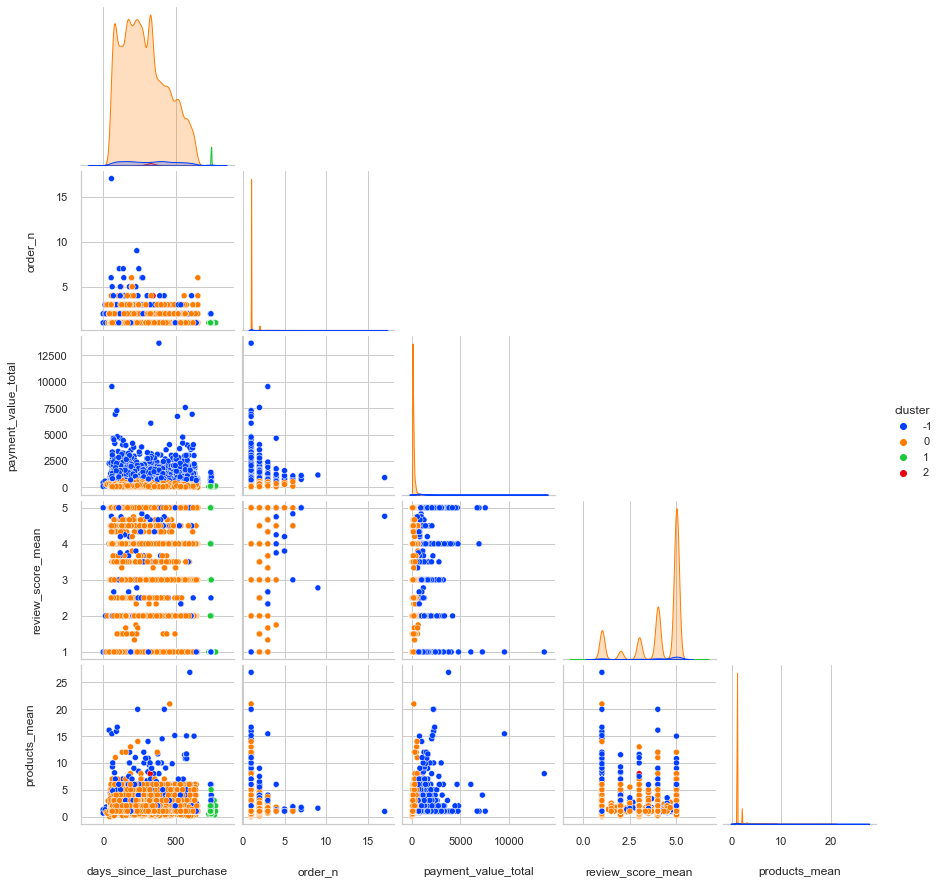

In [145]:
toolbox.pairplot_clusters(X, dbscan_4.labels_, palette='bright')

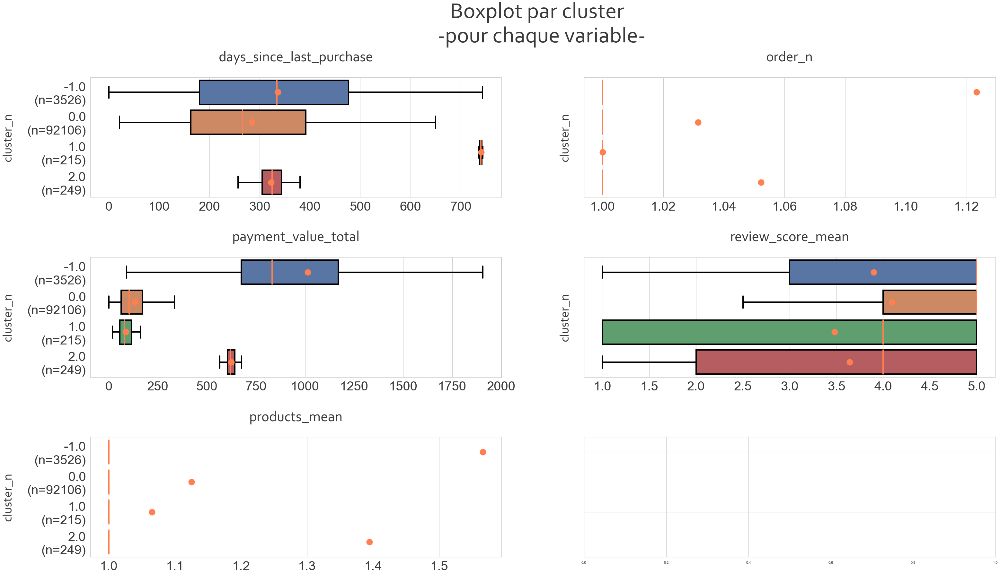

In [146]:
X_boxplot = toolbox.reshape_data_for_boxplot(X, 'cluster',
                                             dbscan_4.labels_
                                             )
toolbox.plot_boxplot_by_dimension(X_boxplot,
                                  X.columns.values, 2,
                                  'par cluster \n -pour chaque variable-',
                                  (40, 25), 'cluster_n', True, top=0.85, hspace=0.5
                                  )

<h5 style="font-family:Corbel Light; color:#737373">Evaluation</h5>

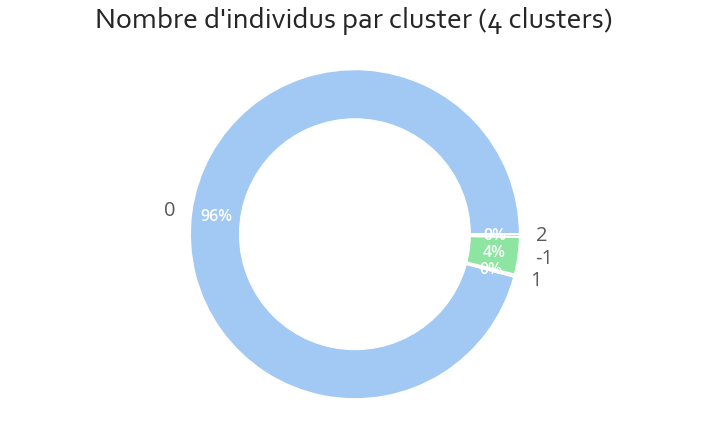

In [147]:
X_cluster = pd.DataFrame(dbscan_4.labels_, columns=['cluster'])

toolbox.plot_donut(X_cluster, 'cluster', 'Nombre d\'individus par cluster (4 clusters)',
                   (10, 6), colors={'outside': sns.color_palette('pastel')}
                   )

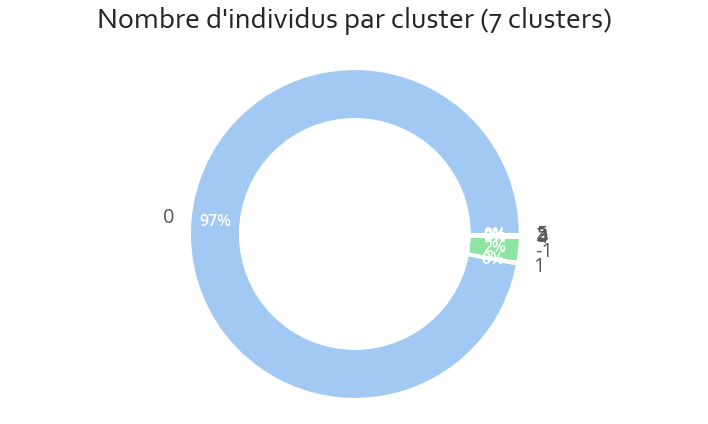

In [148]:
X_cluster = pd.DataFrame(dbscan_7.labels_, columns=['cluster'])

toolbox.plot_donut(X_cluster, 'cluster', 'Nombre d\'individus par cluster (7 clusters)',
                   (10, 6), colors={'outside': sns.color_palette('pastel')}
                   )

**Echantillon de données standardisées**

In [149]:
kmeans = KMeans(n_clusters=1000, n_init=10, random_state=8)
kmeans.fit(X_scaled)

KMeans(n_clusters=1000, n_init=10, random_state=8)

In [150]:
centroids = kmeans.cluster_centers_
centroids_scaled = StandardScaler().fit_transform(centroids)
centroids_df = pd.DataFrame(centroids_scaled, columns=X.columns.values)
centroids_df.shape

(1000, 5)

*Choix des hyperparamètres*

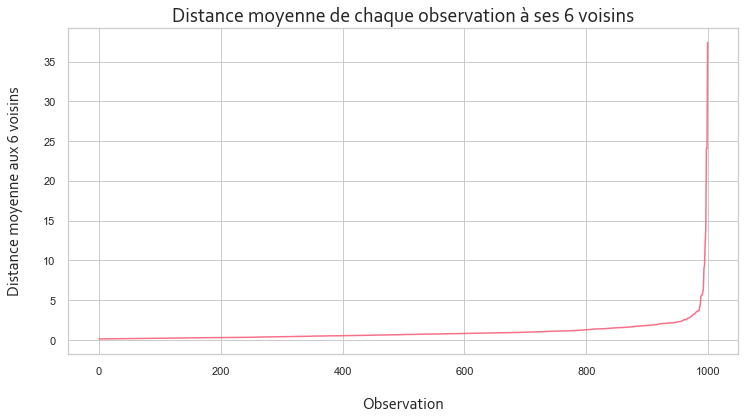

In [151]:
n_min = 6
toolbox.display_neighbors_distance_elbow(
    centroids, n_min, (12, 6), palette='husl')

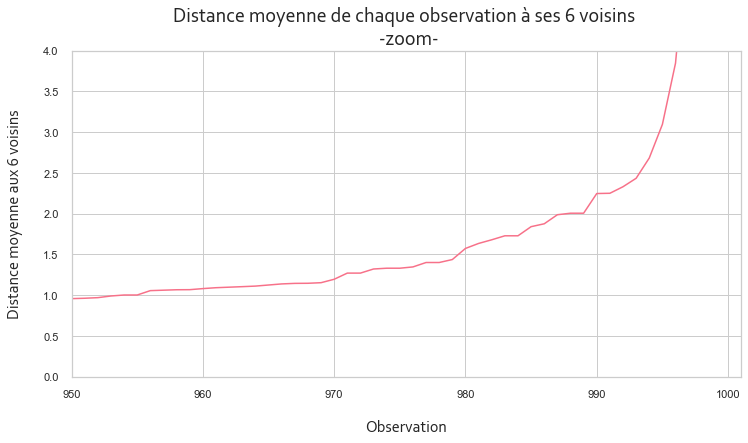

In [152]:
toolbox.display_neighbors_distance_elbow(centroids_scaled, n_min, (12, 6), True,
                                         [950, 1001], [0, 4],
                                         palette='husl'
                                         )

In [153]:
dbscan_6 = DBSCAN(min_samples=6, eps=1.1).fit(centroids_scaled)
print('Pour 6 voisins on obtient {} clusters'.format(
    len(np.unique(dbscan_6.labels_))))

Pour 6 voisins on obtient 5 clusters


*Visualisations*

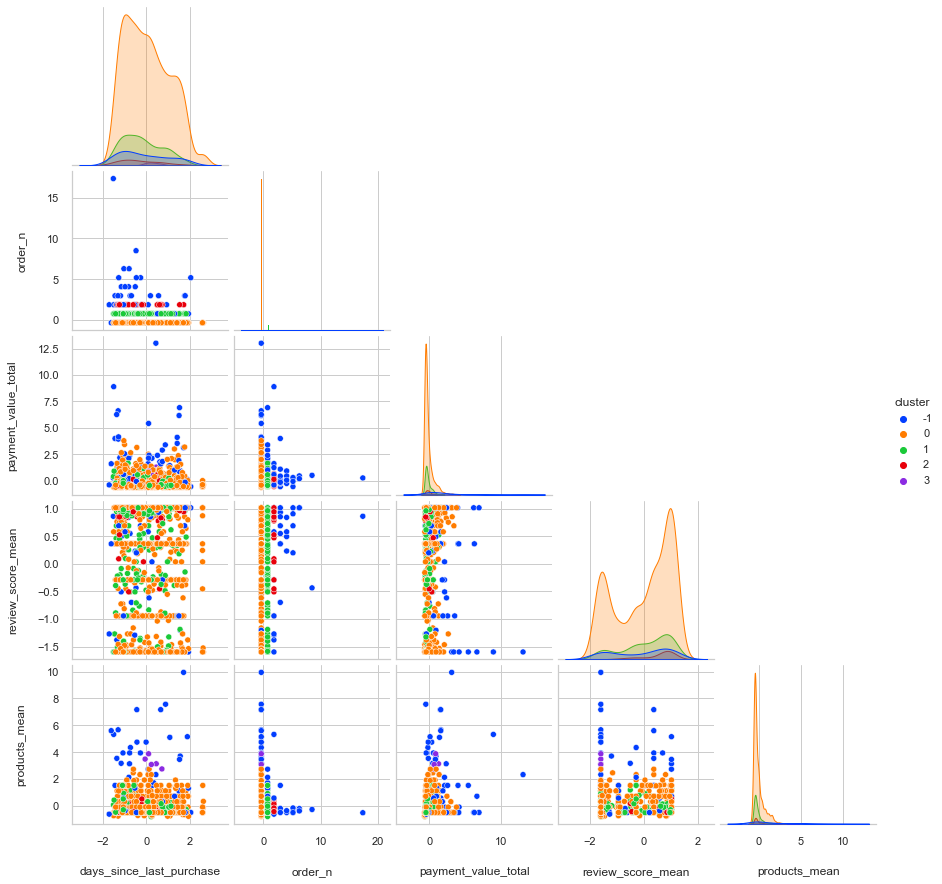

In [154]:
toolbox.pairplot_clusters(centroids_df, dbscan_6.labels_, palette='bright')

Les clusters sont encore une fois assez difficiles à interpréter.

- cluster bleu (-1) : outliers - clients qui achètent le plus de produits par commande et/ou dépensent le plus et/ou passent le plus de commandes
- cluster orange (0) : clients qui passent peu de commandes
- cluster violet (3) : clients qui passent peu de commandes, achètent beaucoup de produits par commande et sont plutôt mécontents
- cluster vert (1) : clients qui commandent "moyennement"
- cluster rouge (2) : clients qui commandent "beaucoup" et sont plutôt contents

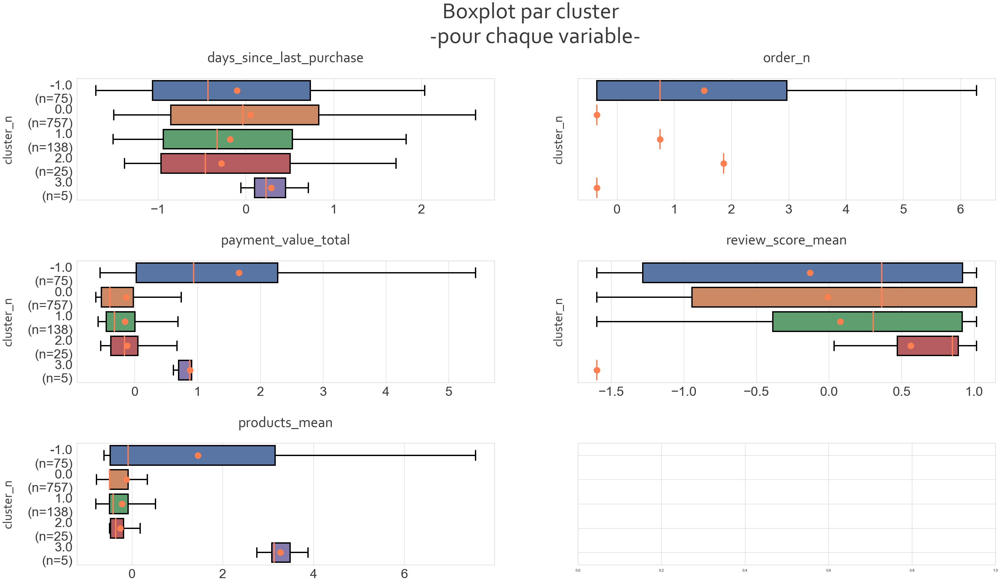

In [155]:
X_boxplot = toolbox.reshape_data_for_boxplot(centroids_df, 'cluster',
                                             dbscan_6.labels_
                                             )
toolbox.plot_boxplot_by_dimension(X_boxplot,
                                  X.columns.values, 2,
                                  'par cluster \n -pour chaque variable-',
                                  (40, 25), 'cluster_n', True, top=0.85, hspace=0.5
                                  )

*Evaluation*

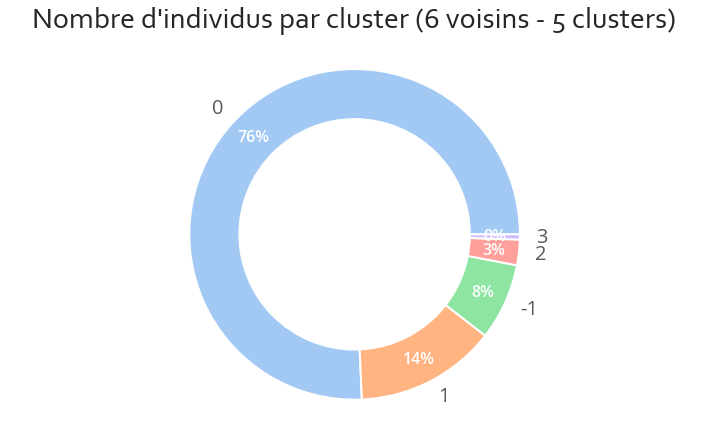

In [156]:
X_cluster = pd.DataFrame(dbscan_6.labels_, columns=['cluster'])

toolbox.plot_donut(X_cluster, 'cluster', 'Nombre d\'individus par cluster (6 voisins - 5 clusters)',
                   (10, 6), colors={'outside': sns.color_palette('pastel')}
                   )

<h4 style="font-family:Corbel Light; color:#737373">Conclusion</h4>

J'ai eu des difficultés à faire fonctionner DBSCAN correctement sur ce jeu de données. La recherche des "bons" hyperparamètres est assez délicate et je n'arrive pas à faire tourner l'algorithme sur le jeu de données entier standardisé (peut être un problème d'espace mémoire disponible insuffisant). 

De plus, que ce soit sur le jeu de données entier non standardisé ou un échantillon standardisé de 1000 individus représentatifs du jeu de données, les résultats sont peu convaincants. En effet, les clusters obtenus sont difficilement interprétables et très déséquilibrés (un des clusters capte plus de 70% des individus).

DBSCAN ne semble donc pas adapté à notre problématique.

<h2 style="font-family:Corbel Light; color:#737373"><span style="color:#00ced1">Conclusion</span></h2>

Kmeans est l'algorithme d’apprentissage le plus adapté à notre problématique. 

Le modèle avec 4 variables (RFM + note moyenne) et 5 clusters nous semble le meilleur car il permet de distinguer les "bons" clients des moins bons clients ainsi que les clients insatisaits et est facilement interprétable par le marketing. On obtient donc une segmentation sur 5 profils clients :

- new customers : nouveaux clients que l'on va chercher à fidéliser
- one time shoppers : clients qui ont acheté une fois, ne sont pas mécontents de leur achat mais ne sont jamais revenu, il serait interessant de comprendre pourquoi.
- loyal customers : les clients fidèles
- dissatisfied customers : les clients mécontents, il serait interessant de comprendre pourquoi
- spendthrifts : les clients qui dépensent beaucoup à chaque achat, on va chercher à les fidéliser